In [1]:
import tensorflow as tf
tf.__version__

'2.8.0'

In [2]:
!pip install -r requirements.txt

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [3]:
import pickle
import gensim
data = pickle.load(open("image_vectors.p", "rb"))
word_vector = pickle.load(open("word_vector_min_bird.p", "rb"))
model = gensim.models.KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)

768
11840
11840
Black_Footed_Albatross_0001_796111.jpg
Black_Footed_Albatross_0001_796111.jpg
Black_Footed_Albatross_0002_55.jpg
Black_Footed_Albatross_0003_796136.jpg
Black_Footed_Albatross_0005_796090.jpg
Black_Footed_Albatross_0006_796065.jpg
Black_Footed_Albatross_0007_796138.jpg
Black_Footed_Albatross_0008_796083.jpg
Black_Footed_Albatross_0009_34.jpg


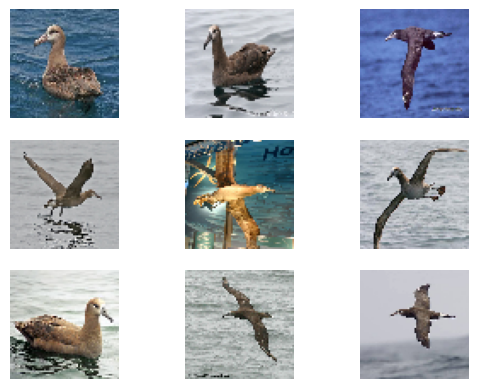

In [4]:

import matplotlib.pyplot as pyplot
from keras.preprocessing.image import array_to_img
from numpy import expand_dims
from random import randint, choice

def random_flip(image):
    image = tf.image.flip_left_right(image)
    return image.numpy()

def random_jitter(image):
    image = expand_dims(image, 0) #add additional dimension necessary for zooming
    image = image_augmentation_generator.flow(image, batch_size=1)
    result = image[0].reshape(image[0].shape[1:]) #remove additional dimension (1, 64, 64, 3) to (64, 64, 3)
    return result

image_augmentation_generator = tf.keras.preprocessing.image.ImageDataGenerator(zoom_range=[0.8, 1.0]) # random zoom proves to be helpful in capturing more details https://machinelearningmastery.com/how-to-configure-image-data-augmentation-when-training-deep-learning-neural-networks/

n = 227
image_embeddings = []
captions = []
labels = []
for i, k in enumerate(data.keys()):
    image_embeddings.append(data[k])
    captions.append(word_vector[k])
    #print(word_vector[k])
    labels.append(k)
    #print(k)
    if i % n == 0:
        image_embeddings.append(random_jitter(data[k]))
        captions.append(word_vector[k])
        labels.append(k)

print(len(word_vector[k]))
print(len(captions))
print(len(image_embeddings))

pyplot.axis('off')
slcie = image_embeddings[40:50]
for i in range(9):
    pyplot.subplot(3, 3, i+1)
    pyplot.imshow(array_to_img(slcie[i]))
    print(labels[i])
    pyplot.axis('off')

pyplot.show()

In [5]:
import numpy as np

def get_random_word_vectors_from_dataset(n_samples):
  ix = np.random.randint(0, len(captions), n_samples)
  return np.asarray(captions)[ix]


In [6]:
choice(model.index_to_key)

'Debian_Fedora'

In [7]:
len(model[choice(model.index_to_key)])

300

In [8]:
result_array = np.empty((0, 300))

In [9]:
choice(model.index_to_key)

'República'

In [10]:
def generate_random_vectors(n_samples):  
  vectorized_random_captions = []

  for n in range(n_samples):
    rnd = randint(8, 25)
    result_array = np.empty((0, 300))
    for i in range(1):
     result_array = np.append(result_array, [model[choice(model.index_to_key)]], axis=0)
    vectorized_random_captions.append(np.mean(result_array, axis=0).astype('float32'))

  return np.array(vectorized_random_captions)

In [11]:
import tensorflow_hub as hub
import tensorflow_text
preprocess_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'
encoder_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_preprocess_model = hub.KerasLayer(preprocess_url)
bert_model = hub.KerasLayer(encoder_url)

In [12]:
def create_sent_vector(sent):
    sent = [sent]
    text_preprocessed = bert_preprocess_model(sent)
    final = bert_model(text_preprocessed)
    return final['pooled_output'].numpy()

In [13]:
def generate_random_vectors(n_samples):  
  vectorized_random_captions = []

  for n in range(n_samples):
    rnd = randint(8, 25)
    result_array = np.empty((0, 300))
    for i in range(1):
     result_array = np.append(result_array, [model[choice(model.index_to_key)]], axis=0)
    vectorized_random_captions.append(np.mean(result_array, axis=0).astype('float32'))

  return np.array(vectorized_random_captions)

In [14]:
def generate_random_vectors(n_samples):  
  vectorized_random_captions = []

  for n in range(n_samples):
    rnd = randint(8, 25)
    result_array = np.empty((0, 768))
    for i in range(1):
     result_array = np.append(result_array, lbs[randint(0,11830)], axis=0)
    vectorized_random_captions.append(np.mean(result_array, axis=0).astype('float32'))

  return np.array(vectorized_random_captions)

In [15]:
def generate_random_vectors(n_samples):  
    vectorized_random_captions = []
    #print(n_samples)
    for n in range(n_samples): #batch size
        rnd = randint(8, 25) # number of tokens in a sentence
        result_array = np.empty((0, 768)) #embedding size (will change)
        rand_sentence = []
        s = ''
        for i in range(rnd):
            if (i==rnd-1):
                s = s + choice(model.index_to_key)
                continue
            s = s + choice(model.index_to_key) + ' '
            #rand_sentence.append(choice(model.index_to_key))
            #result_array = np.append(result_array, [model[choice(model.index_to_key)]], axis=0) #embedding vector for the sentence
        result_array = np.append(result_array, create_sent_vector(s),axis =0 )
        #print(result_array.shape)
        rand_sentence.append(s)
        #result_array = np.append(result_array, rand_sentence, axis=0)
        vectorized_random_captions.append(result_array.astype('float32')) # final list

    return np.array(vectorized_random_captions).reshape(n_samples,768)

In [16]:
#lbs[1].reshape(1,768)

In [17]:
def generate_random_vectors(n_samples):  
  vectorized_random_captions = []

  for n in range(n_samples):
    rnd = randint(8, 25)
    result_array = np.empty((0, 768))
    for i in range(rnd):
     result_array = np.append(result_array, lbs[randint(0,11830)].reshape(1,768), axis=0)
    vectorized_random_captions.append(np.mean(result_array, axis=0).astype('float32'))

  return np.array(vectorized_random_captions)

In [18]:
#lola = generate_random_vectors(32)

In [19]:
#type(lola)

In [20]:
#lola.shape

In [21]:
from keras.preprocessing.image import array_to_img

from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy import vstack
from numpy import asarray
import numpy as np

import os
from keras.callbacks import ModelCheckpoint
from keras.initializers import RandomNormal
from numpy.random import random
from tensorflow.keras import layers
from tensorflow.keras import Model
from numpy.random import randn
from numpy.random import randint
import time
from keras.layers.advanced_activations import PReLU
from tensorflow.keras.utils import plot_model

In [22]:


# Discriminator model
def define_discriminator():
    word_vector_dim = 768
    dropout_prob = 0.4

    in_label = layers.Input(shape=(768,))
    #li = layers.Dense(300)(in_label)
    n_nodes = 3 * 64 * 64
    li = layers.Dense(n_nodes)(in_label)
    li = layers.Reshape((64, 64, 3))(li)

    dis_input = layers.Input(shape=(64, 64, 3))

    merge = layers.Concatenate()([dis_input, li])

    discriminator = layers.Conv2D(filters=64, kernel_size=(3, 3), padding="same")(merge)
    discriminator = layers.LeakyReLU(0.2)(discriminator)
    discriminator = layers.GaussianNoise(0.2)(discriminator)

    discriminator = layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(2, 2), padding="same")(discriminator)
    discriminator = layers.BatchNormalization(momentum=0.5)(discriminator)
    discriminator = layers.LeakyReLU()(discriminator)

    discriminator = layers.Conv2D(filters=128, kernel_size=(3, 3), padding="same")(discriminator)
    discriminator = layers.BatchNormalization(momentum=0.5)(discriminator)
    discriminator = layers.LeakyReLU(0.2)(discriminator)

    discriminator = layers.Conv2D(filters=128, kernel_size=(3, 3), strides=(2, 2), padding="same")(discriminator)
    discriminator = layers.BatchNormalization(momentum=0.5)(discriminator)
    discriminator = layers.LeakyReLU(0.2)(discriminator)

    discriminator = layers.Conv2D(filters=256, kernel_size=(3, 3), padding="same")(discriminator)
    discriminator = layers.BatchNormalization(momentum=0.5)(discriminator)
    discriminator = layers.LeakyReLU(0.2)(discriminator)

    discriminator = layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(2, 2), padding="same")(discriminator)
    discriminator = layers.BatchNormalization(momentum=0.5)(discriminator)
    discriminator = layers.LeakyReLU(0.2)(discriminator)

    discriminator = layers.Conv2D(filters=512, kernel_size=(3, 3), padding="same")(discriminator)
    discriminator = layers.BatchNormalization(momentum=0.5)(discriminator)
    discriminator = layers.LeakyReLU(0.2)(discriminator)

    discriminator = layers.Flatten()(discriminator)

    discriminator = layers.Dense(1024)(discriminator)

    discriminator = layers.LeakyReLU(0.2)(discriminator)

    discriminator = layers.Dense(1)(discriminator)

    discriminator_model = Model(inputs=[dis_input, in_label], outputs=discriminator)

    #discriminator_model.summary()

    return discriminator_model


def resnet_block(model, kernel_size, filters, strides):
    gen = model
    model = layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=strides, padding="same")(model)
    model = layers.BatchNormalization(momentum=0.5)(model)
    model = tf.keras.layers.PReLU(alpha_initializer='zeros', alpha_regularizer=None, alpha_constraint=None, shared_axes=[1, 2])(model)
    model = layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=strides, padding="same")(model)
    model = layers.BatchNormalization(momentum=0.5)(model)
    model = layers.Add()([gen, model])
    return model


# Generator model
def define_generator():
    kernel_init = tf.random_normal_initializer(stddev=0.02)
    batch_init = tf.random_normal_initializer(1., 0.02)

    random_input = layers.Input(shape=(100,))
    text_input1 = layers.Input(shape=(768,))
    #text_layer1 = layers.Dense(300)(text_input1)
    text_layer2 = layers.Dense(8192)(text_input1)
    text_layer3 = layers.Reshape((8, 8, 128))(text_layer2)

    n_nodes = 128 * 8 * 8
    gen_input_dense = layers.Dense(n_nodes)(random_input)
    generator = layers.Reshape((8, 8, 128))(gen_input_dense)

    merge = layers.Concatenate()([generator, text_layer3])

    model = layers.Conv2D(filters=64, kernel_size=9, strides=1, padding="same")(merge)
    model = tf.keras.layers.PReLU(alpha_initializer='zeros', alpha_regularizer=None, alpha_constraint=None, shared_axes=[1, 2])(model)

    gen_model = model

    for _ in range(4):
      model = resnet_block(model, 3, 64, 1)

    model = layers.Conv2D(filters=64, kernel_size=3, strides=1, padding="same")(model)
    model = layers.BatchNormalization(momentum=0.5)(model)
    model = layers.Add()([gen_model, model])

    model = layers.Conv2DTranspose(filters=512, kernel_size=(3, 3), strides=(2, 2), padding="same", kernel_initializer=kernel_init)(model)
    model = layers.LeakyReLU(0.2)(model)

    model = layers.Conv2DTranspose(filters=256, kernel_size=(3, 3), strides=(2, 2), padding="same", kernel_initializer=kernel_init)(model)
    model = layers.LeakyReLU(0.2)(model)

    model = layers.Conv2DTranspose(filters=128, kernel_size=(3, 3), strides=(2, 2), padding="same", kernel_initializer=kernel_init)(model)
    model = layers.LeakyReLU(0.2)(model)

    model = layers.Conv2DTranspose(filters=64, kernel_size=(3, 3), strides=(1, 1), padding="same", kernel_initializer=kernel_init)(model)
    model = layers.LeakyReLU(0.2)(model)

    model = layers.Conv2D(3, (3, 3), padding='same', activation='tanh')(model)

    generator_model = Model(inputs=[random_input, text_input1], outputs=model)

    #generator_model.summary()

    return generator_model

In [23]:
g_plot = define_generator()

In [24]:
from tensorflow.keras.utils import plot_model

In [25]:
!apt install graphviz -y

Reading package lists... Done
Building dependency tree       
Reading state information... Done
graphviz is already the newest version (2.42.2-3build2).
0 upgraded, 0 newly installed, 0 to remove and 5 not upgraded.


In [26]:
!pip install pydot
!pip install graphviz
!pip install pydotplus

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [27]:
import pydot
import pydotplus
import graphviz


In [28]:
disc_plot = define_discriminator()

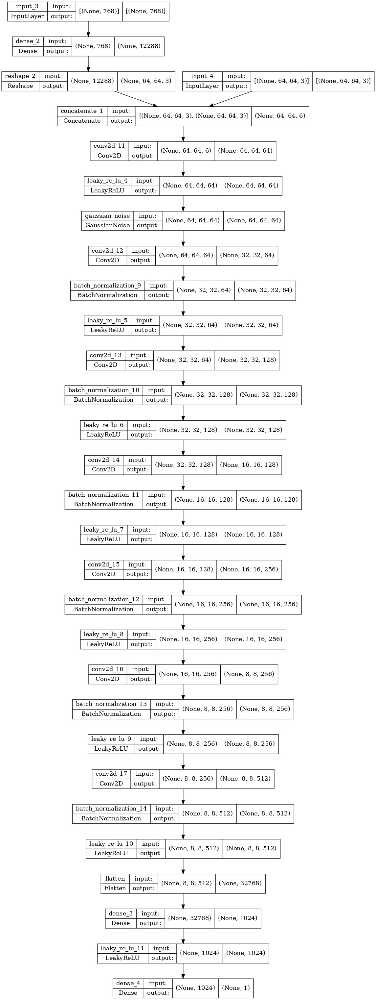

In [29]:
plot_model(disc_plot,to_file="disc_model_bert.png",show_shapes=True,dpi=92)

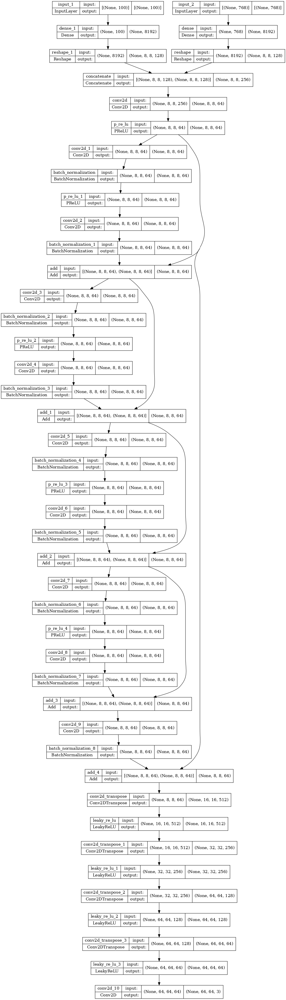

In [30]:
plot_model(g_plot,to_file="gen_model_bert.png",show_shapes=True,dpi=92)

In [31]:
g_plot.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 100)]        0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 768)]        0           []                               
                                                                                                  
 dense_1 (Dense)                (None, 8192)         827392      ['input_1[0][0]']                
                                                                                                  
 dense (Dense)                  (None, 8192)         6299648     ['input_2[0][0]']                
                                                                                              

                                                                                                  
 batch_normalization_8 (BatchNo  (None, 8, 8, 64)    256         ['conv2d_9[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 add_4 (Add)                    (None, 8, 8, 64)     0           ['p_re_lu[0][0]',                
                                                                  'batch_normalization_8[0][0]']  
                                                                                                  
 conv2d_transpose (Conv2DTransp  (None, 16, 16, 512)  295424     ['add_4[0][0]']                  
 ose)                                                                                             
                                                                                                  
 leaky_re_

In [32]:
from IPython.display import clear_output


def generate_latent_points(latent_dim, n_samples):
    x_input  = tf.random.normal([n_samples, latent_dim])
    text_captions = get_random_word_vectors_from_dataset(n_samples)
    return [x_input, text_captions]

# Randomly flip some labels. Credits to https://machinelearningmastery.com/how-to-code-generative-adversarial-network-hacks/
def noisy_labels(y, p_flip):
    n_select = int(p_flip * int(y.shape[0]))
    flip_ix = np.random.choice([i for i in range(int(y.shape[0]))], size=n_select)

    op_list = []
    for i in range(int(y.shape[0])):
        if i in flip_ix:
            op_list.append(tf.subtract(1.0, y[i]))
        else:
            op_list.append(y[i])

    outputs = tf.stack(op_list)
    return outputs

def load_data():
    return asarray(image_embeddings), asarray(captions).astype('float32')

def smooth_positive_labels(y):
	return y - 0.3 + (np.random.random(y.shape) * 0.5)
 
def smooth_negative_labels(y):
	return y + np.random.random(y.shape) * 0.3

def generate_and_save_images(model, epoch, test_input):
  predictions = model(test_input, training=False)

  print(predictions.shape)
  pyplot.figure(figsize=[7, 7])

  for i in range(predictions.shape[0]):
      pyplot.subplot(5, 5, i+1)
      pyplot.imshow(array_to_img(predictions.numpy()[i]))
      pyplot.axis('off')

  pyplot.savefig('bert_results_encoded/image_at_epoch_{:04d}.png'.format(epoch))
  pyplot.show()


def discriminator_loss(r_real_output_real_text, f_fake_output_real_text_1, f_real_output_fake_text):
   alpha = 0.5
   real_output_noise = smooth_positive_labels(noisy_labels(tf.ones_like(r_real_output_real_text), 0.10))
   fake_output_real_text_noise_1 = smooth_negative_labels(tf.zeros_like(f_fake_output_real_text_1))
   real_output_fake_text_noise = smooth_negative_labels(tf.zeros_like(f_real_output_fake_text))

   real_loss = tf.reduce_mean(binary_cross_entropy(real_output_noise, r_real_output_real_text))
   fake_loss_ms_1 = tf.reduce_mean(binary_cross_entropy(fake_output_real_text_noise_1, f_fake_output_real_text_1))
   fake_loss_2 = tf.reduce_mean(binary_cross_entropy(real_output_fake_text_noise, f_real_output_fake_text))

   total_loss = real_loss + alpha * fake_loss_2 + (1-alpha) * fake_loss_ms_1 
   return total_loss

def generator_loss(f_fake_output_real_text):
   return tf.reduce_mean(binary_cross_entropy(tf.ones_like(f_fake_output_real_text), f_fake_output_real_text))

@tf.function
def train_step(images, epoch,n_batch):

    #define half_batch
  latent_dim = 100
  #n_batch = 16
  half_batch = int(n_batch/2)
  noise_1 = tf.random.normal([half_batch, latent_dim])
  noise_2 = tf.random.normal([half_batch, latent_dim])
  real_captions = images[1]
  real_images = images[0]

  random_captions = generate_random_vectors(n_batch)
  random_captions_1, random_captions_2  = tf.split(random_captions, 2, 0)
  real_captions_1, real_captions_2  = tf.split(real_captions, 2 ,0)
  real_images_1, real_images_2 = tf.split(real_images, 2, 0)
  d_loss = 0
  g_loss = 0
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    
    noise = tf.concat([noise_1, noise_2], 0)

    generated_images = generator([noise, real_captions], training=True)

    fake_1, fake_2 = tf.split(generated_images, 2, 0)

    f_fake_output_real_text_1 = discriminator([fake_1, real_captions_1], training=True)
    f_fake_output_real_text_2 = discriminator([fake_2, real_captions_2], training=True)

    r_real_output_real_text_1 = discriminator([real_images_1, real_captions_1], training=True)
    r_real_output_real_text_2 = discriminator([real_images_2, real_captions_2], training=True)

    f_real_output_fake_text_1 = discriminator([real_images_1, random_captions_1], training=True)
    f_real_output_fake_text_2 = discriminator([real_images_2, random_captions_2], training=True)

    #### Calculating losses ####

    gen_loss = generator_loss(f_fake_output_real_text_1) + generator_loss(f_fake_output_real_text_2) 
    # mode seeking loss
    lz = tf.math.reduce_mean(tf.math.abs(fake_2-fake_1)) / tf.math.reduce_mean(tf.math.abs(noise_2-noise_1))
    eps = 1 * 1e-5
    loss_lz = 1 / (eps+lz) * ms_loss_weight
    total_gen_loss = gen_loss + loss_lz
    g_loss = total_gen_loss
    #if epoch % 10 == 0:
     #   tf.print('G_loss', [total_gen_loss])

    disc_loss_1 = discriminator_loss(r_real_output_real_text_1, f_fake_output_real_text_1, f_real_output_fake_text_1)
    disc_loss_2 = discriminator_loss(r_real_output_real_text_2, f_fake_output_real_text_2, f_real_output_fake_text_2)
    
    total_disc_loss = disc_loss_1 + disc_loss_2
    d_loss = total_disc_loss
        
    

    #### Done calculating losses ####
  if epoch % 10 == 0:
    tf.print('D_loss', [total_disc_loss])
    tf.print('G_loss', [g_loss])
  gradients_of_discriminator = disc_tape.gradient(total_disc_loss, discriminator.trainable_variables)  

  gradients_of_generator = gen_tape.gradient(total_gen_loss, generator.trainable_variables)    

  generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))

  discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))


from tqdm.notebook import tqdm
def train(dataset, n_batch,start = 0, epochs = 2000):

  checkpoint_dir = 'checkpoint/bert_encode'
  checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
  checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                discriminator_optimizer=discriminator_optimizer,
                                  generator=generator,
                                  discriminator=discriminator)
  
  ckpt_manager = tf.train.CheckpointManager(checkpoint, checkpoint_dir, max_to_keep=3)
  if ckpt_manager.latest_checkpoint:
    checkpoint.restore(ckpt_manager.latest_checkpoint)  #ckpt_manager.checkpoints[3]
    print ('Latest checkpoint restored!!')

  for epoch in tqdm(range(epochs)):
    start = time.time()
    for image_batch in dataset:
        train_step(image_batch, epoch,n_batch) 

    if (epoch) % 10 == 0:
      [z_input, labels_input] = generate_latent_points(100, 25)
      generate_and_save_images(generator,
                            epoch + 1,
                             [z_input, labels_input])

    if (epoch) % 10 == 0:
      ckpt_save_path = ckpt_manager.save()
      print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,ckpt_save_path))

    if (epoch) % 10 == 0:
      generator.save('models_encoded/46stage_new_gan_animal_model_%03d.h5' % (epoch + 1))     

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))



In [33]:
tf.config.run_functions_eagerly(True)

In [34]:
#gpu_options = tf.compat.v1.GPUOptions(allow_growth=True)
#session = tf.compat.v1.InteractiveSession(config=tf.compat.v1.ConfigProto(gpu_options=gpu_options))

In [35]:
#len(lbs[1])

Latest checkpoint restored!!


  0%|          | 0/2000 [00:00<?, ?it/s]

D_loss [2.93903017]
G_loss [3.27196217]
D_loss [3.46338987]
G_loss [5.3470335]
D_loss [2.80336714]
G_loss [3.1081996]
D_loss [3.04096437]
G_loss [3.7521708]
D_loss [2.75115299]
G_loss [3.62005377]
D_loss [3.41663694]
G_loss [4.20679951]
D_loss [2.81463194]
G_loss [3.62098241]
D_loss [3.16366076]
G_loss [3.48290324]
D_loss [3.56889725]
G_loss [5.87055635]
D_loss [2.63880587]
G_loss [3.5309453]
D_loss [2.85134268]
G_loss [3.43878222]
D_loss [2.90778732]
G_loss [5.52709484]
D_loss [2.31399822]
G_loss [4.60335922]
D_loss [2.77459097]
G_loss [4.15883732]
D_loss [2.62268424]
G_loss [4.07480764]
D_loss [2.95529556]
G_loss [3.89003897]
D_loss [3.49300289]
G_loss [2.52349424]
D_loss [2.68256092]
G_loss [5.01717472]
D_loss [2.62564254]
G_loss [4.70592213]
D_loss [2.90816689]
G_loss [3.5877986]
D_loss [2.57849455]
G_loss [3.16821527]
D_loss [2.95242405]
G_loss [6.21712971]
D_loss [2.9687]
G_loss [2.76214314]
D_loss [3.34991074]
G_loss [2.9626317]
D_loss [3.06552768]
G_loss [4.11687279]
D_loss [2.

D_loss [3.06943893]
G_loss [4.30651188]
D_loss [2.98628116]
G_loss [3.23883772]
D_loss [2.98540497]
G_loss [5.39802122]
D_loss [2.97178102]
G_loss [3.11326838]
D_loss [3.93834782]
G_loss [3.47583532]
D_loss [3.66679573]
G_loss [3.24763393]
D_loss [2.98880529]
G_loss [3.26736474]
D_loss [3.18313599]
G_loss [4.15067482]
D_loss [3.39680147]
G_loss [3.11516619]
D_loss [3.40139818]
G_loss [4.79443693]
D_loss [2.99322939]
G_loss [4.15584135]
D_loss [3.15485358]
G_loss [4.41256571]
D_loss [3.2426734]
G_loss [4.35572243]
D_loss [2.64707756]
G_loss [5.17989635]
D_loss [2.58264685]
G_loss [5.12784243]
D_loss [3.13858557]
G_loss [3.25739384]
D_loss [2.95295382]
G_loss [2.95215654]
D_loss [3.05468798]
G_loss [3.04568863]
D_loss [3.34419727]
G_loss [3.23204088]
D_loss [3.16200972]
G_loss [4.98554468]
D_loss [3.31056547]
G_loss [2.39870119]
D_loss [3.42266941]
G_loss [3.27951]
D_loss [2.7852211]
G_loss [2.84852266]
D_loss [2.52806878]
G_loss [3.41591692]
D_loss [2.85314178]
G_loss [4.12724]
D_loss [

G_loss [2.60797405]
D_loss [2.85770845]
G_loss [6.23143578]
D_loss [3.2324729]
G_loss [4.98603392]
D_loss [2.82788229]
G_loss [3.85032272]
D_loss [3.74488235]
G_loss [2.36709452]
D_loss [3.01258159]
G_loss [3.55934334]
D_loss [2.59087133]
G_loss [3.38847733]
D_loss [2.60725737]
G_loss [3.29294538]
D_loss [2.63744307]
G_loss [3.51260948]
D_loss [3.34892702]
G_loss [4.15337896]
D_loss [3.26747942]
G_loss [4.66865492]
D_loss [3.83867979]
G_loss [2.20115733]
D_loss [2.97050381]
G_loss [3.88024259]
D_loss [3.59687495]
G_loss [5.09166527]
D_loss [3.83789396]
G_loss [3.15257978]
D_loss [2.80108261]
G_loss [4.74009323]
D_loss [2.95464945]
G_loss [4.25606394]
D_loss [2.98296332]
G_loss [3.31428]
D_loss [3.3177352]
G_loss [4.42416859]
D_loss [2.93467331]
G_loss [2.93621635]
D_loss [3.09530687]
G_loss [3.23545599]
D_loss [3.6788559]
G_loss [4.92176628]
D_loss [3.0505991]
G_loss [3.32535315]
D_loss [3.89284706]
G_loss [3.65501881]
D_loss [2.61515903]
G_loss [4.39400434]
D_loss [3.04850125]
G_loss 

G_loss [4.04708958]
D_loss [3.00241637]
G_loss [4.44956207]
D_loss [2.94223309]
G_loss [3.08135796]
D_loss [2.61758971]
G_loss [3.74214888]
D_loss [3.01052642]
G_loss [4.06795549]
D_loss [3.46052933]
G_loss [5.7004571]
D_loss [3.33532166]
G_loss [3.04828382]
D_loss [3.07366323]
G_loss [3.85922]
D_loss [3.32831573]
G_loss [5.05936432]
D_loss [3.10708857]
G_loss [5.1843791]
D_loss [3.13384438]
G_loss [3.94879174]
D_loss [3.5616188]
G_loss [3.65727687]
D_loss [3.27983332]
G_loss [3.30252695]
D_loss [2.60615301]
G_loss [5.26161385]
D_loss [4.00876379]
G_loss [3.29118657]
D_loss [3.51640892]
G_loss [4.52949286]
D_loss [3.81981397]
G_loss [5.15551949]
D_loss [3.63148952]
G_loss [3.40158224]
D_loss [3.26742458]
G_loss [2.5808332]
D_loss [3.07877064]
G_loss [4.59135723]
D_loss [2.97280693]
G_loss [2.92292047]
D_loss [3.02803254]
G_loss [3.14087391]
D_loss [2.79466629]
G_loss [5.2570343]
D_loss [2.82818127]
G_loss [3.58377266]
D_loss [3.1148572]
G_loss [3.49475718]
D_loss [2.76135]
G_loss [3.53

D_loss [2.72501755]
G_loss [5.60829163]
D_loss [2.70055699]
G_loss [5.45683289]
D_loss [2.66959977]
G_loss [4.87059402]
D_loss [2.77157497]
G_loss [2.39774132]
D_loss [2.37734079]
G_loss [4.39451504]
D_loss [2.81600428]
G_loss [4.8199029]
D_loss [2.88449931]
G_loss [3.78237438]
D_loss [2.64861226]
G_loss [3.32284451]
D_loss [2.59954572]
G_loss [4.61502838]
D_loss [2.80767584]
G_loss [5.73480415]
D_loss [2.24118495]
G_loss [4.63952971]
D_loss [2.8581]
G_loss [4.13264]
D_loss [3.53620577]
G_loss [4.44620466]
D_loss [3.59361291]
G_loss [2.19474292]
D_loss [2.64642739]
G_loss [3.35899758]
D_loss [2.87624121]
G_loss [4.65171242]
D_loss [2.98520374]
G_loss [5.08789921]
D_loss [3.40390253]
G_loss [6.08077431]
D_loss [3.91249585]
G_loss [4.13209677]
D_loss [2.84145594]
G_loss [2.48402047]
D_loss [3.88723278]
G_loss [4.90154743]
D_loss [3.06335497]
G_loss [3.70930552]
D_loss [2.9809947]
G_loss [3.12782907]
D_loss [2.8420248]
G_loss [3.35378909]
D_loss [2.90349722]
G_loss [6.45087528]
D_loss [2.

D_loss [2.76041698]
G_loss [5.74581718]
D_loss [2.94958067]
G_loss [4.10506344]
D_loss [3.77177453]
G_loss [4.71788883]
D_loss [3.34026]
G_loss [3.18865228]
D_loss [3.46358919]
G_loss [2.45258617]
D_loss [3.21472836]
G_loss [4.60295]
D_loss [3.32434535]
G_loss [4.40723]
D_loss [3.73544574]
G_loss [3.38003826]
D_loss [3.77665854]
G_loss [3.62094]
D_loss [2.7840662]
G_loss [3.74077797]
D_loss [2.62158918]
G_loss [5.45158052]
D_loss [3.49418569]
G_loss [4.61942577]
D_loss [3.16165352]
G_loss [4.07456493]
D_loss [3.18148589]
G_loss [3.99758577]
D_loss [2.80633116]
G_loss [3.51857615]
D_loss [3.72305965]
G_loss [3.66980386]
D_loss [3.66105652]
G_loss [3.7250278]
D_loss [2.97320056]
G_loss [5.69797421]
D_loss [2.99158335]
G_loss [4.51185036]
D_loss [2.69121122]
G_loss [4.51272821]
D_loss [2.68870449]
G_loss [4.28651094]
D_loss [2.50560808]
G_loss [5.84610224]
D_loss [2.58940101]
G_loss [4.72697878]
D_loss [2.7741847]
G_loss [4.96688843]
D_loss [3.22991133]
G_loss [3.33488798]
D_loss [2.61059

D_loss [2.84316063]
G_loss [2.9474771]
D_loss [3.08213615]
G_loss [2.91205454]
D_loss [2.60980129]
G_loss [3.90317154]
D_loss [2.75882649]
G_loss [3.60079]
D_loss [2.77675915]
G_loss [2.99256516]
D_loss [2.72456121]
G_loss [4.4358654]
D_loss [3.07753706]
G_loss [3.69049025]
D_loss [2.95597625]
G_loss [2.8219316]
D_loss [2.7336092]
G_loss [4.73489285]
D_loss [2.68375206]
G_loss [3.90910101]
D_loss [2.95326853]
G_loss [3.80502534]
D_loss [2.55869198]
G_loss [2.93048549]
D_loss [3.1850245]
G_loss [6.09107113]
D_loss [2.72870731]
G_loss [4.68918085]
D_loss [2.90013885]
G_loss [5.42412758]
D_loss [3.25189924]
G_loss [2.10652924]
D_loss [2.52322197]
G_loss [4.84776878]
D_loss [3.4074645]
G_loss [3.82224417]
D_loss [2.46419764]
G_loss [4.2574482]
D_loss [3.38252115]
G_loss [2.78732395]
D_loss [2.5052681]
G_loss [3.82475853]
D_loss [2.98332024]
G_loss [5.64938736]
D_loss [2.77619934]
G_loss [3.62861109]
D_loss [2.74526787]
G_loss [2.76471639]
D_loss [2.38505149]
G_loss [4.76302624]
D_loss [2.5

G_loss [2.69970345]
D_loss [2.64835835]
G_loss [2.86474]
D_loss [2.50635219]
G_loss [5.73228]
D_loss [2.64746094]
G_loss [4.33954716]
D_loss [2.94154263]
G_loss [3.13800049]
D_loss [3.0831852]
G_loss [5.75329971]
D_loss [3.10481691]
G_loss [2.77781868]
D_loss [2.91330504]
G_loss [3.2941153]
D_loss [3.43666935]
G_loss [2.6614151]
D_loss [2.83158016]
G_loss [4.0204711]
D_loss [3.0193]
G_loss [2.69368267]
D_loss [3.15088725]
G_loss [4.30036497]
D_loss [2.90002012]
G_loss [4.68660927]
D_loss [2.68974924]
G_loss [3.39550567]
D_loss [3.37786484]
G_loss [3.23348546]
D_loss [2.50026274]
G_loss [3.27700233]
D_loss [2.7915678]
G_loss [3.0568645]
D_loss [2.94614959]
G_loss [2.87140608]
D_loss [3.05605102]
G_loss [3.96184301]
D_loss [2.64995313]
G_loss [3.08722878]
D_loss [3.2559967]
G_loss [3.31295824]
D_loss [3.05030823]
G_loss [3.12002087]
D_loss [3.21508789]
G_loss [4.53122902]
D_loss [2.71557713]
G_loss [4.36824369]
D_loss [2.7981925]
G_loss [2.78167343]
D_loss [2.48057771]
G_loss [3.69781733

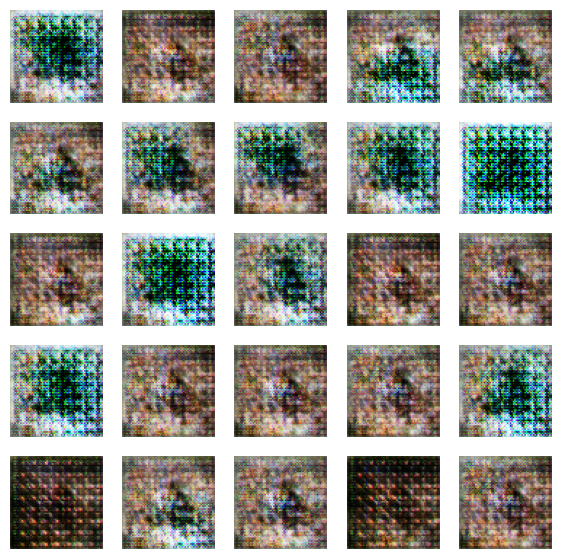

Saving checkpoint for epoch 1 at checkpoint/bert_encode/ckpt-2


Time for epoch 1 is 396.5383131504059 sec
Time for epoch 2 is 380.22192001342773 sec
Time for epoch 3 is 377.1443154811859 sec
Time for epoch 4 is 388.6068332195282 sec
Time for epoch 5 is 365.10024070739746 sec
Time for epoch 6 is 388.3373761177063 sec
Time for epoch 7 is 360.1437933444977 sec
Time for epoch 8 is 354.3574252128601 sec
Time for epoch 9 is 359.9223310947418 sec
Time for epoch 10 is 371.94200706481934 sec
D_loss [2.61298823]
G_loss [3.26384878]
D_loss [2.76818442]
G_loss [3.70608115]
D_loss [2.65067673]
G_loss [2.59307]
D_loss [2.6592865]
G_loss [2.76072741]
D_loss [2.95268083]
G_loss [3.52732277]
D_loss [2.64357495]
G_loss [2.68155479]
D_loss [2.56519175]
G_loss [2.58067513]
D_loss [2.62536883]
G_loss [2.71469402]
D_loss [2.78974319]
G_loss [3.43013906]
D_loss [2.57972121]
G_loss [2.95245695]
D_loss [2.67399]
G_loss [3.13304734]
D_loss [2.67333198]
G_loss [3.05508876]
D_loss [2.79531026]
G_loss [2.38572884]
D_loss [2.75694513]
G_loss [3.09084702]
D_loss [2.66292715]
G_l

G_loss [2.72916913]
D_loss [2.70678568]
G_loss [3.54048538]
D_loss [2.6740303]
G_loss [3.3328433]
D_loss [2.74540138]
G_loss [3.24704552]
D_loss [2.59510088]
G_loss [2.72393775]
D_loss [2.74602032]
G_loss [2.92267108]
D_loss [2.65088224]
G_loss [2.98699856]
D_loss [2.74627113]
G_loss [3.42483306]
D_loss [2.91185021]
G_loss [2.62666535]
D_loss [3.10410166]
G_loss [2.75177479]
D_loss [2.88630128]
G_loss [3.81090236]
D_loss [2.7737689]
G_loss [3.46265745]
D_loss [2.67890286]
G_loss [3.04630852]
D_loss [2.92881393]
G_loss [2.54289627]
D_loss [2.88361073]
G_loss [3.59320736]
D_loss [2.71269178]
G_loss [2.93917894]
D_loss [2.64552641]
G_loss [2.71772504]
D_loss [2.71522522]
G_loss [2.48102093]
D_loss [2.84949684]
G_loss [3.24948311]
D_loss [2.83495569]
G_loss [2.97698927]
D_loss [2.73140311]
G_loss [3.2168355]
D_loss [2.86379623]
G_loss [2.3262918]
D_loss [2.69688702]
G_loss [2.76198721]
D_loss [2.77331471]
G_loss [3.4417]
D_loss [2.65853405]
G_loss [2.76415062]
D_loss [2.68375945]
G_loss [3

G_loss [3.38556]
D_loss [2.62322855]
G_loss [3.07977057]
D_loss [2.73096561]
G_loss [2.99861956]
D_loss [2.80591917]
G_loss [2.98024321]
D_loss [2.67527723]
G_loss [3.17915654]
D_loss [2.81186581]
G_loss [2.99512482]
D_loss [2.76154232]
G_loss [2.8681345]
D_loss [2.65676832]
G_loss [2.97935581]
D_loss [2.63253021]
G_loss [3.52466249]
D_loss [2.90541983]
G_loss [2.80661726]
D_loss [3.10940409]
G_loss [2.58881378]
D_loss [2.77660537]
G_loss [3.56943202]
D_loss [2.84115624]
G_loss [3.18017888]
D_loss [2.85522127]
G_loss [2.69173479]
D_loss [2.90725255]
G_loss [2.99672651]
D_loss [2.96973228]
G_loss [3.61417484]
D_loss [2.75921869]
G_loss [3.11665678]
D_loss [2.8124814]
G_loss [2.82806063]
D_loss [2.71700478]
G_loss [3.34394717]
D_loss [2.81069565]
G_loss [2.77097034]
D_loss [2.82914948]
G_loss [2.27131438]
D_loss [2.83833838]
G_loss [2.84180832]
D_loss [2.65086126]
G_loss [3.27997589]
D_loss [2.71662]
G_loss [3.19129157]
D_loss [2.64541531]
G_loss [3.22251964]
D_loss [2.62746358]
G_loss [

D_loss [2.62415266]
G_loss [3.58043194]
D_loss [2.82336378]
G_loss [3.00016904]
D_loss [2.92598677]
G_loss [2.7372818]
D_loss [2.72221303]
G_loss [2.97861099]
D_loss [2.66782093]
G_loss [2.91070127]
D_loss [2.77820635]
G_loss [3.17731452]
D_loss [2.91534805]
G_loss [3.1082387]
D_loss [2.75025797]
G_loss [2.70833254]
D_loss [2.83242726]
G_loss [3.43799829]
D_loss [2.65345192]
G_loss [3.25321627]
D_loss [2.70695829]
G_loss [2.90295887]
D_loss [2.80442905]
G_loss [3.20143318]
D_loss [2.69049931]
G_loss [3.38062239]
D_loss [2.72995901]
G_loss [3.36976361]
D_loss [2.98521852]
G_loss [3.36944056]
D_loss [2.78423238]
G_loss [2.60050702]
D_loss [2.65258288]
G_loss [2.99971104]
D_loss [2.97470808]
G_loss [2.67341137]
D_loss [2.91056538]
G_loss [2.94506025]
D_loss [2.91743374]
G_loss [2.55831385]
D_loss [2.82272673]
G_loss [2.55288]
D_loss [2.79684019]
G_loss [3.04420805]
D_loss [2.66485929]
G_loss [2.86831355]
D_loss [2.67528224]
G_loss [3.60718727]
D_loss [2.74369812]
G_loss [3.68006182]
D_los

D_loss [2.5929203]
G_loss [2.95175266]
D_loss [2.60943222]
G_loss [3.2518425]
D_loss [2.65419]
G_loss [3.44261503]
D_loss [2.78017235]
G_loss [2.94092512]
D_loss [2.69124794]
G_loss [3.04374337]
D_loss [2.6522162]
G_loss [3.9991765]
D_loss [2.80984163]
G_loss [3.06405258]
D_loss [2.7577486]
G_loss [3.39916706]
D_loss [2.59659839]
G_loss [3.63480854]
D_loss [2.87233019]
G_loss [3.36324072]
D_loss [2.76579905]
G_loss [3.10437584]
D_loss [2.59963369]
G_loss [3.18705463]
D_loss [2.60874176]
G_loss [3.05478334]
D_loss [3.03844762]
G_loss [2.94463205]
D_loss [2.84138846]
G_loss [2.74586868]
D_loss [2.74855518]
G_loss [3.03619]
D_loss [2.78481913]
G_loss [2.82330418]
D_loss [2.67202616]
G_loss [2.68793964]
D_loss [2.59879875]
G_loss [3.0620172]
D_loss [2.57400417]
G_loss [3.48704147]
D_loss [2.70249701]
G_loss [2.78188133]
D_loss [2.64933681]
G_loss [2.77324438]
D_loss [2.63132286]
G_loss [3.84773946]
D_loss [2.66448927]
G_loss [2.82628965]
D_loss [2.77730322]
G_loss [3.29949522]
D_loss [2.73

D_loss [2.79187679]
G_loss [3.5477066]
D_loss [2.78652525]
G_loss [3.7032609]
D_loss [2.67080784]
G_loss [2.98851299]
D_loss [2.61595368]
G_loss [3.77745771]
D_loss [3.19148779]
G_loss [3.49205947]
D_loss [3.02932024]
G_loss [2.37063265]
D_loss [2.81323171]
G_loss [2.86008191]
D_loss [2.70548534]
G_loss [2.64800072]
D_loss [2.60928]
G_loss [2.71267796]
D_loss [2.60398436]
G_loss [3.25622892]
D_loss [2.66254711]
G_loss [3.47973251]
D_loss [2.71344662]
G_loss [2.99813795]
D_loss [2.6035049]
G_loss [3.29961467]
D_loss [2.6149621]
G_loss [3.29778481]
D_loss [2.72991276]
G_loss [2.93380666]
D_loss [2.72359943]
G_loss [2.69274592]
D_loss [2.81668568]
G_loss [3.57499075]
D_loss [2.79819775]
G_loss [3.29135919]
D_loss [2.71173763]
G_loss [2.71294165]
D_loss [2.87189364]
G_loss [2.9496913]
D_loss [2.61874723]
G_loss [3.04456949]
D_loss [2.64934897]
G_loss [3.50485754]
D_loss [3.01467609]
G_loss [3.03619695]
D_loss [3.07668161]
G_loss [3.23636723]
D_loss [2.68723917]
G_loss [3.39169407]
D_loss [

D_loss [2.74947953]
G_loss [2.67854381]
D_loss [2.73321056]
G_loss [2.40769219]
D_loss [2.64053631]
G_loss [2.93508673]
D_loss [2.82151103]
G_loss [3.06299567]
D_loss [2.85777426]
G_loss [2.61021662]
D_loss [2.87131262]
G_loss [3.51575756]
D_loss [2.66833663]
G_loss [3.44267797]
D_loss [2.8106966]
G_loss [2.44185758]
D_loss [2.63175726]
G_loss [3.65084934]
D_loss [2.87860632]
G_loss [2.70018744]
D_loss [2.89434624]
G_loss [3.28557348]
D_loss [2.91688728]
G_loss [3.39964104]
D_loss [2.68254042]
G_loss [3.64631057]
D_loss [2.70840645]
G_loss [2.98488092]
D_loss [2.87622619]
G_loss [2.83222]
D_loss [2.53715181]
G_loss [3.20098591]
D_loss [2.73310876]
G_loss [3.26803112]
D_loss [2.61510611]
G_loss [2.57833]
D_loss [2.86281681]
G_loss [2.79656839]
D_loss [2.90746522]
G_loss [3.72766209]
D_loss [2.6069684]
G_loss [2.61404467]
D_loss [2.70746541]
G_loss [2.60038781]
D_loss [2.77028561]
G_loss [3.10940504]
D_loss [2.65858889]
G_loss [3.54006362]
D_loss [2.88980961]
G_loss [2.9221797]
D_loss [2

G_loss [3.49861526]
D_loss [2.94566727]
G_loss [3.07889462]
D_loss [2.55056381]
G_loss [3.05983591]
D_loss [2.67556715]
G_loss [2.84135628]
D_loss [2.74525738]
G_loss [2.98729944]
D_loss [2.68865156]
G_loss [3.10553598]
D_loss [2.74611139]
G_loss [2.85124207]
D_loss [2.79557061]
G_loss [3.34479713]
D_loss [2.73903751]
G_loss [2.76959872]
D_loss [2.65434074]
G_loss [2.66849828]
D_loss [2.69770622]
G_loss [3.37704897]
D_loss [2.80482197]
G_loss [3.59242582]
D_loss [2.74911976]
G_loss [2.86880374]
D_loss [2.76670337]
G_loss [2.95828462]
D_loss [2.81493]
G_loss [2.68012953]
D_loss [2.70386171]
G_loss [3.60381126]
D_loss [2.80984974]
G_loss [2.86414385]
D_loss [2.65393209]
G_loss [2.98316622]
D_loss [2.77406359]
G_loss [3.29185343]
D_loss [2.87368155]
G_loss [2.52038217]
D_loss [2.93849325]
G_loss [3.69419336]
D_loss [2.69760537]
G_loss [2.49337459]
D_loss [2.76441479]
G_loss [2.94275427]
D_loss [2.83253241]
G_loss [3.20628953]
D_loss [2.64927602]
G_loss [2.91485357]
D_loss [2.62358952]
G_l

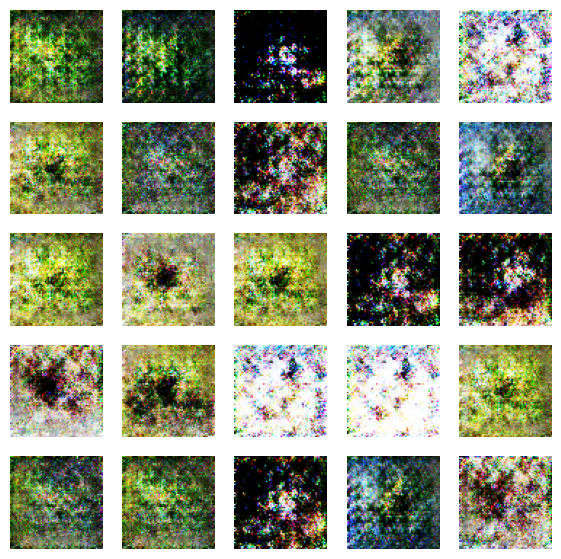

Saving checkpoint for epoch 11 at checkpoint/bert_encode/ckpt-3


Time for epoch 11 is 401.5451102256775 sec
Time for epoch 12 is 377.3167071342468 sec
Time for epoch 13 is 368.61318850517273 sec
Time for epoch 14 is 356.91204595565796 sec
Time for epoch 15 is 364.81893587112427 sec
Time for epoch 16 is 365.1241216659546 sec
Time for epoch 17 is 371.4959075450897 sec
Time for epoch 18 is 362.02854180336 sec
Time for epoch 19 is 378.7906320095062 sec
Time for epoch 20 is 390.50197291374207 sec
D_loss [2.69889402]
G_loss [3.11577129]
D_loss [2.69289398]
G_loss [2.81821656]
D_loss [2.82710171]
G_loss [3.35888052]
D_loss [2.69267225]
G_loss [3.3554287]
D_loss [2.61700821]
G_loss [2.867239]
D_loss [2.60715842]
G_loss [4.29421186]
D_loss [2.74357772]
G_loss [2.99380589]
D_loss [2.75024605]
G_loss [2.993222]
D_loss [2.66660142]
G_loss [3.68557167]
D_loss [2.69152927]
G_loss [3.33050799]
D_loss [2.81476736]
G_loss [3.58698487]
D_loss [2.84091]
G_loss [3.34773684]
D_loss [2.71860981]
G_loss [3.1734004]
D_loss [2.69067955]
G_loss [2.94845295]
D_loss [2.6939070

D_loss [2.757586]
G_loss [3.32218766]
D_loss [2.92266726]
G_loss [2.66497421]
D_loss [2.75098705]
G_loss [3.26388502]
D_loss [2.84175277]
G_loss [3.3373394]
D_loss [2.80153966]
G_loss [3.4842968]
D_loss [2.51584339]
G_loss [3.53080416]
D_loss [2.7855]
G_loss [3.0936408]
D_loss [2.55072975]
G_loss [3.07602549]
D_loss [2.78172541]
G_loss [3.23529434]
D_loss [2.56409836]
G_loss [3.26886868]
D_loss [2.83654499]
G_loss [3.4258976]
D_loss [2.76281071]
G_loss [2.95615292]
D_loss [2.741745]
G_loss [3.1688509]
D_loss [2.71024179]
G_loss [3.3292222]
D_loss [2.71536112]
G_loss [3.08460093]
D_loss [2.8164432]
G_loss [3.25053978]
D_loss [2.80843258]
G_loss [2.96069288]
D_loss [2.76048946]
G_loss [3.35182381]
D_loss [2.98611689]
G_loss [3.53100967]
D_loss [2.59570765]
G_loss [3.4752779]
D_loss [2.67958355]
G_loss [3.59552288]
D_loss [2.78604174]
G_loss [2.75388765]
D_loss [2.72202158]
G_loss [3.00824261]
D_loss [2.769804]
G_loss [3.01944399]
D_loss [2.71923184]
G_loss [2.90854263]
D_loss [2.81096077

G_loss [3.60994482]
D_loss [2.85330367]
G_loss [3.73291445]
D_loss [2.90822172]
G_loss [2.83500051]
D_loss [2.75018263]
G_loss [2.75481606]
D_loss [2.74951172]
G_loss [2.71624708]
D_loss [2.77792525]
G_loss [3.42239428]
D_loss [2.70388842]
G_loss [3.03361821]
D_loss [2.61697769]
G_loss [3.4759779]
D_loss [2.6368854]
G_loss [3.24779034]
D_loss [2.55843258]
G_loss [3.91416979]
D_loss [2.88045835]
G_loss [2.89774084]
D_loss [2.67473984]
G_loss [2.91628361]
D_loss [2.78843546]
G_loss [2.48493862]
D_loss [2.66551566]
G_loss [3.31986666]
D_loss [2.67764521]
G_loss [2.95260048]
D_loss [2.77117395]
G_loss [3.95904922]
D_loss [2.75395918]
G_loss [3.39601541]
D_loss [2.82104778]
G_loss [2.69820452]
D_loss [2.73319769]
G_loss [2.5211668]
D_loss [2.61169577]
G_loss [2.53273082]
D_loss [2.74402237]
G_loss [2.76204538]
D_loss [2.65488529]
G_loss [3.27782965]
D_loss [2.76432848]
G_loss [3.08653641]
D_loss [2.70776081]
G_loss [3.1235261]
D_loss [2.76455235]
G_loss [3.14664]
D_loss [2.65984678]
G_loss 

D_loss [2.7967546]
G_loss [3.58183622]
D_loss [2.64367]
G_loss [3.39554977]
D_loss [2.78551531]
G_loss [2.9008491]
D_loss [2.66314316]
G_loss [2.92925978]
D_loss [2.71195126]
G_loss [3.01191139]
D_loss [2.62388492]
G_loss [3.09000468]
D_loss [2.56498718]
G_loss [3.37181282]
D_loss [2.63649607]
G_loss [3.57238817]
D_loss [2.56778264]
G_loss [3.73605132]
D_loss [2.7165947]
G_loss [3.69322062]
D_loss [2.52564621]
G_loss [3.3132205]
D_loss [2.60681868]
G_loss [2.92923951]
D_loss [2.64748549]
G_loss [3.45488906]
D_loss [2.74694729]
G_loss [3.04788494]
D_loss [2.74838328]
G_loss [3.81701374]
D_loss [2.73828578]
G_loss [3.17700601]
D_loss [2.71751451]
G_loss [3.16111016]
D_loss [2.65768147]
G_loss [3.42856359]
D_loss [2.7728157]
G_loss [3.11682415]
D_loss [2.7358079]
G_loss [3.88526487]
D_loss [2.76932764]
G_loss [3.621346]
D_loss [2.50057268]
G_loss [3.60351753]
D_loss [2.57865906]
G_loss [3.30575919]
D_loss [2.76632023]
G_loss [3.22782946]
D_loss [2.6586647]
G_loss [3.56076908]
D_loss [2.59

G_loss [3.89858675]
D_loss [2.85663986]
G_loss [3.15412092]
D_loss [2.74761701]
G_loss [3.69675684]
D_loss [2.73628092]
G_loss [3.19776]
D_loss [2.62342763]
G_loss [3.19200945]
D_loss [2.55784798]
G_loss [3.72000027]
D_loss [2.5742023]
G_loss [3.29699254]
D_loss [2.6899538]
G_loss [3.26651335]
D_loss [2.8541894]
G_loss [2.73210526]
D_loss [2.64968252]
G_loss [3.57081127]
D_loss [2.67203331]
G_loss [3.9170289]
D_loss [2.82862353]
G_loss [3.48697948]
D_loss [2.72543097]
G_loss [3.10406828]
D_loss [2.72168112]
G_loss [3.27271104]
D_loss [2.73796844]
G_loss [2.78208876]
D_loss [2.67904854]
G_loss [3.34902048]
D_loss [2.63598275]
G_loss [3.22529149]
D_loss [2.69089317]
G_loss [3.98510671]
D_loss [2.69044256]
G_loss [3.81642818]
D_loss [2.63706]
G_loss [3.22477674]
D_loss [2.61484528]
G_loss [2.89898825]
D_loss [2.6873188]
G_loss [3.02101803]
D_loss [2.80188727]
G_loss [3.29833889]
D_loss [2.65471244]
G_loss [2.99557567]
D_loss [2.65968084]
G_loss [3.5166378]
D_loss [2.64919233]
G_loss [4.21

D_loss [2.67309666]
G_loss [3.31522655]
D_loss [2.73147917]
G_loss [3.48020339]
D_loss [2.62939167]
G_loss [3.88904262]
D_loss [2.65282941]
G_loss [2.76625681]
D_loss [2.73787045]
G_loss [2.77845359]
D_loss [2.71055031]
G_loss [2.89604092]
D_loss [2.72949982]
G_loss [2.89396763]
D_loss [2.60873604]
G_loss [3.55433607]
D_loss [2.54827881]
G_loss [2.92610931]
D_loss [2.58233261]
G_loss [3.24710321]
D_loss [2.7965858]
G_loss [3.30567837]
D_loss [2.55904531]
G_loss [3.51453447]
D_loss [2.69593477]
G_loss [3.22198963]
D_loss [2.68157244]
G_loss [2.98040581]
D_loss [2.73901987]
G_loss [3.69794369]
D_loss [2.74474859]
G_loss [3.7581563]
D_loss [2.70365381]
G_loss [3.05836535]
D_loss [2.69221377]
G_loss [3.79171944]
D_loss [2.42382693]
G_loss [3.79958987]
D_loss [2.78498411]
G_loss [2.90846324]
D_loss [2.71674037]
G_loss [2.67726946]
D_loss [2.65100241]
G_loss [3.11257124]
D_loss [2.72367835]
G_loss [3.32051444]
D_loss [2.56501055]
G_loss [2.68806052]
D_loss [2.62836885]
G_loss [3.49896121]
D_

D_loss [2.55711603]
G_loss [3.46223187]
D_loss [2.58622932]
G_loss [3.30501413]
D_loss [2.67461443]
G_loss [2.91416025]
D_loss [2.75178957]
G_loss [3.15333]
D_loss [2.58776951]
G_loss [3.26541567]
D_loss [2.60739303]
G_loss [3.19235969]
D_loss [2.59397078]
G_loss [3.21767569]
D_loss [2.66235089]
G_loss [3.29568052]
D_loss [2.65461063]
G_loss [3.26084805]
D_loss [2.87132788]
G_loss [2.76072478]
D_loss [2.68676376]
G_loss [2.99989605]
D_loss [2.55539417]
G_loss [3.33851337]
D_loss [2.59307671]
G_loss [3.27756262]
D_loss [2.79556036]
G_loss [3.51668882]
D_loss [2.84952021]
G_loss [2.81593227]
D_loss [2.72930861]
G_loss [3.3168664]
D_loss [2.49242473]
G_loss [3.96369886]
D_loss [2.60343695]
G_loss [3.30558586]
D_loss [2.7055831]
G_loss [3.72212386]
D_loss [2.61913562]
G_loss [3.12283587]
D_loss [2.71278787]
G_loss [3.23420525]
D_loss [2.75699186]
G_loss [3.81316161]
D_loss [2.67225361]
G_loss [3.26855946]
D_loss [2.51489472]
G_loss [3.21781063]
D_loss [2.85628104]
G_loss [3.80006313]
D_los

D_loss [2.63900089]
G_loss [3.0664978]
D_loss [2.69314051]
G_loss [3.35590792]
D_loss [2.75991535]
G_loss [3.29512048]
D_loss [2.93123913]
G_loss [2.57721448]
D_loss [2.68292141]
G_loss [2.82099462]
D_loss [3.07857752]
G_loss [3.27817297]
D_loss [2.72006226]
G_loss [2.51685977]
D_loss [2.82220936]
G_loss [3.06995344]
D_loss [2.65347385]
G_loss [2.83998775]
D_loss [2.591995]
G_loss [3.32650948]
D_loss [2.5575707]
G_loss [3.71496964]
D_loss [2.7720015]
G_loss [2.59494662]
D_loss [2.67140293]
G_loss [3.71334457]
D_loss [2.66155624]
G_loss [2.99136162]
D_loss [2.68545628]
G_loss [3.11829805]
D_loss [2.69196463]
G_loss [3.19771862]
D_loss [2.74083304]
G_loss [3.06850147]
D_loss [2.82815027]
G_loss [2.84395623]
D_loss [2.61930728]
G_loss [2.96484423]
D_loss [2.59541798]
G_loss [3.51914835]
D_loss [2.62101269]
G_loss [3.22957087]
D_loss [2.69074225]
G_loss [2.8293848]
D_loss [2.61683798]
G_loss [3.10731745]
D_loss [2.72283888]
G_loss [3.83144903]
D_loss [2.73036695]
G_loss [2.94489861]
D_loss

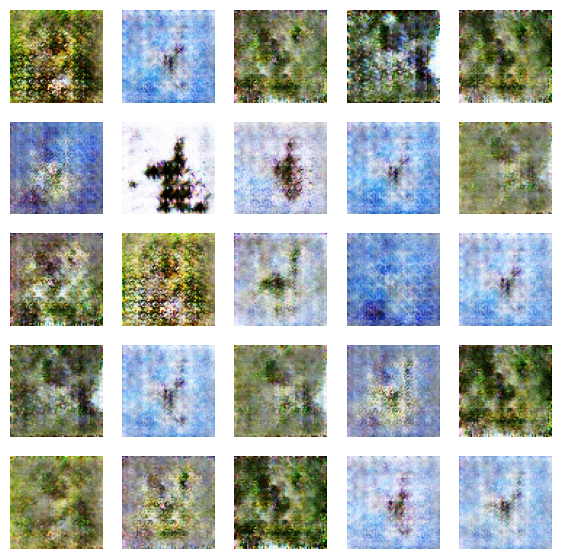

Saving checkpoint for epoch 21 at checkpoint/bert_encode/ckpt-4


Time for epoch 21 is 382.21769523620605 sec
Time for epoch 22 is 372.7444326877594 sec
Time for epoch 23 is 369.2660918235779 sec
Time for epoch 24 is 353.5550651550293 sec
Time for epoch 25 is 362.7486505508423 sec
Time for epoch 26 is 360.97811698913574 sec
Time for epoch 27 is 349.6949031352997 sec
Time for epoch 28 is 376.6960656642914 sec
Time for epoch 29 is 377.9216208457947 sec
Time for epoch 30 is 355.7091119289398 sec
D_loss [2.63193107]
G_loss [3.56498289]
D_loss [2.76102257]
G_loss [3.56281686]
D_loss [2.73093724]
G_loss [3.0525775]
D_loss [2.62637663]
G_loss [3.67365789]
D_loss [2.71629548]
G_loss [3.29225779]
D_loss [2.64447427]
G_loss [2.82386637]
D_loss [2.51310253]
G_loss [3.20044708]
D_loss [2.57107592]
G_loss [3.32036591]
D_loss [2.70434809]
G_loss [3.46064878]
D_loss [2.60863352]
G_loss [3.73104858]
D_loss [2.76273704]
G_loss [3.5404613]
D_loss [2.61273503]
G_loss [3.28588533]
D_loss [2.65010524]
G_loss [3.27509117]
D_loss [2.60287046]
G_loss [2.82748079]
D_loss [2.

D_loss [2.63205051]
G_loss [2.90771484]
D_loss [2.77732372]
G_loss [2.91973972]
D_loss [2.94955111]
G_loss [3.46682501]
D_loss [2.60296059]
G_loss [3.3873477]
D_loss [2.80140471]
G_loss [2.92716312]
D_loss [2.75677538]
G_loss [3.02817535]
D_loss [2.49698448]
G_loss [3.17361069]
D_loss [2.91799068]
G_loss [3.1359663]
D_loss [2.86445975]
G_loss [2.35400534]
D_loss [2.90384412]
G_loss [2.87992]
D_loss [2.76314831]
G_loss [2.96389174]
D_loss [2.47670794]
G_loss [3.44734335]
D_loss [2.64416623]
G_loss [3.43669033]
D_loss [2.7362411]
G_loss [3.38852406]
D_loss [2.78283882]
G_loss [2.99428797]
D_loss [2.68757629]
G_loss [3.07501173]
D_loss [2.74788332]
G_loss [2.96237063]
D_loss [2.74397326]
G_loss [3.16845131]
D_loss [2.75910306]
G_loss [3.3141818]
D_loss [2.7528553]
G_loss [3.87920761]
D_loss [2.75774717]
G_loss [3.26554537]
D_loss [2.71569014]
G_loss [3.36273336]
D_loss [2.64807916]
G_loss [4.60189199]
D_loss [2.60788965]
G_loss [3.4721806]
D_loss [2.60684085]
G_loss [3.89037085]
D_loss [2

D_loss [2.60935497]
G_loss [3.17568159]
D_loss [2.62026119]
G_loss [3.79016733]
D_loss [2.62970686]
G_loss [3.39723778]
D_loss [2.6485045]
G_loss [3.69208956]
D_loss [2.61577296]
G_loss [3.41637778]
D_loss [2.5385704]
G_loss [3.27963281]
D_loss [2.77036047]
G_loss [3.2151227]
D_loss [2.61343837]
G_loss [3.17767835]
D_loss [2.68582153]
G_loss [3.40285158]
D_loss [2.59458375]
G_loss [3.49903226]
D_loss [2.65648937]
G_loss [3.80569267]
D_loss [2.66093731]
G_loss [3.1764884]
D_loss [2.68513775]
G_loss [3.12615204]
D_loss [2.69118404]
G_loss [3.29731774]
D_loss [2.68691659]
G_loss [3.023633]
D_loss [2.70865679]
G_loss [3.3712976]
D_loss [2.63192749]
G_loss [3.23467159]
D_loss [2.60838103]
G_loss [3.24814987]
D_loss [2.76912236]
G_loss [2.87032127]
D_loss [2.49355125]
G_loss [4.13790607]
D_loss [2.57462072]
G_loss [2.87849236]
D_loss [2.52784681]
G_loss [3.2613678]
D_loss [2.69144583]
G_loss [4.25729179]
D_loss [2.53095698]
G_loss [4.01553535]
D_loss [2.74038696]
G_loss [3.87342]
D_loss [2.6

D_loss [2.7947526]
G_loss [2.7038765]
D_loss [2.61427593]
G_loss [3.16840577]
D_loss [2.72474909]
G_loss [3.58625174]
D_loss [2.70140076]
G_loss [2.77318358]
D_loss [2.7359457]
G_loss [3.08883524]
D_loss [2.760535]
G_loss [3.13844776]
D_loss [2.68808174]
G_loss [3.1085763]
D_loss [2.80982208]
G_loss [3.03235769]
D_loss [2.70040917]
G_loss [3.17852926]
D_loss [2.72106504]
G_loss [3.29050899]
D_loss [2.68395853]
G_loss [2.70325232]
D_loss [2.76103878]
G_loss [2.50536609]
D_loss [2.58289456]
G_loss [3.35416508]
D_loss [2.70625329]
G_loss [2.84904051]
D_loss [2.76557207]
G_loss [3.72014022]
D_loss [2.54066515]
G_loss [4.60866308]
D_loss [2.77239227]
G_loss [2.57118726]
D_loss [2.66880965]
G_loss [2.76984763]
D_loss [2.70389509]
G_loss [3.43974924]
D_loss [2.64486766]
G_loss [3.00711536]
D_loss [2.74037]
G_loss [3.65542412]
D_loss [2.57319307]
G_loss [3.5920043]
D_loss [2.74591875]
G_loss [2.9677887]
D_loss [2.75767565]
G_loss [3.42827129]
D_loss [2.9080987]
G_loss [3.40794301]
D_loss [2.81

D_loss [2.73007345]
G_loss [3.04347324]
D_loss [2.83411]
G_loss [2.97426558]
D_loss [2.74941778]
G_loss [3.23283577]
D_loss [2.73766327]
G_loss [4.69235134]
D_loss [2.75840187]
G_loss [3.30310059]
D_loss [2.4576]
G_loss [3.40947962]
D_loss [2.5875988]
G_loss [3.31304502]
D_loss [2.65220356]
G_loss [3.19259596]
D_loss [2.80830669]
G_loss [3.58454704]
D_loss [2.78002071]
G_loss [3.44882]
D_loss [2.64325547]
G_loss [2.89521837]
D_loss [2.70398521]
G_loss [3.46887207]
D_loss [2.61294603]
G_loss [3.43263221]
D_loss [2.58390188]
G_loss [3.90687394]
D_loss [2.85461402]
G_loss [2.95929861]
D_loss [2.72126913]
G_loss [3.6095643]
D_loss [2.65040827]
G_loss [3.67486048]
D_loss [2.57617426]
G_loss [4.16545582]
D_loss [2.50687027]
G_loss [3.40177298]
D_loss [2.68028831]
G_loss [3.14422464]
D_loss [2.71831131]
G_loss [2.81194806]
D_loss [2.73265409]
G_loss [3.19959974]
D_loss [2.75102282]
G_loss [3.51368666]
D_loss [2.72474813]
G_loss [3.14216948]
D_loss [2.60941958]
G_loss [3.48305106]
D_loss [2.76

D_loss [2.75205564]
G_loss [3.40057039]
D_loss [2.66788483]
G_loss [3.66078281]
D_loss [2.66775]
G_loss [3.75207925]
D_loss [2.6605947]
G_loss [2.86089468]
D_loss [2.70424557]
G_loss [3.54526258]
D_loss [2.78295612]
G_loss [3.39770794]
D_loss [2.56372976]
G_loss [3.43314409]
D_loss [2.93443584]
G_loss [3.14667749]
D_loss [2.72955942]
G_loss [2.94399905]
D_loss [2.59851384]
G_loss [3.06568718]
D_loss [2.72214508]
G_loss [3.43874073]
D_loss [2.64931417]
G_loss [3.11070561]
D_loss [2.79395628]
G_loss [3.4901185]
D_loss [2.59967017]
G_loss [3.10463095]
D_loss [2.65554094]
G_loss [3.07035327]
D_loss [2.57689381]
G_loss [3.49453568]
D_loss [2.7100637]
G_loss [3.37172294]
D_loss [2.50874]
G_loss [3.40814114]
D_loss [2.74839497]
G_loss [3.13286686]
D_loss [2.61591864]
G_loss [3.91335702]
D_loss [3.05961657]
G_loss [3.34706545]
D_loss [2.74440098]
G_loss [3.1840055]
D_loss [2.64797473]
G_loss [2.73912287]
D_loss [2.69803715]
G_loss [3.03662968]
D_loss [2.73641825]
G_loss [4.13201523]
D_loss [2.

G_loss [3.14349556]
D_loss [2.63047457]
G_loss [3.80702424]
D_loss [2.75379705]
G_loss [3.3102231]
D_loss [2.73528433]
G_loss [3.37213659]
D_loss [2.82275939]
G_loss [4.42296124]
D_loss [2.71980762]
G_loss [3.08018589]
D_loss [2.66639519]
G_loss [3.52832294]
D_loss [2.65361261]
G_loss [3.28499818]
D_loss [2.67196274]
G_loss [3.94018936]
D_loss [2.57622]
G_loss [3.6699276]
D_loss [2.62956715]
G_loss [3.28590727]
D_loss [2.79894042]
G_loss [2.94593811]
D_loss [2.78584552]
G_loss [3.00353217]
D_loss [2.68508959]
G_loss [3.84860969]
D_loss [2.53048038]
G_loss [3.70631742]
D_loss [2.75066328]
G_loss [3.31250286]
D_loss [2.64018106]
G_loss [3.51438236]
D_loss [2.65707445]
G_loss [3.66846728]
D_loss [2.71677399]
G_loss [3.00327969]
D_loss [2.75638461]
G_loss [3.33862495]
D_loss [2.83102512]
G_loss [3.190907]
D_loss [2.70482922]
G_loss [3.17433453]
D_loss [2.68854356]
G_loss [3.25367069]
D_loss [2.54924822]
G_loss [3.45770168]
D_loss [2.48562908]
G_loss [4.51652336]
D_loss [2.53334022]
G_loss 

G_loss [3.03785515]
D_loss [2.56085086]
G_loss [3.42063403]
D_loss [2.60574]
G_loss [3.6909492]
D_loss [2.5828805]
G_loss [3.66715]
D_loss [2.64177]
G_loss [3.18226957]
D_loss [2.68965483]
G_loss [3.59546447]
D_loss [2.69965744]
G_loss [3.60816193]
D_loss [2.72972918]
G_loss [3.52972078]
D_loss [2.64220619]
G_loss [3.78427362]
D_loss [2.78644967]
G_loss [3.22840691]
D_loss [2.71755385]
G_loss [2.4935708]
D_loss [2.76869202]
G_loss [3.27924228]
D_loss [2.52589273]
G_loss [3.33340621]
D_loss [2.60794163]
G_loss [3.66198921]
D_loss [2.74800348]
G_loss [3.23712635]
D_loss [2.65960598]
G_loss [3.19382048]
D_loss [2.60059977]
G_loss [4.42749691]
D_loss [2.63400316]
G_loss [3.46598434]
D_loss [2.53679037]
G_loss [3.39105]
D_loss [2.70587015]
G_loss [3.0908494]
D_loss [2.88820934]
G_loss [3.50831866]
D_loss [2.63570547]
G_loss [3.35668755]
D_loss [2.56247616]
G_loss [2.93813634]
D_loss [2.76961756]
G_loss [3.23147416]
D_loss [2.72840619]
G_loss [3.74205112]
D_loss [2.78110504]
G_loss [3.409100

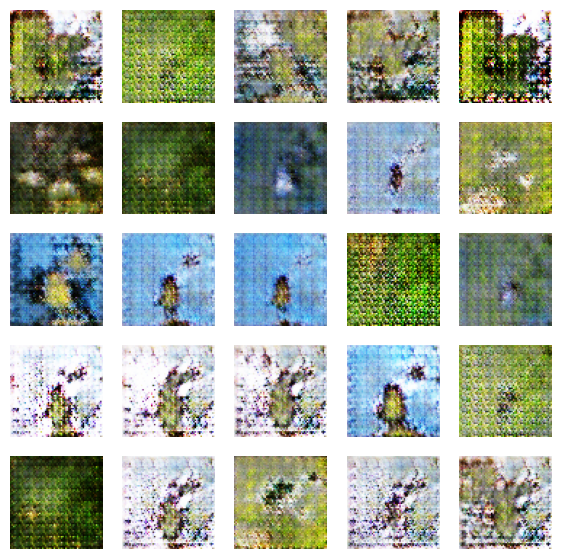

Saving checkpoint for epoch 31 at checkpoint/bert_encode/ckpt-5


Time for epoch 31 is 369.1348776817322 sec
Time for epoch 32 is 362.65589666366577 sec
Time for epoch 33 is 356.7651996612549 sec
Time for epoch 34 is 354.5656816959381 sec
Time for epoch 35 is 357.0265839099884 sec
Time for epoch 36 is 360.9181022644043 sec
Time for epoch 37 is 366.5502555370331 sec
Time for epoch 38 is 364.0975749492645 sec
Time for epoch 39 is 357.94390177726746 sec
Time for epoch 40 is 359.4344873428345 sec
D_loss [2.67758393]
G_loss [4.30328798]
D_loss [2.54035664]
G_loss [4.11895895]
D_loss [2.45219231]
G_loss [3.65815282]
D_loss [2.63422441]
G_loss [3.33068347]
D_loss [2.69162846]
G_loss [3.77495718]
D_loss [2.65223312]
G_loss [3.42693162]
D_loss [2.81143522]
G_loss [3.75788498]
D_loss [2.5275445]
G_loss [3.5589819]
D_loss [2.69460535]
G_loss [4.5188303]
D_loss [2.66583061]
G_loss [3.67525816]
D_loss [2.68691683]
G_loss [3.11189818]
D_loss [2.72128201]
G_loss [3.57432699]
D_loss [2.75635552]
G_loss [4.10816574]
D_loss [2.67072248]
G_loss [3.43347931]
D_loss [2.6

D_loss [2.47251654]
G_loss [3.48140597]
D_loss [2.91810322]
G_loss [3.26418161]
D_loss [2.52830148]
G_loss [3.92686439]
D_loss [2.83657384]
G_loss [3.20871711]
D_loss [2.5249815]
G_loss [3.202075]
D_loss [2.48753166]
G_loss [4.54747]
D_loss [2.49358082]
G_loss [4.16418076]
D_loss [2.68584967]
G_loss [3.31418]
D_loss [2.60791779]
G_loss [3.26084685]
D_loss [2.67182398]
G_loss [3.2149384]
D_loss [2.68562746]
G_loss [3.33387685]
D_loss [2.77664232]
G_loss [3.63769269]
D_loss [2.63966036]
G_loss [3.62306833]
D_loss [2.75294638]
G_loss [3.1706152]
D_loss [2.68656301]
G_loss [3.34625101]
D_loss [2.45749474]
G_loss [3.37365913]
D_loss [2.74383783]
G_loss [4.13326359]
D_loss [2.56100345]
G_loss [3.53092074]
D_loss [2.42554832]
G_loss [3.45956564]
D_loss [3.02018762]
G_loss [2.97450542]
D_loss [2.55272436]
G_loss [3.55174446]
D_loss [2.59580183]
G_loss [3.97174311]
D_loss [2.8316474]
G_loss [3.88111]
D_loss [2.8797431]
G_loss [3.4528]
D_loss [2.72320771]
G_loss [3.51032495]
D_loss [2.73321772]


D_loss [2.81040859]
G_loss [3.90420771]
D_loss [2.61756229]
G_loss [3.11061192]
D_loss [2.54640341]
G_loss [3.3735404]
D_loss [2.7104919]
G_loss [3.60811234]
D_loss [2.22495127]
G_loss [4.31378841]
D_loss [2.66397047]
G_loss [4.12486267]
D_loss [2.57111096]
G_loss [3.72397709]
D_loss [2.59143329]
G_loss [3.72497034]
D_loss [2.89908648]
G_loss [5.0891037]
D_loss [2.71323442]
G_loss [3.54263282]
D_loss [2.78493094]
G_loss [3.19002485]
D_loss [2.57730365]
G_loss [3.55872154]
D_loss [2.78312159]
G_loss [4.51615572]
D_loss [2.61874199]
G_loss [3.70041704]
D_loss [2.44749522]
G_loss [3.56903]
D_loss [2.79125762]
G_loss [3.4025836]
D_loss [2.6896553]
G_loss [3.634094]
D_loss [2.54622841]
G_loss [3.08160973]
D_loss [2.70294094]
G_loss [3.71730375]
D_loss [2.341681]
G_loss [3.81688476]
D_loss [2.41081047]
G_loss [3.83405304]
D_loss [2.58389115]
G_loss [4.34282923]
D_loss [2.53155899]
G_loss [4.07116]
D_loss [2.756428]
G_loss [3.19449472]
D_loss [2.54887605]
G_loss [3.28069067]
D_loss [2.6644451

D_loss [2.81229353]
G_loss [4.08240032]
D_loss [2.69528437]
G_loss [3.11094809]
D_loss [2.76121521]
G_loss [2.86637831]
D_loss [2.60297894]
G_loss [3.49232888]
D_loss [2.59870338]
G_loss [3.77641201]
D_loss [2.72937584]
G_loss [4.17817926]
D_loss [2.58072519]
G_loss [3.95165372]
D_loss [2.64138389]
G_loss [3.31588221]
D_loss [2.74426913]
G_loss [3.23822784]
D_loss [2.45786047]
G_loss [4.67434835]
D_loss [2.58293486]
G_loss [3.34651804]
D_loss [2.64181614]
G_loss [3.32023764]
D_loss [2.78379726]
G_loss [3.99283266]
D_loss [2.75373626]
G_loss [3.49473572]
D_loss [2.72039509]
G_loss [3.00317669]
D_loss [2.66165209]
G_loss [3.01219463]
D_loss [2.64869976]
G_loss [3.28960919]
D_loss [2.7424984]
G_loss [3.522681]
D_loss [2.60856509]
G_loss [3.57592607]
D_loss [2.607198]
G_loss [3.94975638]
D_loss [2.57411456]
G_loss [4.85743093]
D_loss [2.4473443]
G_loss [4.08409166]
D_loss [2.73394084]
G_loss [3.72847176]
D_loss [2.68439388]
G_loss [3.81220961]
D_loss [2.61388]
G_loss [3.47574949]
D_loss [2

D_loss [2.64686108]
G_loss [3.48072267]
D_loss [2.95061255]
G_loss [3.31809]
D_loss [2.44218731]
G_loss [3.54922056]
D_loss [2.61778021]
G_loss [3.23798752]
D_loss [2.71682453]
G_loss [3.65980148]
D_loss [2.44087]
G_loss [3.75611782]
D_loss [2.57562947]
G_loss [4.5433836]
D_loss [2.63914013]
G_loss [3.33735013]
D_loss [2.72634077]
G_loss [3.85843229]
D_loss [2.74419475]
G_loss [4.03334332]
D_loss [2.82543612]
G_loss [3.58997774]
D_loss [2.56881261]
G_loss [3.20529103]
D_loss [2.63536119]
G_loss [2.96120214]
D_loss [2.5765202]
G_loss [3.42656803]
D_loss [2.40735197]
G_loss [3.39256287]
D_loss [2.76519394]
G_loss [4.05533886]
D_loss [2.62809706]
G_loss [4.11495733]
D_loss [2.56786633]
G_loss [4.18783951]
D_loss [2.76802778]
G_loss [3.54930258]
D_loss [2.67604423]
G_loss [3.63578367]
D_loss [2.59724188]
G_loss [4.09323311]
D_loss [2.66449142]
G_loss [4.64397335]
D_loss [2.60874677]
G_loss [3.57296753]
D_loss [2.59924293]
G_loss [3.25092483]
D_loss [2.68674636]
G_loss [4.24416161]
D_loss [

D_loss [2.63840771]
G_loss [4.4034524]
D_loss [2.64674687]
G_loss [4.11818314]
D_loss [2.71763515]
G_loss [4.02232456]
D_loss [2.44261742]
G_loss [3.90482]
D_loss [2.85983038]
G_loss [4.17049837]
D_loss [2.63164473]
G_loss [3.94464302]
D_loss [2.86024451]
G_loss [3.38330698]
D_loss [2.62673]
G_loss [3.54596186]
D_loss [2.70160794]
G_loss [3.41041112]
D_loss [2.74388671]
G_loss [4.06147289]
D_loss [2.57728696]
G_loss [3.59094858]
D_loss [2.53492832]
G_loss [4.83214378]
D_loss [2.54732275]
G_loss [3.63564062]
D_loss [2.66756964]
G_loss [3.67972565]
D_loss [2.86113954]
G_loss [4.0348382]
D_loss [2.58078623]
G_loss [3.87343526]
D_loss [2.57587719]
G_loss [3.45315504]
D_loss [2.62811661]
G_loss [3.34276104]
D_loss [2.75261116]
G_loss [3.33464336]
D_loss [2.51876497]
G_loss [3.55055547]
D_loss [2.5673852]
G_loss [3.49452448]
D_loss [2.58951831]
G_loss [3.84615183]
D_loss [2.64910269]
G_loss [3.34809184]
D_loss [2.69921398]
G_loss [3.01527452]
D_loss [2.68893552]
G_loss [3.34193277]
D_loss [2

D_loss [2.7097683]
G_loss [3.26121712]
D_loss [2.6130228]
G_loss [3.45146751]
D_loss [2.597157]
G_loss [3.71192622]
D_loss [2.54301453]
G_loss [4.71916914]
D_loss [2.59260511]
G_loss [3.97831726]
D_loss [2.54672503]
G_loss [3.61641717]
D_loss [2.65249538]
G_loss [3.36317921]
D_loss [2.51604986]
G_loss [3.56887293]
D_loss [2.53993106]
G_loss [3.8364749]
D_loss [2.5366497]
G_loss [3.80730605]
D_loss [2.71176839]
G_loss [3.82644129]
D_loss [2.49822664]
G_loss [3.58624029]
D_loss [2.53611708]
G_loss [3.85975647]
D_loss [2.63155079]
G_loss [3.81194448]
D_loss [2.47117376]
G_loss [5.49664593]
D_loss [3.06029749]
G_loss [4.31248903]
D_loss [2.62819672]
G_loss [3.05431199]
D_loss [2.69147253]
G_loss [3.42180681]
D_loss [2.57387495]
G_loss [3.57056808]
D_loss [2.74527884]
G_loss [3.46835804]
D_loss [2.58075213]
G_loss [3.94489479]
D_loss [2.51939]
G_loss [3.68686581]
D_loss [2.87625647]
G_loss [3.72295618]
D_loss [2.49728489]
G_loss [3.45962858]
D_loss [2.70758104]
G_loss [3.93647647]
D_loss [2

G_loss [4.22126675]
D_loss [2.57002974]
G_loss [3.5836761]
D_loss [2.93022084]
G_loss [3.48077369]
D_loss [2.57248163]
G_loss [3.17713165]
D_loss [2.74886274]
G_loss [3.16323185]
D_loss [2.499547]
G_loss [3.67307281]
D_loss [2.76042938]
G_loss [3.31106806]
D_loss [2.56855559]
G_loss [2.97053647]
D_loss [2.45089293]
G_loss [4.38921309]
D_loss [2.51849461]
G_loss [4.33037472]
D_loss [2.46374679]
G_loss [4.26097775]
D_loss [2.60076857]
G_loss [3.54093361]
D_loss [2.48158264]
G_loss [3.55446243]
D_loss [2.66720295]
G_loss [4.42229509]
D_loss [2.79653239]
G_loss [2.97780657]
D_loss [2.55856776]
G_loss [3.41633558]
D_loss [2.36294603]
G_loss [4.21784306]
D_loss [2.6878891]
G_loss [3.8146987]
D_loss [2.50444221]
G_loss [4.55770779]
D_loss [2.59371567]
G_loss [3.47755909]
D_loss [2.54214311]
G_loss [3.64440584]
D_loss [2.47397852]
G_loss [4.0985527]
D_loss [2.90553236]
G_loss [4.12161922]
D_loss [2.42785811]
G_loss [3.58469701]
D_loss [2.65226769]
G_loss [3.02192807]
D_loss [2.61624146]
G_loss

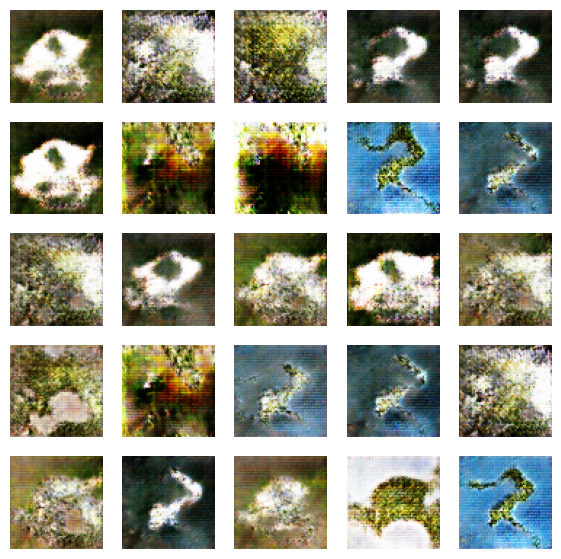

Saving checkpoint for epoch 41 at checkpoint/bert_encode/ckpt-6


Time for epoch 41 is 374.8230400085449 sec
Time for epoch 42 is 361.6178240776062 sec
Time for epoch 43 is 358.82815980911255 sec
Time for epoch 44 is 368.0050525665283 sec
Time for epoch 45 is 368.09207010269165 sec
Time for epoch 46 is 359.91956996917725 sec
Time for epoch 47 is 349.1506083011627 sec
Time for epoch 48 is 357.19761633872986 sec
Time for epoch 49 is 364.18130111694336 sec
Time for epoch 50 is 360.7344810962677 sec
D_loss [2.4769969]
G_loss [4.61980724]
D_loss [2.44643974]
G_loss [3.01187158]
D_loss [2.5453968]
G_loss [4.36127567]
D_loss [2.4260416]
G_loss [3.31263065]
D_loss [2.72084475]
G_loss [3.01058531]
D_loss [2.43569756]
G_loss [5.16900826]
D_loss [2.42381907]
G_loss [4.44387293]
D_loss [2.38070893]
G_loss [4.71770954]
D_loss [2.7569313]
G_loss [3.93512964]
D_loss [2.59571934]
G_loss [4.88894367]
D_loss [2.53148174]
G_loss [3.60973644]
D_loss [2.75815487]
G_loss [3.49853873]
D_loss [2.5269177]
G_loss [3.54389763]
D_loss [2.49134088]
G_loss [3.83573]
D_loss [3.114

D_loss [2.54355955]
G_loss [4.01016617]
D_loss [2.52188063]
G_loss [4.9938364]
D_loss [2.62090206]
G_loss [4.53859806]
D_loss [2.41883135]
G_loss [4.16704273]
D_loss [2.4382062]
G_loss [3.98268437]
D_loss [2.45341969]
G_loss [4.96928453]
D_loss [2.54854536]
G_loss [4.67883778]
D_loss [2.56709695]
G_loss [4.18618393]
D_loss [2.69384]
G_loss [4.61471558]
D_loss [2.61241531]
G_loss [3.9724288]
D_loss [2.5566628]
G_loss [4.24556446]
D_loss [2.690027]
G_loss [3.40202808]
D_loss [2.62990451]
G_loss [3.13760543]
D_loss [2.5215342]
G_loss [3.78221512]
D_loss [2.4686296]
G_loss [3.65211391]
D_loss [2.47147703]
G_loss [4.35784626]
D_loss [2.72710323]
G_loss [3.8648982]
D_loss [2.66171885]
G_loss [4.45157576]
D_loss [2.62701106]
G_loss [3.87589931]
D_loss [2.53875327]
G_loss [3.88153887]
D_loss [2.63064504]
G_loss [4.12485743]
D_loss [2.57359123]
G_loss [3.41371489]
D_loss [2.37628222]
G_loss [4.09111261]
D_loss [2.43135524]
G_loss [4.86813116]
D_loss [2.48166752]
G_loss [4.01102448]
D_loss [2.62

D_loss [2.96006894]
G_loss [2.92138529]
D_loss [2.45325232]
G_loss [4.2099843]
D_loss [2.51619601]
G_loss [3.24311495]
D_loss [2.41938257]
G_loss [4.36112404]
D_loss [2.69366789]
G_loss [4.09623337]
D_loss [2.68532324]
G_loss [3.4802866]
D_loss [2.38648105]
G_loss [4.02198792]
D_loss [2.83453894]
G_loss [4.28318405]
D_loss [2.74563122]
G_loss [3.23793554]
D_loss [2.63810396]
G_loss [3.09930444]
D_loss [2.74918556]
G_loss [3.93442345]
D_loss [2.44851828]
G_loss [4.05632639]
D_loss [2.56200504]
G_loss [3.71264362]
D_loss [2.5689311]
G_loss [3.19329166]
D_loss [2.59163117]
G_loss [3.26284838]
D_loss [2.46099424]
G_loss [4.1248107]
D_loss [2.44383287]
G_loss [4.8437376]
D_loss [2.45076]
G_loss [4.2794013]
D_loss [2.86299706]
G_loss [4.65435886]
D_loss [2.62530422]
G_loss [3.96274638]
D_loss [2.79408526]
G_loss [3.79560733]
D_loss [2.4762516]
G_loss [4.78153515]
D_loss [2.78672075]
G_loss [3.65773058]
D_loss [2.70601368]
G_loss [3.90928626]
D_loss [2.4671402]
G_loss [3.57813215]
D_loss [2.5

G_loss [4.22273064]
D_loss [2.58390713]
G_loss [3.47016907]
D_loss [2.49222]
G_loss [3.96159887]
D_loss [2.5401144]
G_loss [3.68025351]
D_loss [2.54678512]
G_loss [3.77840424]
D_loss [2.57828474]
G_loss [4.74479818]
D_loss [2.45928645]
G_loss [4.4571991]
D_loss [2.49617052]
G_loss [3.96777439]
D_loss [2.5561924]
G_loss [3.19754505]
D_loss [2.94751549]
G_loss [3.54346132]
D_loss [2.68246984]
G_loss [2.83734894]
D_loss [2.59405279]
G_loss [3.33631277]
D_loss [2.71613193]
G_loss [3.52002358]
D_loss [2.45832586]
G_loss [4.16012764]
D_loss [2.48337865]
G_loss [4.55698395]
D_loss [2.33696318]
G_loss [4.80128098]
D_loss [2.54373264]
G_loss [3.55123305]
D_loss [2.55989933]
G_loss [3.20626473]
D_loss [2.58172226]
G_loss [4.46126461]
D_loss [2.70930481]
G_loss [4.07005501]
D_loss [2.62247753]
G_loss [4.10340261]
D_loss [2.56706572]
G_loss [3.82549572]
D_loss [2.57320786]
G_loss [3.74850178]
D_loss [2.78784513]
G_loss [3.38084841]
D_loss [2.53150749]
G_loss [3.46149921]
D_loss [2.78107047]
G_loss

D_loss [2.5254283]
G_loss [4.58735657]
D_loss [2.65172768]
G_loss [4.51554632]
D_loss [2.5603931]
G_loss [3.50015068]
D_loss [2.6993165]
G_loss [3.39634252]
D_loss [2.66662073]
G_loss [3.74682331]
D_loss [2.61135769]
G_loss [3.64792132]
D_loss [2.64307547]
G_loss [4.55582619]
D_loss [2.53263903]
G_loss [3.54666305]
D_loss [2.56751037]
G_loss [3.77070856]
D_loss [2.72451067]
G_loss [4.04970264]
D_loss [2.55590296]
G_loss [3.74551773]
D_loss [2.60933065]
G_loss [4.75287819]
D_loss [2.54277682]
G_loss [4.28932476]
D_loss [2.48255873]
G_loss [3.71176171]
D_loss [2.63958168]
G_loss [3.6911]
D_loss [2.60691833]
G_loss [4.08927202]
D_loss [2.42247295]
G_loss [3.83489728]
D_loss [2.51729584]
G_loss [3.64989662]
D_loss [2.66279626]
G_loss [3.8064692]
D_loss [2.63554788]
G_loss [3.54383183]
D_loss [2.47829723]
G_loss [4.28344297]
D_loss [2.43810964]
G_loss [3.95857954]
D_loss [2.65437722]
G_loss [3.92083549]
D_loss [2.65976858]
G_loss [3.698421]
D_loss [2.43707609]
G_loss [4.14284515]
D_loss [2.

D_loss [2.73306656]
G_loss [3.90118933]
D_loss [2.45627093]
G_loss [4.14145565]
D_loss [2.39883137]
G_loss [4.0143919]
D_loss [2.40178847]
G_loss [3.93496609]
D_loss [2.47658229]
G_loss [3.9045577]
D_loss [2.58248091]
G_loss [4.05614281]
D_loss [2.35995483]
G_loss [4.20213604]
D_loss [2.45773339]
G_loss [3.91906357]
D_loss [2.64118218]
G_loss [3.74680448]
D_loss [2.73232484]
G_loss [4.31581259]
D_loss [2.86717796]
G_loss [3.39085031]
D_loss [2.46219087]
G_loss [3.38226843]
D_loss [2.56627488]
G_loss [3.61678743]
D_loss [2.63551235]
G_loss [3.55730581]
D_loss [2.8271203]
G_loss [3.62767792]
D_loss [2.52485442]
G_loss [3.4542284]
D_loss [2.73238969]
G_loss [3.4909265]
D_loss [2.45382595]
G_loss [3.73610592]
D_loss [2.52495813]
G_loss [3.62027264]
D_loss [2.55803871]
G_loss [4.82298]
D_loss [2.40071964]
G_loss [4.32189798]
D_loss [2.55533171]
G_loss [4.29425859]
D_loss [2.51746702]
G_loss [3.68872523]
D_loss [2.99490738]
G_loss [3.30007482]
D_loss [2.73868704]
G_loss [4.08969212]
D_loss [

D_loss [2.53457832]
G_loss [4.72420788]
D_loss [2.46551609]
G_loss [4.23443079]
D_loss [2.49634743]
G_loss [4.62717199]
D_loss [2.60874987]
G_loss [5.4133544]
D_loss [2.58115959]
G_loss [4.67509747]
D_loss [2.67873955]
G_loss [3.62584066]
D_loss [2.62810707]
G_loss [3.79682064]
D_loss [2.49713922]
G_loss [4.61028194]
D_loss [2.51563644]
G_loss [4.9732213]
D_loss [2.60036016]
G_loss [3.56960249]
D_loss [2.53906822]
G_loss [6.20210743]
D_loss [2.62479639]
G_loss [4.75118542]
D_loss [2.57172108]
G_loss [4.23328352]
D_loss [2.61580467]
G_loss [3.78750849]
D_loss [2.4651165]
G_loss [4.30777311]
D_loss [2.65849638]
G_loss [3.269]
D_loss [2.72922635]
G_loss [3.5477767]
D_loss [2.69548273]
G_loss [3.79593015]
D_loss [2.87104464]
G_loss [4.90196514]
D_loss [2.5961318]
G_loss [4.7557354]
D_loss [2.68036985]
G_loss [3.38651299]
D_loss [2.53855419]
G_loss [4.32750893]
D_loss [2.6110816]
G_loss [4.07371664]
D_loss [2.4763062]
G_loss [5.25940752]
D_loss [2.48873425]
G_loss [5.47302151]
D_loss [2.651

G_loss [3.99096251]
D_loss [2.62750316]
G_loss [4.11926079]
D_loss [2.64471507]
G_loss [3.41560912]
D_loss [2.6688447]
G_loss [4.36972475]
D_loss [2.59206676]
G_loss [4.35717583]
D_loss [2.67116213]
G_loss [4.03617859]
D_loss [2.54722738]
G_loss [4.53602505]
D_loss [2.48883104]
G_loss [4.16035557]
D_loss [2.53002167]
G_loss [4.153615]
D_loss [2.69218206]
G_loss [4.20952082]
D_loss [2.65356207]
G_loss [3.39243484]
D_loss [2.37623453]
G_loss [3.97346306]
D_loss [2.58699942]
G_loss [4.25449276]
D_loss [2.68614197]
G_loss [4.61851358]
D_loss [2.42653036]
G_loss [4.38463068]
D_loss [2.65786552]
G_loss [3.5095067]
D_loss [2.5466249]
G_loss [4.05945921]
D_loss [2.50067449]
G_loss [4.08679724]
D_loss [2.37754965]
G_loss [5.52555227]
D_loss [2.30139208]
G_loss [5.93519497]
D_loss [2.45609283]
G_loss [4.68825483]
D_loss [2.75587988]
G_loss [4.31029558]
D_loss [2.50856256]
G_loss [3.95862532]
D_loss [2.76149464]
G_loss [3.66602278]
D_loss [2.53517485]
G_loss [4.47441339]
D_loss [2.6516242]
G_loss

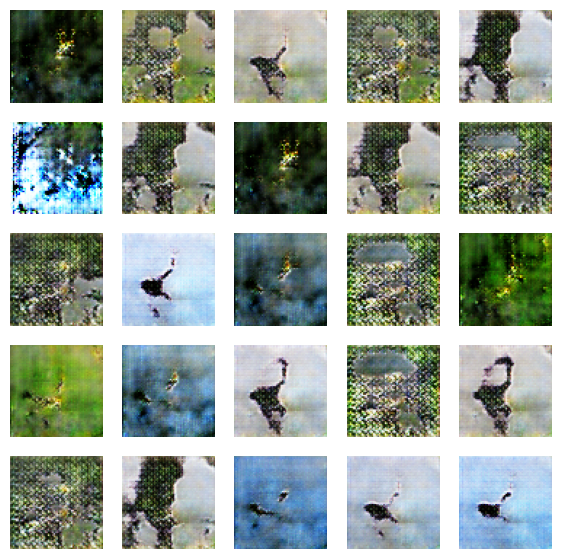

Saving checkpoint for epoch 51 at checkpoint/bert_encode/ckpt-7


Time for epoch 51 is 361.1854929924011 sec
Time for epoch 52 is 353.0530743598938 sec
Time for epoch 53 is 353.0854024887085 sec
Time for epoch 54 is 355.76375102996826 sec
Time for epoch 55 is 352.4982295036316 sec
Time for epoch 56 is 355.03323316574097 sec
Time for epoch 57 is 351.8058247566223 sec
Time for epoch 58 is 362.83974027633667 sec
Time for epoch 59 is 350.9004065990448 sec
Time for epoch 60 is 371.42254185676575 sec
D_loss [2.6252737]
G_loss [3.47358]
D_loss [2.26662517]
G_loss [4.5462079]
D_loss [2.40724087]
G_loss [4.26471567]
D_loss [2.59110069]
G_loss [3.75724173]
D_loss [2.41525865]
G_loss [4.77873802]
D_loss [2.56407428]
G_loss [4.78739929]
D_loss [2.58306384]
G_loss [3.42956781]
D_loss [2.5860734]
G_loss [3.68598509]
D_loss [2.46242023]
G_loss [3.51983595]
D_loss [2.70070076]
G_loss [2.85094738]
D_loss [2.51772451]
G_loss [4.30355883]
D_loss [2.69656324]
G_loss [3.45642233]
D_loss [2.52575278]
G_loss [3.5977006]
D_loss [2.65814805]
G_loss [4.79170704]
D_loss [2.555

D_loss [2.53244305]
G_loss [3.55269527]
D_loss [2.63060713]
G_loss [3.69885921]
D_loss [2.59337902]
G_loss [5.52648592]
D_loss [2.65023947]
G_loss [4.26552677]
D_loss [2.50217485]
G_loss [4.2633791]
D_loss [2.50575256]
G_loss [4.36335754]
D_loss [2.60127449]
G_loss [4.69229269]
D_loss [2.61149073]
G_loss [5.06018305]
D_loss [2.5474906]
G_loss [3.90375018]
D_loss [2.53148699]
G_loss [4.96346855]
D_loss [2.39797163]
G_loss [5.28006554]
D_loss [2.48667192]
G_loss [4.34917831]
D_loss [2.39519072]
G_loss [4.34904242]
D_loss [2.56388426]
G_loss [3.77749157]
D_loss [2.60960293]
G_loss [3.58984566]
D_loss [2.41561985]
G_loss [3.34460449]
D_loss [2.57058334]
G_loss [3.29044342]
D_loss [2.66269946]
G_loss [3.77490544]
D_loss [2.59551382]
G_loss [4.22747707]
D_loss [2.49043274]
G_loss [4.67974949]
D_loss [2.50991321]
G_loss [4.93520498]
D_loss [2.84877181]
G_loss [3.78636742]
D_loss [2.64367]
G_loss [4.15011215]
D_loss [2.68023157]
G_loss [3.64789319]
D_loss [2.38330317]
G_loss [4.00161171]
D_los

G_loss [3.78619194]
D_loss [2.67229652]
G_loss [3.70354295]
D_loss [2.76349497]
G_loss [3.64488888]
D_loss [2.10197926]
G_loss [4.32016134]
D_loss [2.62282419]
G_loss [5.14632845]
D_loss [2.51448107]
G_loss [4.03496313]
D_loss [2.50720096]
G_loss [4.21473265]
D_loss [2.63108635]
G_loss [4.88551331]
D_loss [2.57978654]
G_loss [5.08849955]
D_loss [2.63497734]
G_loss [4.8131423]
D_loss [2.49746108]
G_loss [4.45410252]
D_loss [2.54128265]
G_loss [3.29415751]
D_loss [2.55750942]
G_loss [3.04402018]
D_loss [2.47402143]
G_loss [3.81759644]
D_loss [2.6567924]
G_loss [3.61067319]
D_loss [2.66437769]
G_loss [3.7436769]
D_loss [2.47350359]
G_loss [3.41126275]
D_loss [2.47485733]
G_loss [3.44955111]
D_loss [2.5651722]
G_loss [5.10484028]
D_loss [2.32228565]
G_loss [4.39453888]
D_loss [2.95711422]
G_loss [4.08089352]
D_loss [2.62724829]
G_loss [3.41296625]
D_loss [2.70056105]
G_loss [3.53120565]
D_loss [2.51178551]
G_loss [4.05223131]
D_loss [2.4252739]
G_loss [5.70774174]
D_loss [2.54382014]
G_los

G_loss [3.89861202]
D_loss [2.44682312]
G_loss [4.03244781]
D_loss [2.20376444]
G_loss [5.02877903]
D_loss [2.78910208]
G_loss [5.0521822]
D_loss [2.68398046]
G_loss [4.43087864]
D_loss [2.69794846]
G_loss [4.01223135]
D_loss [2.75029731]
G_loss [4.73655605]
D_loss [2.81073141]
G_loss [3.31497335]
D_loss [2.53616667]
G_loss [3.87954259]
D_loss [2.61003232]
G_loss [4.27372694]
D_loss [2.48736572]
G_loss [4.10906696]
D_loss [2.66145802]
G_loss [4.25312805]
D_loss [2.39799619]
G_loss [4.27863312]
D_loss [2.38222122]
G_loss [4.58143902]
D_loss [2.47260714]
G_loss [4.16487074]
D_loss [2.50822353]
G_loss [3.93734074]
D_loss [2.44602823]
G_loss [4.96793]
D_loss [2.41097784]
G_loss [6.19767761]
D_loss [2.53626156]
G_loss [4.35836315]
D_loss [2.9172411]
G_loss [4.25066423]
D_loss [2.65715456]
G_loss [3.95426559]
D_loss [2.69556]
G_loss [3.91050816]
D_loss [2.54850435]
G_loss [3.88464642]
D_loss [2.33132672]
G_loss [3.99760771]
D_loss [2.36297131]
G_loss [4.32277298]
D_loss [2.46290588]
G_loss [

G_loss [4.38572836]
D_loss [2.44247675]
G_loss [3.75825477]
D_loss [2.45221329]
G_loss [4.08058119]
D_loss [2.34646463]
G_loss [3.5120306]
D_loss [2.59295034]
G_loss [3.58022451]
D_loss [2.76763463]
G_loss [4.22207546]
D_loss [2.44309545]
G_loss [5.12255478]
D_loss [2.6963346]
G_loss [4.23977375]
D_loss [2.55044556]
G_loss [4.68957138]
D_loss [2.52713227]
G_loss [4.07362938]
D_loss [2.52969432]
G_loss [4.54609776]
D_loss [2.53405595]
G_loss [4.91068]
D_loss [2.41082239]
G_loss [4.64683294]
D_loss [2.55236435]
G_loss [4.97973108]
D_loss [2.51542687]
G_loss [3.58301854]
D_loss [2.57697749]
G_loss [4.0950675]
D_loss [2.51951551]
G_loss [4.67521715]
D_loss [2.52108526]
G_loss [4.70383644]
D_loss [2.70115614]
G_loss [4.63017416]
D_loss [2.60031295]
G_loss [4.29413891]
D_loss [2.45021391]
G_loss [5.27028465]
D_loss [2.92473841]
G_loss [4.2555809]
D_loss [2.45243502]
G_loss [3.56853199]
D_loss [2.55635691]
G_loss [3.73764277]
D_loss [2.59850025]
G_loss [3.91398764]
D_loss [2.55117512]
G_loss 

G_loss [4.74063778]
D_loss [2.71279573]
G_loss [3.29848242]
D_loss [2.55008698]
G_loss [4.87990952]
D_loss [2.37481189]
G_loss [3.91287565]
D_loss [2.63989735]
G_loss [4.73274899]
D_loss [2.6501615]
G_loss [4.6867857]
D_loss [2.63826847]
G_loss [4.02710342]
D_loss [2.69157553]
G_loss [4.14906216]
D_loss [2.32819128]
G_loss [4.47404528]
D_loss [2.50932717]
G_loss [4.33323383]
D_loss [2.54067039]
G_loss [5.19125319]
D_loss [2.55696845]
G_loss [5.78359509]
D_loss [2.57256627]
G_loss [4.29998541]
D_loss [2.89730024]
G_loss [3.25898886]
D_loss [2.54458284]
G_loss [3.72055244]
D_loss [2.48871398]
G_loss [4.08035469]
D_loss [2.57672215]
G_loss [4.6083889]
D_loss [2.92731309]
G_loss [4.18098783]
D_loss [2.59536266]
G_loss [3.52936244]
D_loss [2.53508043]
G_loss [3.48005819]
D_loss [2.67220449]
G_loss [4.43352032]
D_loss [2.8430903]
G_loss [3.60980034]
D_loss [2.52881289]
G_loss [4.41391468]
D_loss [2.3997426]
G_loss [4.81640339]
D_loss [2.55733585]
G_loss [3.92002392]
D_loss [2.68450046]
G_los

G_loss [4.66637707]
D_loss [2.57788754]
G_loss [4.90838432]
D_loss [2.83816934]
G_loss [6.46675396]
D_loss [2.49842048]
G_loss [4.02376509]
D_loss [2.4596405]
G_loss [3.85700512]
D_loss [2.63770819]
G_loss [4.02200127]
D_loss [2.61137986]
G_loss [3.89069867]
D_loss [2.5050745]
G_loss [5.37304974]
D_loss [2.424757]
G_loss [4.5316658]
D_loss [2.58598]
G_loss [4.93868351]
D_loss [2.44517875]
G_loss [4.33105]
D_loss [2.46387434]
G_loss [4.96073627]
D_loss [2.66263914]
G_loss [4.20973635]
D_loss [2.38725948]
G_loss [4.05604887]
D_loss [2.60289526]
G_loss [4.01271772]
D_loss [2.80931854]
G_loss [4.21924782]
D_loss [2.61511278]
G_loss [4.64759541]
D_loss [2.66674209]
G_loss [3.59049511]
D_loss [2.58696365]
G_loss [4.2117424]
D_loss [2.62436342]
G_loss [4.13791227]
D_loss [2.35962343]
G_loss [4.40042686]
D_loss [2.41208148]
G_loss [4.61914253]
D_loss [2.46121931]
G_loss [4.02604055]
D_loss [2.47396088]
G_loss [4.71117592]
D_loss [2.55796051]
G_loss [3.98814964]
D_loss [2.67338133]
G_loss [4.11

G_loss [4.54555559]
D_loss [2.65028095]
G_loss [4.23731661]
D_loss [2.73293686]
G_loss [4.46770668]
D_loss [2.74886179]
G_loss [3.8022604]
D_loss [2.66936874]
G_loss [2.99714184]
D_loss [2.72915888]
G_loss [4.0593586]
D_loss [2.50500154]
G_loss [3.6521945]
D_loss [2.56514931]
G_loss [3.85743189]
D_loss [2.46405077]
G_loss [4.68312597]
D_loss [2.59288287]
G_loss [6.6059556]
D_loss [2.44811773]
G_loss [3.53848743]
D_loss [2.59820461]
G_loss [3.7406497]
D_loss [2.52115178]
G_loss [3.84681654]
D_loss [2.52748299]
G_loss [3.93512225]
D_loss [2.43780112]
G_loss [4.21494389]
D_loss [2.37837267]
G_loss [4.71521282]
D_loss [2.69963264]
G_loss [4.29979467]
D_loss [2.70690131]
G_loss [4.31665039]
D_loss [2.47744799]
G_loss [4.31588602]
D_loss [2.81771231]
G_loss [3.96326542]
D_loss [2.51072645]
G_loss [4.05658]
D_loss [2.46903324]
G_loss [5.36540079]
D_loss [2.7148335]
G_loss [4.64174032]
(25, 64, 64, 3)


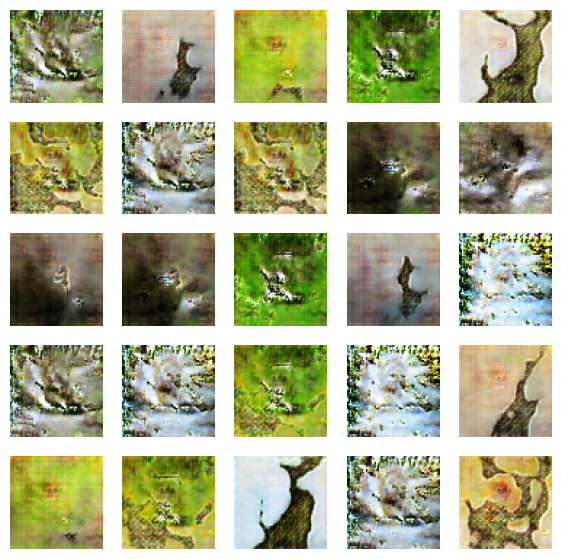

Saving checkpoint for epoch 61 at checkpoint/bert_encode/ckpt-8


Time for epoch 61 is 356.5883424282074 sec
Time for epoch 62 is 352.78136110305786 sec
Time for epoch 63 is 352.2791919708252 sec
Time for epoch 64 is 356.291136264801 sec
Time for epoch 65 is 374.0672752857208 sec
Time for epoch 66 is 385.13986372947693 sec
Time for epoch 67 is 390.71533823013306 sec
Time for epoch 68 is 364.21932196617126 sec
Time for epoch 69 is 348.6752073764801 sec
Time for epoch 70 is 372.293172121048 sec
D_loss [2.60530424]
G_loss [4.10561752]
D_loss [2.66735697]
G_loss [4.01591873]
D_loss [2.69324327]
G_loss [4.00806332]
D_loss [2.53693199]
G_loss [3.82768679]
D_loss [2.56229043]
G_loss [3.35931301]
D_loss [2.53874254]
G_loss [4.77845383]
D_loss [2.5958333]
G_loss [4.46316624]
D_loss [2.67106676]
G_loss [5.21767521]
D_loss [2.53428221]
G_loss [4.63676119]
D_loss [2.44293]
G_loss [4.5661478]
D_loss [2.4179039]
G_loss [4.11891842]
D_loss [2.39518833]
G_loss [4.67881584]
D_loss [2.32309771]
G_loss [4.25277042]
D_loss [2.55988693]
G_loss [4.33796024]
D_loss [2.2234

D_loss [2.37515593]
G_loss [4.6407547]
D_loss [2.51471615]
G_loss [3.91277051]
D_loss [2.51490808]
G_loss [4.61332273]
D_loss [2.5107429]
G_loss [4.07611]
D_loss [2.68956]
G_loss [4.10338688]
D_loss [3.289711]
G_loss [5.07658911]
D_loss [2.45651245]
G_loss [3.79556966]
D_loss [2.87866616]
G_loss [3.10265231]
D_loss [2.55833197]
G_loss [3.7073977]
D_loss [2.58096218]
G_loss [4.42859554]
D_loss [2.58424616]
G_loss [4.31591272]
D_loss [2.37212682]
G_loss [5.38175488]
D_loss [2.49514198]
G_loss [5.37380123]
D_loss [2.42616463]
G_loss [4.07269716]
D_loss [2.48018646]
G_loss [4.6299448]
D_loss [2.42736149]
G_loss [5.19182444]
D_loss [2.39892721]
G_loss [4.58939123]
D_loss [2.70519471]
G_loss [4.79620743]
D_loss [2.52771044]
G_loss [4.75002432]
D_loss [2.65473986]
G_loss [4.23526907]
D_loss [2.51837111]
G_loss [4.37521887]
D_loss [2.39211345]
G_loss [5.28965473]
D_loss [2.2508688]
G_loss [4.66723061]
D_loss [2.53889799]
G_loss [4.7162137]
D_loss [3.22003269]
G_loss [4.66961765]
D_loss [2.4675

D_loss [2.28191304]
G_loss [3.90358591]
D_loss [2.4367938]
G_loss [3.67942333]
D_loss [2.58000946]
G_loss [3.62661362]
D_loss [2.47305632]
G_loss [4.43632507]
D_loss [2.44471478]
G_loss [4.56071472]
D_loss [2.4172318]
G_loss [4.61056709]
D_loss [2.4846251]
G_loss [4.67852879]
D_loss [2.51446724]
G_loss [3.7749691]
D_loss [2.40669823]
G_loss [4.03218842]
D_loss [2.49748945]
G_loss [4.25126362]
D_loss [2.40034533]
G_loss [4.49825287]
D_loss [2.63178682]
G_loss [4.49081]
D_loss [2.69011164]
G_loss [4.18557644]
D_loss [2.60618544]
G_loss [5.34955883]
D_loss [2.67420912]
G_loss [5.0395546]
D_loss [2.55328035]
G_loss [3.42135692]
D_loss [2.9122963]
G_loss [5.13334274]
D_loss [2.61295056]
G_loss [3.8052814]
D_loss [2.53213906]
G_loss [3.237988]
D_loss [2.65653014]
G_loss [3.17376757]
D_loss [2.49823403]
G_loss [3.48945212]
D_loss [2.96977758]
G_loss [4.43355179]
D_loss [2.53848171]
G_loss [4.16203785]
D_loss [2.4245131]
G_loss [3.36799932]
D_loss [2.33912063]
G_loss [3.64071274]
D_loss [2.394

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



G_loss [4.39260626]
D_loss [2.66723394]
G_loss [3.15705156]
D_loss [2.60876894]
G_loss [4.10469151]
D_loss [2.29089117]
G_loss [3.96452808]
D_loss [2.39234447]
G_loss [5.39093351]
D_loss [2.42457819]
G_loss [5.45078707]
D_loss [2.40247583]
G_loss [4.62181473]
D_loss [2.42716742]
G_loss [5.36174488]
D_loss [2.38141227]
G_loss [3.97345161]
D_loss [2.30701852]
G_loss [5.32451534]
D_loss [2.39389873]
G_loss [4.85989285]
D_loss [2.36387348]
G_loss [4.91973]
D_loss [2.47452497]
G_loss [4.65671492]
D_loss [2.52230501]
G_loss [5.29294109]
D_loss [2.31654358]
G_loss [3.66228104]
D_loss [2.3384552]
G_loss [4.17749691]
D_loss [2.41730571]
G_loss [3.92804098]
D_loss [2.67720842]
G_loss [5.72301054]
D_loss [2.56628561]
G_loss [7.10097599]
D_loss [2.54583263]
G_loss [5.52053928]
D_loss [2.39411378]
G_loss [4.00532103]
D_loss [2.42366219]
G_loss [5.10162306]
D_loss [2.34360075]
G_loss [3.77892637]
D_loss [2.38040638]
G_loss [4.40817833]
D_loss [2.44944048]
G_loss [4.1252408]
D_loss [2.3386116]
G_loss

D_loss [2.6809268]
G_loss [3.31257677]
D_loss [2.40001798]
G_loss [9.42364883]
D_loss [2.45679712]
G_loss [4.5555644]
D_loss [2.4375906]
G_loss [5.01495743]
D_loss [2.41723084]
G_loss [6.08075571]
D_loss [2.37345839]
G_loss [4.43525887]
D_loss [2.45395565]
G_loss [4.22553301]
D_loss [2.50232196]
G_loss [4.70499229]
D_loss [2.45735073]
G_loss [4.8693924]
D_loss [2.61219525]
G_loss [6.11682415]
D_loss [2.52402306]
G_loss [3.30028486]
D_loss [2.60890079]
G_loss [3.98214507]
D_loss [2.48806]
G_loss [4.29360628]
D_loss [2.25731087]
G_loss [4.90896606]
D_loss [2.32363176]
G_loss [6.15891838]
D_loss [2.85722494]
G_loss [4.84877253]
D_loss [2.31661463]
G_loss [4.31100559]
D_loss [2.19617891]
G_loss [4.91540051]
D_loss [2.55837965]
G_loss [4.00704956]
D_loss [2.43820858]
G_loss [4.77224874]
D_loss [2.6553936]
G_loss [5.05529785]
D_loss [2.48353338]
G_loss [5.50541496]
D_loss [2.51190329]
G_loss [3.98879457]
D_loss [2.54443574]
G_loss [4.41523266]
D_loss [2.32305813]
G_loss [4.4107132]
D_loss [2

D_loss [2.42126083]
G_loss [4.36461258]
D_loss [2.33964157]
G_loss [4.89000559]
D_loss [2.71128321]
G_loss [5.16843033]
D_loss [2.50970888]
G_loss [4.28717041]
D_loss [2.35516119]
G_loss [5.74544334]
D_loss [2.43276763]
G_loss [4.75839186]
D_loss [2.7721014]
G_loss [3.94265532]
D_loss [2.5278852]
G_loss [4.56237698]
D_loss [2.49021506]
G_loss [5.12467]
D_loss [2.69751549]
G_loss [4.32761288]
D_loss [2.69005013]
G_loss [4.50675344]
D_loss [2.49329925]
G_loss [3.98455954]
D_loss [2.50155807]
G_loss [4.68715715]
D_loss [2.34112406]
G_loss [5.67613506]
D_loss [2.27018976]
G_loss [5.74713802]
D_loss [2.63213897]
G_loss [4.73027515]
D_loss [2.35767031]
G_loss [4.23297119]
D_loss [2.86181784]
G_loss [5.51986504]
D_loss [2.48421264]
G_loss [3.78922653]
D_loss [2.67168736]
G_loss [3.32793069]
D_loss [2.48905063]
G_loss [4.08351517]
D_loss [2.28203559]
G_loss [4.15124464]
D_loss [2.55466557]
G_loss [4.76404285]
D_loss [2.47566795]
G_loss [5.67392731]
D_loss [2.41753864]
G_loss [4.7374053]
D_loss

D_loss [2.432477]
G_loss [4.82350302]
D_loss [2.50874448]
G_loss [4.79569101]
D_loss [2.65714216]
G_loss [3.59332705]
D_loss [2.40764093]
G_loss [5.07878065]
D_loss [2.37436438]
G_loss [4.27669191]
D_loss [2.60023928]
G_loss [3.77733374]
D_loss [2.41949916]
G_loss [4.13493252]
D_loss [2.38509321]
G_loss [5.67244244]
D_loss [2.28666854]
G_loss [4.80504751]
D_loss [2.32168436]
G_loss [5.65058231]
D_loss [2.47870636]
G_loss [5.35942841]
D_loss [2.53987694]
G_loss [4.23543882]
D_loss [2.43438]
G_loss [4.57341]
D_loss [3.02905703]
G_loss [4.97887135]
D_loss [2.54986143]
G_loss [3.30623245]
D_loss [2.49032879]
G_loss [3.73314881]
D_loss [2.42128229]
G_loss [4.27148533]
D_loss [2.53940177]
G_loss [4.52136564]
D_loss [2.61632323]
G_loss [6.27848864]
D_loss [2.540133]
G_loss [4.84187174]
D_loss [2.4367485]
G_loss [4.03091717]
D_loss [2.36064482]
G_loss [3.68641329]
D_loss [2.466784]
G_loss [3.71894336]
D_loss [2.19007039]
G_loss [5.47169399]
D_loss [2.47437477]
G_loss [4.87519932]
D_loss [2.310

G_loss [4.29692459]
D_loss [2.6842134]
G_loss [5.15106106]
D_loss [2.55733442]
G_loss [4.65712738]
D_loss [2.25553036]
G_loss [4.86428833]
D_loss [2.54813027]
G_loss [4.45898628]
D_loss [2.40297699]
G_loss [5.8286972]
D_loss [2.54624462]
G_loss [4.21586323]
D_loss [2.45485616]
G_loss [4.51476431]
D_loss [2.56400514]
G_loss [5.44497]
D_loss [2.35311842]
G_loss [4.64969063]
D_loss [2.4249239]
G_loss [4.97983265]
D_loss [2.31152868]
G_loss [5.20787239]
D_loss [2.34677911]
G_loss [5.00263691]
D_loss [2.47346592]
G_loss [4.65078402]
D_loss [2.44309711]
G_loss [5.69589329]
D_loss [2.39214849]
G_loss [6.16366577]
D_loss [2.33117437]
G_loss [5.15369034]
D_loss [2.55595779]
G_loss [4.74377155]
D_loss [2.3091836]
G_loss [5.49363613]
D_loss [2.28267145]
G_loss [5.28257132]
D_loss [2.26718664]
G_loss [5.71740437]
D_loss [2.21461916]
G_loss [7.03530693]
D_loss [2.47021723]
G_loss [4.65882969]
D_loss [2.32634616]
G_loss [6.86113739]
D_loss [2.4491272]
G_loss [5.61648655]
D_loss [2.68601513]
G_loss [

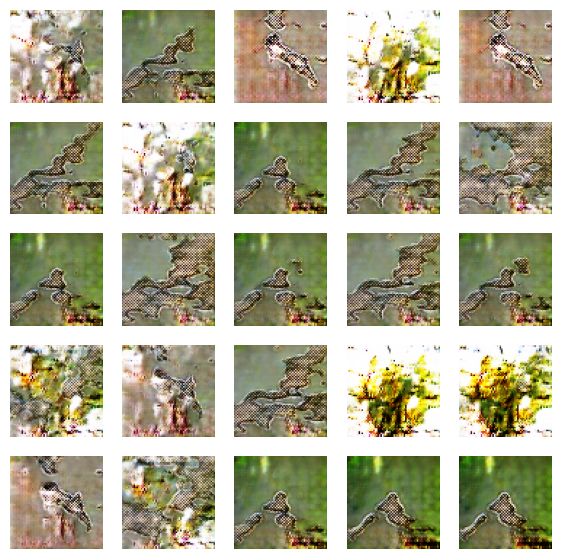

Saving checkpoint for epoch 91 at checkpoint/bert_encode/ckpt-11


Time for epoch 91 is 372.2630064487457 sec
Time for epoch 92 is 361.0931260585785 sec
Time for epoch 93 is 396.33075046539307 sec
Time for epoch 94 is 373.6171565055847 sec
Time for epoch 95 is 365.2223925590515 sec
Time for epoch 96 is 375.38173031806946 sec
Time for epoch 97 is 373.9594781398773 sec
Time for epoch 98 is 352.63547348976135 sec
Time for epoch 99 is 350.9205162525177 sec
Time for epoch 100 is 355.574177980423 sec
D_loss [2.55003691]
G_loss [4.44648647]
D_loss [2.3330729]
G_loss [4.94823313]
D_loss [2.25682712]
G_loss [4.9972868]
D_loss [2.28909755]
G_loss [6.38165188]
D_loss [2.52618098]
G_loss [6.38908815]
D_loss [2.41347218]
G_loss [4.85828304]
D_loss [2.28096676]
G_loss [4.5259347]
D_loss [2.45334387]
G_loss [3.91009521]
D_loss [2.37560177]
G_loss [4.08859968]
D_loss [2.44581652]
G_loss [5.43130922]
D_loss [2.46594882]
G_loss [4.35455275]
D_loss [2.53345537]
G_loss [4.05063]
D_loss [2.42535019]
G_loss [4.0065589]
D_loss [2.31517267]
G_loss [4.92459726]
D_loss [2.4434

D_loss [2.60140038]
G_loss [5.58925724]
D_loss [2.52489281]
G_loss [3.51845407]
D_loss [2.47182727]
G_loss [4.2174263]
D_loss [2.5017693]
G_loss [4.06529522]
D_loss [2.37424898]
G_loss [5.27355576]
D_loss [2.5658946]
G_loss [4.52672052]
D_loss [2.33837891]
G_loss [4.88736153]
D_loss [2.38487506]
G_loss [4.89236069]
D_loss [2.45073557]
G_loss [4.68714523]
D_loss [2.35986614]
G_loss [4.72385502]
D_loss [2.58246946]
G_loss [3.70216751]
D_loss [2.32912827]
G_loss [4.23982906]
D_loss [2.30072165]
G_loss [4.37176]
D_loss [2.43039489]
G_loss [4.35731]
D_loss [2.60248423]
G_loss [5.33088541]
D_loss [2.34844279]
G_loss [4.04890251]
D_loss [2.37607908]
G_loss [4.25427151]
D_loss [2.34562683]
G_loss [5.95032406]
D_loss [2.45008755]
G_loss [4.79091835]
D_loss [2.32621694]
G_loss [4.98051405]
D_loss [2.13438034]
G_loss [6.06897593]
D_loss [2.66687107]
G_loss [4.40670824]
D_loss [2.59743786]
G_loss [3.449646]
D_loss [2.62533665]
G_loss [3.42315698]
D_loss [2.33792067]
G_loss [3.88567829]
D_loss [2.5

G_loss [5.21320724]
D_loss [2.28343391]
G_loss [5.2591629]
D_loss [2.21623611]
G_loss [4.9923048]
D_loss [2.60122681]
G_loss [3.97224593]
D_loss [2.4082408]
G_loss [5.13892651]
D_loss [2.3143084]
G_loss [5.40350056]
D_loss [2.35685563]
G_loss [5.64517641]
D_loss [2.16407633]
G_loss [5.06838]
D_loss [2.35524893]
G_loss [4.71903801]
D_loss [2.32884097]
G_loss [5.00166512]
D_loss [2.40829372]
G_loss [5.21356392]
D_loss [2.4426434]
G_loss [4.72672749]
D_loss [2.7246542]
G_loss [4.51918554]
D_loss [2.29731417]
G_loss [3.91995597]
D_loss [2.63386917]
G_loss [4.48270416]
D_loss [2.33094406]
G_loss [5.68427277]
D_loss [2.351475]
G_loss [5.58237267]
D_loss [2.21108]
G_loss [5.93924809]
D_loss [2.38591361]
G_loss [7.62008858]
D_loss [2.337008]
G_loss [7.01036167]
D_loss [2.58241415]
G_loss [5.02300358]
D_loss [2.5707221]
G_loss [3.80015564]
D_loss [2.42879772]
G_loss [3.93977404]
D_loss [2.46001]
G_loss [5.04200268]
D_loss [2.39684343]
G_loss [4.36637115]
D_loss [2.58095264]
G_loss [4.78532553]


G_loss [5.65103531]
D_loss [2.4428618]
G_loss [14.8000298]
D_loss [2.5689137]
G_loss [6.04621935]
D_loss [2.40166569]
G_loss [4.98005676]
D_loss [2.46927118]
G_loss [4.85260773]
D_loss [2.24650359]
G_loss [5.05781269]
D_loss [2.26638603]
G_loss [5.58843422]
D_loss [2.49239]
G_loss [7.38509417]
D_loss [2.62587571]
G_loss [4.73776388]
D_loss [2.25128388]
G_loss [6.63864517]
D_loss [2.53855371]
G_loss [5.65962029]
D_loss [2.42305946]
G_loss [3.84927988]
D_loss [2.47416878]
G_loss [3.72414446]
D_loss [2.26073956]
G_loss [5.88743639]
D_loss [2.43366361]
G_loss [4.93753862]
D_loss [2.46271944]
G_loss [4.95771599]
D_loss [2.68592596]
G_loss [4.34044266]
D_loss [2.55834794]
G_loss [6.61244297]
D_loss [2.40803099]
G_loss [5.67730474]
D_loss [2.51120567]
G_loss [5.12556314]
D_loss [2.48197412]
G_loss [4.55789089]
D_loss [2.29104233]
G_loss [5.85374928]
D_loss [2.4365592]
G_loss [5.80987835]
D_loss [2.46272326]
G_loss [4.2456274]
D_loss [2.29003239]
G_loss [4.91558027]
D_loss [2.62305689]
G_loss 

G_loss [5.10362339]
D_loss [2.57505679]
G_loss [4.5704608]
D_loss [2.39111567]
G_loss [5.16154051]
D_loss [2.38057065]
G_loss [5.68663597]
D_loss [2.7448585]
G_loss [4.28284645]
D_loss [2.46427774]
G_loss [4.08280754]
D_loss [2.42142487]
G_loss [4.26994658]
D_loss [2.36751628]
G_loss [5.57423258]
D_loss [2.28388596]
G_loss [5.00705814]
D_loss [2.40660167]
G_loss [5.05824661]
D_loss [2.32750201]
G_loss [4.19063568]
D_loss [2.54503298]
G_loss [6.15263]
D_loss [2.42470908]
G_loss [4.75480175]
D_loss [2.41955376]
G_loss [5.22400475]
D_loss [2.38481188]
G_loss [4.16165829]
D_loss [2.72616339]
G_loss [4.28306437]
D_loss [2.2873323]
G_loss [4.31929874]
D_loss [2.38402176]
G_loss [4.67293406]
D_loss [2.34382153]
G_loss [4.74225092]
D_loss [2.46166515]
G_loss [5.06751919]
D_loss [2.35526943]
G_loss [6.54839516]
D_loss [2.54561281]
G_loss [5.08840084]
D_loss [2.20494175]
G_loss [5.5788064]
D_loss [2.44249177]
G_loss [5.80191898]
D_loss [2.5916152]
G_loss [4.85870838]
D_loss [2.54086351]
G_loss [

G_loss [4.88704062]
D_loss [2.34943032]
G_loss [5.30819893]
D_loss [2.81398582]
G_loss [5.76557636]
D_loss [2.60307741]
G_loss [4.29745]
D_loss [2.35598397]
G_loss [3.96222281]
D_loss [2.36955833]
G_loss [3.39015722]
D_loss [2.2986393]
G_loss [4.76634789]
D_loss [2.62529373]
G_loss [4.8881321]
D_loss [2.36900711]
G_loss [4.68566]
D_loss [2.55871129]
G_loss [4.49349]
D_loss [2.42073917]
G_loss [5.36603832]
D_loss [2.52277613]
G_loss [5.60673523]
D_loss [2.53301954]
G_loss [4.64055777]
D_loss [2.54609966]
G_loss [4.58483219]
D_loss [2.74010968]
G_loss [4.10596466]
D_loss [2.6658709]
G_loss [3.04218888]
D_loss [2.4011898]
G_loss [4.49913359]
D_loss [2.41411543]
G_loss [5.09119129]
D_loss [2.49085855]
G_loss [6.56591272]
D_loss [2.42668819]
G_loss [4.96693373]
D_loss [2.59503794]
G_loss [5.68837166]
D_loss [2.56141472]
G_loss [4.18880653]
D_loss [2.45448494]
G_loss [3.95746279]
D_loss [2.41454649]
G_loss [4.25702715]
D_loss [2.45809269]
G_loss [4.74538]
D_loss [2.17334986]
G_loss [4.851603

G_loss [3.53314877]
D_loss [2.39689398]
G_loss [5.10665274]
D_loss [2.36482239]
G_loss [4.8677969]
D_loss [2.49820876]
G_loss [4.60859156]
D_loss [2.23834229]
G_loss [5.15203524]
D_loss [2.53208113]
G_loss [4.58224154]
D_loss [2.27213883]
G_loss [4.81316137]
D_loss [2.55549574]
G_loss [4.29066277]
D_loss [2.19307518]
G_loss [3.96912432]
D_loss [2.27519941]
G_loss [5.29591]
D_loss [2.26708031]
G_loss [4.87613201]
D_loss [3.14920378]
G_loss [5.26528549]
D_loss [2.64550352]
G_loss [3.78663063]
D_loss [2.51200819]
G_loss [3.57652307]
D_loss [2.52659321]
G_loss [3.77879047]
D_loss [2.57807851]
G_loss [4.98289299]
D_loss [2.42094]
G_loss [5.66765881]
D_loss [2.44697285]
G_loss [5.25349903]
D_loss [2.48245621]
G_loss [5.50260305]
D_loss [2.36057472]
G_loss [7.98125935]
D_loss [2.42550182]
G_loss [4.31391525]
D_loss [2.52734804]
G_loss [4.0908041]
D_loss [2.63683057]
G_loss [4.30534649]
D_loss [2.38357973]
G_loss [4.52827549]
D_loss [2.79075408]
G_loss [4.73282719]
D_loss [2.61118197]
G_loss [

D_loss [2.61370707]
G_loss [3.77458334]
D_loss [2.20150185]
G_loss [4.52591133]
D_loss [2.52664804]
G_loss [8.44609356]
D_loss [2.36487722]
G_loss [4.16449451]
D_loss [2.53748703]
G_loss [4.60675]
D_loss [2.58097601]
G_loss [5.02699757]
D_loss [2.57717323]
G_loss [4.230196]
D_loss [2.59416437]
G_loss [4.16598129]
D_loss [2.95658541]
G_loss [3.55775523]
D_loss [2.86880684]
G_loss [3.98353982]
D_loss [2.61092]
G_loss [3.80572462]
D_loss [2.38970375]
G_loss [4.04907608]
D_loss [2.6449523]
G_loss [4.46397448]
D_loss [2.47351551]
G_loss [5.56634951]
D_loss [2.45643687]
G_loss [5.16368961]
D_loss [2.4851861]
G_loss [4.8675518]
D_loss [2.3659749]
G_loss [5.12887573]
D_loss [2.60016394]
G_loss [5.06866741]
D_loss [2.48273373]
G_loss [4.40953827]
D_loss [2.3466928]
G_loss [4.36472416]
D_loss [2.7051425]
G_loss [5.1177206]
D_loss [2.47427917]
G_loss [5.94570541]
D_loss [2.40854549]
G_loss [4.87264]
D_loss [2.4499464]
G_loss [4.13660526]
D_loss [2.44808865]
G_loss [5.15909767]
D_loss [2.63328028]

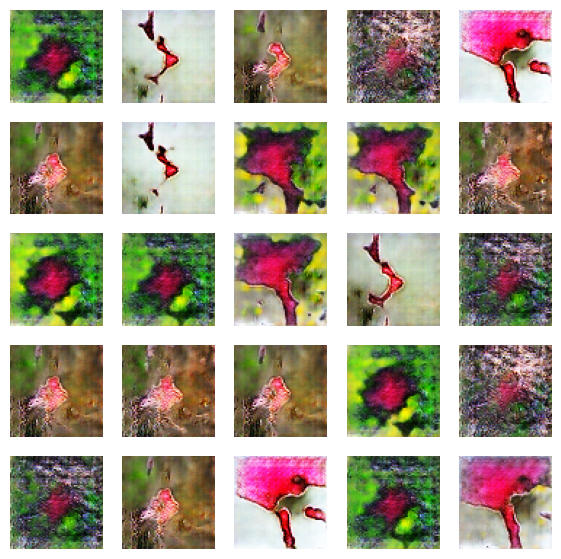

Saving checkpoint for epoch 101 at checkpoint/bert_encode/ckpt-12


Time for epoch 101 is 357.30429244041443 sec
Time for epoch 102 is 350.9326288700104 sec
Time for epoch 103 is 355.97749161720276 sec
Time for epoch 104 is 394.65818786621094 sec
Time for epoch 105 is 379.7240688800812 sec
Time for epoch 106 is 368.61413836479187 sec
Time for epoch 107 is 359.4594376087189 sec
Time for epoch 108 is 352.2389042377472 sec
Time for epoch 109 is 360.93803119659424 sec
Time for epoch 110 is 361.7840418815613 sec
D_loss [2.73410511]
G_loss [5.69589043]
D_loss [2.4309268]
G_loss [4.435009]
D_loss [2.34164667]
G_loss [4.98989201]
D_loss [2.25758123]
G_loss [4.79827881]
D_loss [2.43988681]
G_loss [6.05647]
D_loss [2.74299526]
G_loss [6.96657944]
D_loss [2.49102116]
G_loss [4.72210693]
D_loss [2.54828548]
G_loss [4.46321]
D_loss [2.40969586]
G_loss [4.8394165]
D_loss [2.45209312]
G_loss [4.93958569]
D_loss [2.3529706]
G_loss [5.71858597]
D_loss [2.27757883]
G_loss [5.88590622]
D_loss [2.45935678]
G_loss [5.81017399]
D_loss [2.45281696]
G_loss [4.09835672]
D_loss

D_loss [2.72504354]
G_loss [6.15802431]
D_loss [2.47323847]
G_loss [4.28363]
D_loss [2.5940733]
G_loss [5.25916624]
D_loss [2.56691933]
G_loss [4.77617598]
D_loss [2.50682068]
G_loss [4.06856203]
D_loss [2.40973234]
G_loss [5.31536388]
D_loss [2.47698164]
G_loss [5.53175068]
D_loss [2.30424356]
G_loss [5.20559406]
D_loss [2.50682497]
G_loss [5.09029102]
D_loss [2.35904789]
G_loss [4.97264]
D_loss [2.54859042]
G_loss [6.21060228]
D_loss [2.27863646]
G_loss [4.93669462]
D_loss [2.33079624]
G_loss [4.15143967]
D_loss [2.42982483]
G_loss [4.31850243]
D_loss [2.45950699]
G_loss [4.90493155]
D_loss [2.59605503]
G_loss [3.88996196]
D_loss [2.34868574]
G_loss [5.5786829]
D_loss [2.60635662]
G_loss [9.64827728]
D_loss [2.28139162]
G_loss [6.5452404]
D_loss [2.32765675]
G_loss [4.53146172]
D_loss [2.49867582]
G_loss [5.36899948]
D_loss [2.37567186]
G_loss [5.12458134]
D_loss [2.41852283]
G_loss [4.40202379]
D_loss [2.19767714]
G_loss [5.01326942]
D_loss [2.59526491]
G_loss [5.42340279]
D_loss [2

G_loss [4.62807035]
D_loss [2.24327111]
G_loss [4.53474474]
D_loss [2.54640388]
G_loss [6.08116913]
D_loss [2.19865632]
G_loss [5.06565905]
D_loss [2.32730889]
G_loss [6.13697052]
D_loss [2.53964114]
G_loss [5.6545]
D_loss [2.28537035]
G_loss [4.81755924]
D_loss [2.57162952]
G_loss [3.91383314]
D_loss [2.40548158]
G_loss [4.22277784]
D_loss [2.45658541]
G_loss [4.836833]
D_loss [2.88366556]
G_loss [4.77007818]
D_loss [2.6547749]
G_loss [3.61570024]
D_loss [2.65241575]
G_loss [3.46762]
D_loss [2.46947432]
G_loss [4.01754379]
D_loss [2.53862143]
G_loss [4.21278954]
D_loss [2.2409668]
G_loss [4.8900876]
D_loss [2.31130457]
G_loss [5.23435497]
D_loss [2.43317032]
G_loss [5.87996054]
D_loss [2.4495244]
G_loss [5.61309814]
D_loss [2.44360662]
G_loss [4.16966438]
D_loss [2.36725259]
G_loss [5.76768589]
D_loss [2.40358162]
G_loss [4.97732878]
D_loss [2.50768495]
G_loss [4.07366562]
D_loss [2.39494324]
G_loss [4.86912918]
D_loss [2.32597637]
G_loss [5.60299301]
D_loss [2.85034561]
G_loss [4.872

G_loss [3.96876526]
D_loss [2.40768218]
G_loss [4.53460073]
D_loss [2.47852]
G_loss [4.89521217]
D_loss [2.50040364]
G_loss [4.2483964]
D_loss [2.42212057]
G_loss [7.00010204]
D_loss [2.24744129]
G_loss [4.23240519]
D_loss [2.41556358]
G_loss [4.06050062]
D_loss [2.4324708]
G_loss [4.84895229]
D_loss [2.63047338]
G_loss [6.08351088]
D_loss [2.40705919]
G_loss [4.0336833]
D_loss [2.68775225]
G_loss [3.63024569]
D_loss [2.64547777]
G_loss [3.26073885]
D_loss [2.57985115]
G_loss [3.5790987]
D_loss [2.34291172]
G_loss [5.14550495]
D_loss [2.21851373]
G_loss [4.64547729]
D_loss [2.56553292]
G_loss [5.55434132]
D_loss [2.4865551]
G_loss [5.24178457]
D_loss [2.45743346]
G_loss [5.38843536]
D_loss [2.39529324]
G_loss [4.50677919]
D_loss [2.21213341]
G_loss [6.48179579]
D_loss [2.49252462]
G_loss [6.20868]
D_loss [2.26909184]
G_loss [5.32855606]
D_loss [2.54040456]
G_loss [4.96065283]
D_loss [2.36192751]
G_loss [4.17791271]
D_loss [2.47172928]
G_loss [4.86116123]
D_loss [2.38003445]
G_loss [5.0

G_loss [4.91504622]
D_loss [2.33867741]
G_loss [6.17279911]
D_loss [2.474545]
G_loss [5.11420631]
D_loss [2.4243536]
G_loss [6.37854481]
D_loss [2.32261133]
G_loss [5.66578293]
D_loss [2.57502699]
G_loss [4.16555214]
D_loss [2.46109629]
G_loss [5.09863663]
D_loss [2.53718281]
G_loss [5.74214935]
D_loss [2.46182299]
G_loss [5.18688583]
D_loss [2.20824575]
G_loss [5.66257715]
D_loss [2.58658171]
G_loss [4.73630714]
D_loss [2.35455799]
G_loss [4.59751225]
D_loss [2.50546694]
G_loss [4.80953217]
D_loss [2.59137511]
G_loss [5.9971962]
D_loss [2.57257891]
G_loss [7.29310894]
D_loss [2.63976192]
G_loss [4.95387745]
D_loss [2.73598099]
G_loss [3.82714605]
D_loss [2.61065722]
G_loss [3.88263512]
D_loss [2.5757997]
G_loss [4.72308683]
D_loss [2.35918951]
G_loss [4.98324776]
D_loss [2.72285366]
G_loss [5.02487755]
D_loss [2.55705452]
G_loss [5.44895]
D_loss [2.4761343]
G_loss [6.67530298]
D_loss [2.30788]
G_loss [4.61134434]
D_loss [2.53880429]
G_loss [4.74242306]
D_loss [2.37369823]
G_loss [5.07

D_loss [2.49450207]
G_loss [4.85626793]
D_loss [2.73680902]
G_loss [5.29813051]
D_loss [2.60148668]
G_loss [5.49175644]
D_loss [2.32445097]
G_loss [5.61886787]
D_loss [2.43806219]
G_loss [5.05173492]
D_loss [2.2633183]
G_loss [4.45456123]
D_loss [2.33581781]
G_loss [4.87440395]
D_loss [2.46304607]
G_loss [6.59451914]
D_loss [2.51778293]
G_loss [5.65133047]
D_loss [2.35730362]
G_loss [4.55247068]
D_loss [2.58140278]
G_loss [4.48867893]
D_loss [2.43847656]
G_loss [4.41237736]
D_loss [2.43570566]
G_loss [4.64415359]
D_loss [2.51282835]
G_loss [5.5767231]
D_loss [2.3813417]
G_loss [4.48752308]
D_loss [2.3392415]
G_loss [4.74724674]
D_loss [2.25555062]
G_loss [5.19903469]
D_loss [2.36793017]
G_loss [5.4074254]
D_loss [2.50407553]
G_loss [5.31666088]
D_loss [2.3585906]
G_loss [4.92765617]
D_loss [2.24780798]
G_loss [4.6199522]
D_loss [2.30310965]
G_loss [4.86561489]
D_loss [2.51574373]
G_loss [5.83748436]
D_loss [2.43797731]
G_loss [5.85006809]
D_loss [2.52733493]
G_loss [5.11654377]
D_loss 

G_loss [4.74445868]
D_loss [2.55087614]
G_loss [5.09789658]
D_loss [2.3166821]
G_loss [5.78101349]
D_loss [2.36848974]
G_loss [4.53740215]
D_loss [2.39409256]
G_loss [6.25262737]
D_loss [2.67147398]
G_loss [5.57141495]
D_loss [2.39293814]
G_loss [4.98967409]
D_loss [2.2382431]
G_loss [4.79511356]
D_loss [2.37603951]
G_loss [4.49999809]
D_loss [2.20186758]
G_loss [4.74675941]
D_loss [2.42132664]
G_loss [4.76318645]
D_loss [2.40016079]
G_loss [5.25755453]
D_loss [2.26736426]
G_loss [5.04346085]
D_loss [2.26386714]
G_loss [5.39953852]
D_loss [2.29304361]
G_loss [6.37580585]
D_loss [2.55819321]
G_loss [5.80722237]
D_loss [2.65187359]
G_loss [5.50772381]
D_loss [2.56830359]
G_loss [4.72880173]
D_loss [2.54550147]
G_loss [5.31166]
D_loss [2.31415]
G_loss [4.61639309]
D_loss [2.51569104]
G_loss [8.08144855]
D_loss [2.2870636]
G_loss [5.94886351]
D_loss [2.46060944]
G_loss [5.64445782]
D_loss [2.42645216]
G_loss [6.01328754]
D_loss [2.51759934]
G_loss [4.17755795]
D_loss [2.52911854]
G_loss [5

G_loss [4.68651295]
D_loss [2.46148562]
G_loss [4.82073402]
D_loss [2.33730531]
G_loss [5.43347549]
D_loss [2.356354]
G_loss [6.59523773]
D_loss [2.41132593]
G_loss [5.16037083]
D_loss [2.8306179]
G_loss [4.98338079]
D_loss [2.51384091]
G_loss [5.13161278]
D_loss [2.49962521]
G_loss [4.67712498]
D_loss [2.45165706]
G_loss [4.36864614]
D_loss [2.33984375]
G_loss [4.98842669]
D_loss [2.3981688]
G_loss [5.67067671]
D_loss [2.44410706]
G_loss [5.31370831]
D_loss [2.53158164]
G_loss [6.07586479]
D_loss [2.48849344]
G_loss [3.94344878]
D_loss [2.51923513]
G_loss [4.35597134]
D_loss [2.58598709]
G_loss [4.15166426]
D_loss [2.37866902]
G_loss [5.26716137]
D_loss [2.46619749]
G_loss [5.43869495]
D_loss [2.60410237]
G_loss [5.51370907]
(25, 64, 64, 3)


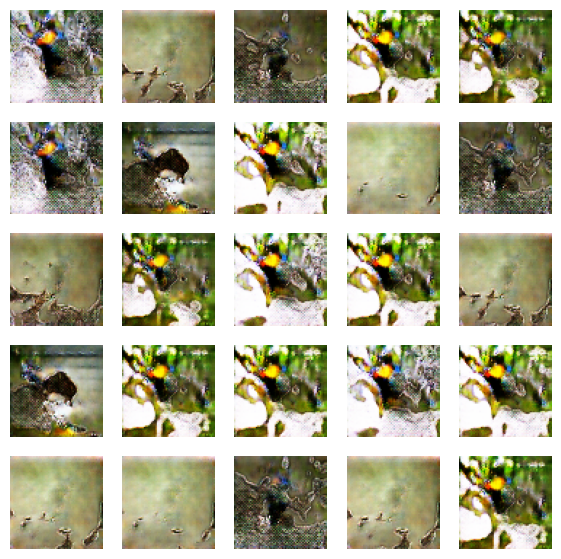

Saving checkpoint for epoch 111 at checkpoint/bert_encode/ckpt-13


Time for epoch 111 is 356.70046305656433 sec
Time for epoch 112 is 366.6081213951111 sec
Time for epoch 113 is 407.8316180706024 sec
Time for epoch 114 is 359.85236144065857 sec
Time for epoch 115 is 356.079309463501 sec
Time for epoch 116 is 354.2218496799469 sec
Time for epoch 117 is 367.736202955246 sec
Time for epoch 118 is 356.1004681587219 sec
Time for epoch 119 is 369.68849325180054 sec
Time for epoch 120 is 385.32139706611633 sec
D_loss [2.49321699]
G_loss [5.14461613]
D_loss [2.39284229]
G_loss [5.50737762]
D_loss [2.52420521]
G_loss [5.42893744]
D_loss [2.31707573]
G_loss [4.88618565]
D_loss [2.42826176]
G_loss [6.79462624]
D_loss [2.68588543]
G_loss [4.65741444]
D_loss [2.47407341]
G_loss [4.00678635]
D_loss [2.31901121]
G_loss [4.93541241]
D_loss [2.38765979]
G_loss [5.50373173]
D_loss [2.31404686]
G_loss [4.5088172]
D_loss [2.52650666]
G_loss [4.96838522]
D_loss [2.4289403]
G_loss [4.5854187]
D_loss [2.37784481]
G_loss [3.42943883]
D_loss [2.30306482]
G_loss [5.21889448]
D

D_loss [2.43679476]
G_loss [3.99937248]
D_loss [2.43031025]
G_loss [4.03236]
D_loss [2.32254529]
G_loss [6.01777267]
D_loss [2.27795649]
G_loss [5.74240208]
D_loss [2.47118425]
G_loss [5.40905762]
D_loss [2.27143383]
G_loss [5.00960636]
D_loss [2.365026]
G_loss [4.94679928]
D_loss [2.57335281]
G_loss [4.29234791]
D_loss [2.30689478]
G_loss [5.13686085]
D_loss [3.15832376]
G_loss [5.679389]
D_loss [2.59607172]
G_loss [4.51781845]
D_loss [2.74322939]
G_loss [3.71360445]
D_loss [2.70293641]
G_loss [3.81728458]
D_loss [2.45239806]
G_loss [4.10847855]
D_loss [2.37207437]
G_loss [5.00488]
D_loss [2.46422]
G_loss [4.47575092]
D_loss [2.55182052]
G_loss [5.08717632]
D_loss [2.57147503]
G_loss [4.13982487]
D_loss [2.52344]
G_loss [4.45830679]
D_loss [2.39214969]
G_loss [5.53586149]
D_loss [2.4135704]
G_loss [5.23147583]
D_loss [2.57615757]
G_loss [5.20740509]
D_loss [2.67774487]
G_loss [5.29112816]
D_loss [2.54046202]
G_loss [3.78306603]
D_loss [2.49222398]
G_loss [3.93790555]
D_loss [2.4658334

D_loss [2.44470835]
G_loss [3.81126809]
D_loss [2.20920849]
G_loss [4.22661591]
D_loss [2.40767884]
G_loss [4.14126158]
D_loss [2.48897362]
G_loss [3.88143897]
D_loss [2.64476395]
G_loss [6.76407051]
D_loss [2.51135063]
G_loss [4.64506197]
D_loss [2.54530048]
G_loss [3.97995234]
D_loss [2.71287584]
G_loss [4.98978233]
D_loss [2.48004103]
G_loss [4.94606304]
D_loss [2.54579115]
G_loss [4.88565636]
D_loss [2.54081583]
G_loss [4.78233337]
D_loss [2.4071753]
G_loss [3.93031502]
D_loss [2.44398904]
G_loss [3.88320279]
D_loss [2.54899788]
G_loss [4.15805054]
D_loss [2.64564037]
G_loss [6.90453815]
D_loss [2.46975183]
G_loss [3.33825636]
D_loss [2.71694517]
G_loss [3.5854435]
D_loss [2.70163751]
G_loss [3.886585]
D_loss [2.39619446]
G_loss [3.9993217]
D_loss [2.2229414]
G_loss [4.29974651]
D_loss [2.4372015]
G_loss [5.18639278]
D_loss [2.41471505]
G_loss [6.56485176]
D_loss [2.40441728]
G_loss [4.95403242]
D_loss [2.39992619]
G_loss [4.02145]
D_loss [2.69599915]
G_loss [4.54114151]
D_loss [2.

D_loss [2.50178]
G_loss [3.66815805]
D_loss [2.38454151]
G_loss [5.09012794]
D_loss [2.37027121]
G_loss [3.75312662]
D_loss [2.30668235]
G_loss [3.74703074]
D_loss [2.26382899]
G_loss [6.71987724]
D_loss [2.46578097]
G_loss [5.74765587]
D_loss [2.3758018]
G_loss [5.02565575]
D_loss [2.39265084]
G_loss [4.69391441]
D_loss [2.46364784]
G_loss [4.42983246]
D_loss [2.26844549]
G_loss [5.69181728]
D_loss [2.58610249]
G_loss [4.83208]
D_loss [2.52255058]
G_loss [3.84066153]
D_loss [2.54227209]
G_loss [6.32523632]
D_loss [2.42740726]
G_loss [5.20095587]
D_loss [2.29323483]
G_loss [5.37355328]
D_loss [2.26411438]
G_loss [4.89753532]
D_loss [2.51289654]
G_loss [6.94520664]
D_loss [2.47944927]
G_loss [4.75293112]
D_loss [2.21544075]
G_loss [4.57493]
D_loss [2.22023106]
G_loss [5.17684]
D_loss [2.44003654]
G_loss [5.14331913]
D_loss [2.3599453]
G_loss [4.80909967]
D_loss [2.40662622]
G_loss [4.37792206]
D_loss [2.50309467]
G_loss [4.83174515]
D_loss [2.37617326]
G_loss [5.24831295]
D_loss [2.7015

G_loss [4.62487173]
D_loss [2.42267203]
G_loss [4.64958143]
D_loss [2.37076235]
G_loss [4.46521854]
D_loss [2.49083138]
G_loss [6.19818926]
D_loss [2.61781645]
G_loss [5.49895763]
D_loss [2.6148994]
G_loss [5.29902649]
D_loss [2.47064638]
G_loss [4.66365433]
D_loss [2.35106039]
G_loss [5.49180317]
D_loss [2.44461489]
G_loss [5.04631138]
D_loss [2.35451603]
G_loss [5.01399326]
D_loss [2.54474974]
G_loss [6.15467453]
D_loss [2.3688066]
G_loss [4.74904776]
D_loss [2.55315399]
G_loss [4.48367786]
D_loss [2.42530632]
G_loss [5.43964434]
D_loss [2.44060469]
G_loss [5.55311298]
D_loss [2.80399418]
G_loss [7.87530708]
D_loss [2.35349965]
G_loss [5.27689]
D_loss [2.3300786]
G_loss [5.45126247]
D_loss [3.18754339]
G_loss [4.20305347]
D_loss [2.68723226]
G_loss [4.04400301]
D_loss [2.68346453]
G_loss [3.79349303]
D_loss [2.47458696]
G_loss [5.38389778]
D_loss [2.52988315]
G_loss [4.84475899]
D_loss [2.43912315]
G_loss [6.90443707]
D_loss [2.310287]
G_loss [6.16312122]
D_loss [2.47045016]
G_loss [

D_loss [2.39934158]
G_loss [3.71836615]
D_loss [2.58980846]
G_loss [3.24797535]
D_loss [2.56880331]
G_loss [4.16830921]
D_loss [2.46522808]
G_loss [4.70808363]
D_loss [2.3557725]
G_loss [5.15144968]
D_loss [2.45899057]
G_loss [5.42076397]
D_loss [2.55472]
G_loss [5.16869497]
D_loss [2.37809873]
G_loss [4.69757175]
D_loss [2.41667461]
G_loss [4.36339331]
D_loss [2.44054842]
G_loss [4.26258945]
D_loss [2.65271854]
G_loss [4.6879921]
D_loss [2.54121661]
G_loss [4.420331]
D_loss [2.40536833]
G_loss [4.09270906]
D_loss [2.56554174]
G_loss [5.40874577]
D_loss [2.49999928]
G_loss [4.37496376]
D_loss [2.3228364]
G_loss [5.01394558]
D_loss [2.20074987]
G_loss [5.22713]
D_loss [2.39893198]
G_loss [5.18911219]
D_loss [2.33816957]
G_loss [5.62991333]
D_loss [2.37478161]
G_loss [4.6250453]
D_loss [2.50236]
G_loss [4.43290901]
D_loss [2.55643988]
G_loss [3.83347797]
D_loss [2.48056602]
G_loss [5.23516083]
D_loss [2.58245182]
G_loss [4.85327816]
D_loss [2.46872473]
G_loss [4.33279705]
D_loss [2.30262

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



D_loss [2.47260356]
G_loss [4.45355654]
D_loss [2.4365387]
G_loss [4.70034933]
D_loss [2.28861523]
G_loss [5.00597477]
D_loss [2.52272153]
G_loss [5.08088589]
D_loss [2.61754179]
G_loss [4.68837786]
D_loss [2.55213451]
G_loss [5.66951656]
D_loss [2.42136979]
G_loss [4.21176624]
D_loss [2.48675156]
G_loss [4.80166101]
D_loss [2.17011976]
G_loss [4.67642117]
D_loss [2.41311097]
G_loss [5.20309734]
D_loss [2.39035106]
G_loss [6.37973118]
D_loss [2.34100866]
G_loss [5.32264233]
D_loss [2.28584552]
G_loss [5.60860634]
D_loss [2.7977376]
G_loss [5.31959629]
D_loss [2.4317081]
G_loss [4.28112221]
D_loss [2.46020174]
G_loss [4.35514879]
D_loss [2.61977363]
G_loss [5.47099686]
D_loss [2.53892732]
G_loss [5.02783]
D_loss [2.42699]
G_loss [4.81188917]
D_loss [2.96382475]
G_loss [5.06880379]
D_loss [2.41931105]
G_loss [3.78767252]
D_loss [2.4714694]
G_loss [4.25761843]
D_loss [2.71661377]
G_loss [3.54012895]
D_loss [2.26954055]
G_loss [5.54269743]
D_loss [2.28925705]
G_loss [5.75065899]
D_loss [2.

D_loss [2.26919603]
G_loss [6.80603361]
D_loss [2.48913431]
G_loss [4.79023743]
D_loss [2.24976873]
G_loss [4.78799105]
D_loss [2.2503686]
G_loss [4.88077164]
D_loss [2.34930468]
G_loss [5.73277187]
D_loss [2.4243896]
G_loss [5.21419716]
D_loss [2.47065377]
G_loss [5.04151726]
D_loss [2.16050172]
G_loss [5.77588654]
D_loss [2.30157757]
G_loss [5.06394958]
D_loss [2.3204093]
G_loss [3.63765097]
D_loss [2.54568577]
G_loss [5.40241146]
D_loss [2.24037766]
G_loss [5.26915407]
D_loss [2.26591587]
G_loss [6.50005531]
D_loss [2.55223751]
G_loss [6.66468143]
D_loss [2.66879487]
G_loss [4.11884117]
D_loss [2.37123919]
G_loss [3.83869672]
D_loss [2.25207329]
G_loss [4.48037243]
D_loss [2.54562473]
G_loss [6.27681446]
D_loss [2.1813674]
G_loss [5.47676134]
D_loss [2.33984613]
G_loss [6.20806122]
D_loss [2.33170867]
G_loss [6.6186347]
D_loss [2.40611458]
G_loss [5.81040907]
D_loss [2.43701124]
G_loss [5.81577158]
D_loss [2.52303076]
G_loss [5.09065]
D_loss [2.35637498]
G_loss [4.13947964]
D_loss [

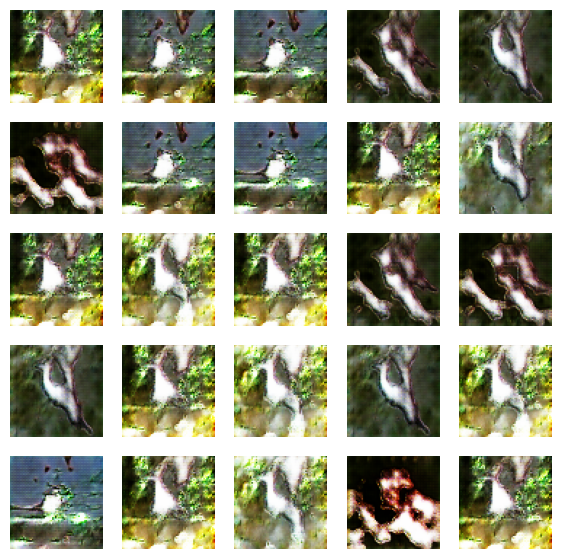

Saving checkpoint for epoch 121 at checkpoint/bert_encode/ckpt-14


Time for epoch 121 is 400.60236835479736 sec
Time for epoch 122 is 418.8000154495239 sec
Time for epoch 123 is 372.8326814174652 sec
Time for epoch 124 is 393.1889293193817 sec
Time for epoch 125 is 388.0139572620392 sec
Time for epoch 126 is 360.4992699623108 sec
Time for epoch 127 is 365.95573115348816 sec
Time for epoch 128 is 373.5791404247284 sec
Time for epoch 129 is 373.3641641139984 sec
Time for epoch 130 is 393.3775610923767 sec
D_loss [2.37076139]
G_loss [4.75517464]
D_loss [2.48044133]
G_loss [3.48553562]
D_loss [2.41839457]
G_loss [4.24476576]
D_loss [2.41703343]
G_loss [5.48838806]
D_loss [2.52743959]
G_loss [6.12823]
D_loss [2.32556248]
G_loss [5.34217596]
D_loss [2.46590209]
G_loss [5.75595808]
D_loss [2.19887686]
G_loss [4.94841766]
D_loss [2.44442225]
G_loss [5.21585608]
D_loss [2.52854848]
G_loss [4.52118969]
D_loss [2.29709721]
G_loss [5.21039]
D_loss [2.49124289]
G_loss [4.96580267]
D_loss [2.22193718]
G_loss [4.67661953]
D_loss [2.61979961]
G_loss [5.42712593]
D_lo

G_loss [4.41101074]
D_loss [2.36565495]
G_loss [4.76242733]
D_loss [2.27546954]
G_loss [7.99820089]
D_loss [2.33824205]
G_loss [5.30344963]
D_loss [2.25081491]
G_loss [5.15865231]
D_loss [2.57217884]
G_loss [3.85019612]
D_loss [2.48080206]
G_loss [3.85375953]
D_loss [2.50106454]
G_loss [5.32506371]
D_loss [2.41971064]
G_loss [4.48574209]
D_loss [2.50478649]
G_loss [4.71540928]
D_loss [2.70915079]
G_loss [5.79807186]
D_loss [2.48061323]
G_loss [3.74732304]
D_loss [2.39845514]
G_loss [4.08294535]
D_loss [2.47882318]
G_loss [5.51854897]
D_loss [2.45554066]
G_loss [4.87453747]
D_loss [2.61921024]
G_loss [4.15934801]
D_loss [2.54744577]
G_loss [4.58695793]
D_loss [2.44815493]
G_loss [4.04175568]
D_loss [2.61358976]
G_loss [4.06393385]
D_loss [2.21727371]
G_loss [4.41954899]
D_loss [2.43778801]
G_loss [4.80530739]
D_loss [2.24737835]
G_loss [5.00592804]
D_loss [2.250916]
G_loss [4.85073233]
D_loss [2.5205555]
G_loss [4.46414]
D_loss [2.54854727]
G_loss [5.1319356]
D_loss [2.2932663]
G_loss [

D_loss [2.63444]
G_loss [3.67814255]
D_loss [2.53887415]
G_loss [4.20455599]
D_loss [2.41919947]
G_loss [4.92288494]
D_loss [2.47322512]
G_loss [4.35654211]
D_loss [2.59699488]
G_loss [4.32113409]
D_loss [2.40940714]
G_loss [3.71178484]
D_loss [2.34204578]
G_loss [4.59891796]
D_loss [2.5916748]
G_loss [4.12869453]
D_loss [2.37469149]
G_loss [3.98690557]
D_loss [2.30671239]
G_loss [4.94700241]
D_loss [2.50892901]
G_loss [6.30277824]
D_loss [2.43292594]
G_loss [4.21269798]
D_loss [2.47428584]
G_loss [4.04212666]
D_loss [2.5561223]
G_loss [4.42501545]
D_loss [2.22174168]
G_loss [4.7941885]
D_loss [2.36221743]
G_loss [4.85612679]
D_loss [2.57136059]
G_loss [4.8312068]
D_loss [3.12036324]
G_loss [6.25246143]
D_loss [2.53848267]
G_loss [4.87050056]
D_loss [2.68663073]
G_loss [5.67184639]
D_loss [2.61887503]
G_loss [5.48044109]
D_loss [2.58051395]
G_loss [4.16767025]
D_loss [2.27771258]
G_loss [4.79597759]
D_loss [2.48418808]
G_loss [4.66237]
D_loss [2.57610655]
G_loss [4.69017172]
D_loss [2.

D_loss [2.50237131]
G_loss [3.89570832]
D_loss [2.18866158]
G_loss [5.77767563]
D_loss [2.51262617]
G_loss [4.39566898]
D_loss [2.39468288]
G_loss [4.85741234]
D_loss [2.40314484]
G_loss [5.3902359]
D_loss [2.37990904]
G_loss [5.5182724]
D_loss [2.57013655]
G_loss [5.64273453]
D_loss [2.31688499]
G_loss [4.74894524]
D_loss [2.51722741]
G_loss [5.13311291]
D_loss [2.65853715]
G_loss [5.26001215]
D_loss [2.51901579]
G_loss [3.6253562]
D_loss [2.51776028]
G_loss [4.83127975]
D_loss [2.53793049]
G_loss [4.03952694]
D_loss [2.49155]
G_loss [4.91893911]
D_loss [2.76310158]
G_loss [6.10629034]
D_loss [2.42723966]
G_loss [4.00365353]
D_loss [2.25695133]
G_loss [6.50034237]
D_loss [2.49646711]
G_loss [3.65501976]
D_loss [2.39262581]
G_loss [4.85502148]
D_loss [2.32915711]
G_loss [4.5135622]
D_loss [2.37776]
G_loss [5.07325315]
D_loss [2.39272165]
G_loss [4.38247538]
D_loss [3.11835957]
G_loss [5.55799437]
D_loss [2.67708921]
G_loss [4.11246729]
D_loss [2.62563419]
G_loss [3.47385955]
D_loss [2.

G_loss [5.32981968]
D_loss [2.41228509]
G_loss [5.95315647]
D_loss [2.68852425]
G_loss [4.71658754]
D_loss [2.42723489]
G_loss [4.71822882]
D_loss [2.51816845]
G_loss [3.88550854]
D_loss [2.31988502]
G_loss [4.25870085]
D_loss [2.26606274]
G_loss [4.76394081]
D_loss [2.26452732]
G_loss [5.0104]
D_loss [2.74982595]
G_loss [4.83043289]
D_loss [2.99930334]
G_loss [3.88783884]
D_loss [2.38907]
G_loss [3.97369385]
D_loss [2.64770079]
G_loss [4.52569294]
D_loss [2.65863895]
G_loss [3.58962464]
D_loss [2.3229816]
G_loss [5.26690578]
D_loss [2.39495826]
G_loss [4.7889967]
D_loss [2.19939041]
G_loss [5.02548409]
D_loss [2.52583957]
G_loss [5.00921726]
D_loss [2.27985048]
G_loss [5.78494883]
D_loss [2.53796625]
G_loss [5.5705204]
D_loss [2.3594532]
G_loss [3.90975404]
D_loss [2.41655159]
G_loss [4.73412418]
D_loss [2.84009123]
G_loss [4.83895302]
D_loss [2.45115137]
G_loss [5.89986897]
D_loss [2.29679751]
G_loss [4.69557285]
D_loss [2.25701094]
G_loss [4.47531033]
D_loss [2.4274416]
G_loss [4.51

G_loss [6.06967974]
D_loss [2.3070817]
G_loss [4.90545607]
D_loss [2.37863278]
G_loss [5.07269573]
D_loss [2.45751524]
G_loss [4.63990211]
D_loss [2.31941938]
G_loss [4.7281]
D_loss [2.45312309]
G_loss [4.96522617]
D_loss [2.46268725]
G_loss [4.38780499]
D_loss [2.39419889]
G_loss [5.30313492]
D_loss [2.7080884]
G_loss [4.97169447]
D_loss [2.4685216]
G_loss [4.30625772]
D_loss [2.40337682]
G_loss [5.38870621]
D_loss [2.66108656]
G_loss [6.80121517]
D_loss [2.30128741]
G_loss [4.24983263]
D_loss [2.63277912]
G_loss [5.24504852]
D_loss [2.26522803]
G_loss [3.46389532]
D_loss [2.5430522]
G_loss [4.60169601]
D_loss [2.56558204]
G_loss [4.40144444]
D_loss [2.42813039]
G_loss [4.89293766]
D_loss [2.43472242]
G_loss [5.23663235]
D_loss [2.49970341]
G_loss [4.8418541]
D_loss [2.36853123]
G_loss [4.0914588]
D_loss [2.51055336]
G_loss [5.37324524]
D_loss [2.43911529]
G_loss [5.63383579]
D_loss [2.31119299]
G_loss [5.26136637]
D_loss [2.36811399]
G_loss [6.59226894]
D_loss [2.22405624]
G_loss [5.

G_loss [5.68334389]
D_loss [2.38992214]
G_loss [4.36294556]
D_loss [2.41540527]
G_loss [4.49618149]
D_loss [2.54461336]
G_loss [4.79236078]
D_loss [2.42858171]
G_loss [5.69727325]
D_loss [2.35567331]
G_loss [5.0024929]
D_loss [2.61957884]
G_loss [4.50280237]
D_loss [2.42586517]
G_loss [5.29508162]
D_loss [2.58471084]
G_loss [5.39987135]
D_loss [2.54959679]
G_loss [5.26631069]
D_loss [2.66304111]
G_loss [4.48674536]
D_loss [2.6246376]
G_loss [4.91388]
D_loss [2.59550285]
G_loss [5.1293]
D_loss [2.33532071]
G_loss [5.29375172]
D_loss [2.38968801]
G_loss [5.80744934]
D_loss [2.37677813]
G_loss [5.54764223]
D_loss [2.51730204]
G_loss [4.49355888]
D_loss [2.50874186]
G_loss [5.25967598]
D_loss [2.41814971]
G_loss [4.05804253]
D_loss [2.31950426]
G_loss [4.95404053]
D_loss [2.34247255]
G_loss [4.9995203]
D_loss [2.3973012]
G_loss [4.11512566]
D_loss [2.38969183]
G_loss [4.90894461]
D_loss [2.3641634]
G_loss [5.75247908]
D_loss [2.60380602]
G_loss [5.48938656]
D_loss [2.75829649]
G_loss [5.11

D_loss [2.23287344]
G_loss [5.07839298]
D_loss [2.33088636]
G_loss [5.22242451]
D_loss [3.17140341]
G_loss [4.85691166]
D_loss [2.76417542]
G_loss [3.80858397]
D_loss [2.63917494]
G_loss [3.52729893]
D_loss [2.53700542]
G_loss [4.60722351]
D_loss [2.47593927]
G_loss [6.57759285]
D_loss [2.613168]
G_loss [5.38223934]
D_loss [2.45726609]
G_loss [4.91008615]
D_loss [2.32560062]
G_loss [4.60041046]
D_loss [2.42497492]
G_loss [4.48715]
D_loss [2.4464438]
G_loss [3.91399789]
D_loss [2.48538113]
G_loss [4.7550149]
D_loss [2.43394661]
G_loss [5.04499674]
D_loss [2.53647232]
G_loss [4.91550255]
D_loss [2.56737638]
G_loss [4.74261761]
D_loss [2.52696419]
G_loss [4.84645367]
D_loss [2.48478246]
G_loss [5.50007963]
D_loss [2.49292755]
G_loss [4.94172192]
D_loss [2.39539647]
G_loss [4.985]
D_loss [2.479]
G_loss [5.0824585]
D_loss [2.33118677]
G_loss [5.40715551]
D_loss [2.47710657]
G_loss [4.40499496]
D_loss [2.52747798]
G_loss [5.02646732]
D_loss [2.2647438]
G_loss [4.22682381]
D_loss [2.5066793]


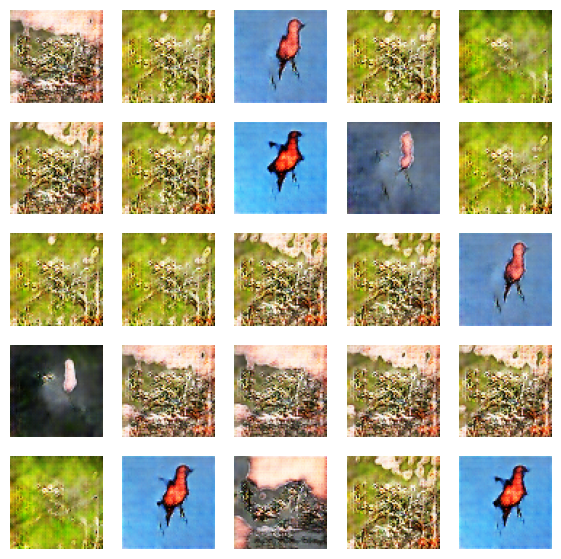

Saving checkpoint for epoch 131 at checkpoint/bert_encode/ckpt-15


Time for epoch 131 is 397.64556646347046 sec
Time for epoch 132 is 369.48344707489014 sec
Time for epoch 133 is 381.368008852005 sec
Time for epoch 134 is 391.0511677265167 sec
Time for epoch 135 is 361.32026267051697 sec
Time for epoch 136 is 374.169558763504 sec
Time for epoch 137 is 381.705899477005 sec
Time for epoch 138 is 381.0573241710663 sec
Time for epoch 139 is 409.7636661529541 sec
Time for epoch 140 is 393.31429147720337 sec
D_loss [2.56533623]
G_loss [4.60665321]
D_loss [2.52086878]
G_loss [3.99042153]
D_loss [2.20163131]
G_loss [4.27589607]
D_loss [2.63812852]
G_loss [4.71917057]
D_loss [2.47628236]
G_loss [3.75348043]
D_loss [2.40647173]
G_loss [4.69424534]
D_loss [2.39940596]
G_loss [4.45554924]
D_loss [2.52648878]
G_loss [5.32970428]
D_loss [2.33058119]
G_loss [4.95166779]
D_loss [2.61537719]
G_loss [4.48523235]
D_loss [2.6954205]
G_loss [3.43529391]
D_loss [2.40112042]
G_loss [3.59091949]
D_loss [2.09491777]
G_loss [5.26893902]
D_loss [2.48386717]
G_loss [4.78740644]


D_loss [2.43504715]
G_loss [4.59468508]
D_loss [2.66503215]
G_loss [5.31432533]
D_loss [2.79360747]
G_loss [4.51171827]
D_loss [2.51315451]
G_loss [4.24704]
D_loss [2.34181738]
G_loss [4.39891243]
D_loss [2.43948698]
G_loss [4.62917423]
D_loss [2.4853189]
G_loss [4.98366737]
D_loss [2.37106]
G_loss [5.67648125]
D_loss [2.50054812]
G_loss [4.52968121]
D_loss [2.5023284]
G_loss [5.00063896]
D_loss [2.37950134]
G_loss [5.06011629]
D_loss [2.29460263]
G_loss [3.9314239]
D_loss [2.48536205]
G_loss [5.67601]
D_loss [2.39870715]
G_loss [4.26663494]
D_loss [2.52593756]
G_loss [5.3129673]
D_loss [2.28063679]
G_loss [6.34026623]
D_loss [2.454669]
G_loss [4.84219837]
D_loss [2.29076266]
G_loss [4.50895]
D_loss [2.42130613]
G_loss [5.41871357]
D_loss [2.43549871]
G_loss [5.28905106]
D_loss [2.38354874]
G_loss [4.14525318]
D_loss [2.32511115]
G_loss [4.29276562]
D_loss [2.47082]
G_loss [5.09850311]
D_loss [2.67623806]
G_loss [6.38197041]
D_loss [2.53377485]
G_loss [5.27850914]
D_loss [2.50885201]
G

D_loss [2.19829226]
G_loss [6.75605583]
D_loss [2.51770258]
G_loss [6.24142]
D_loss [2.46811438]
G_loss [5.03701925]
D_loss [2.34479451]
G_loss [5.91747379]
D_loss [2.28339195]
G_loss [5.55350828]
D_loss [2.43102598]
G_loss [5.46348238]
D_loss [2.47147822]
G_loss [3.94168496]
D_loss [2.53816628]
G_loss [5.05056524]
D_loss [2.41564465]
G_loss [4.25558281]
D_loss [2.18187284]
G_loss [5.03858089]
D_loss [2.64911699]
G_loss [5.7044158]
D_loss [2.31540632]
G_loss [4.4842515]
D_loss [2.30995226]
G_loss [5.09084606]
D_loss [2.40234804]
G_loss [5.30284]
D_loss [2.48178387]
G_loss [6.36558533]
D_loss [2.32921314]
G_loss [4.38228273]
D_loss [2.39781904]
G_loss [5.55205584]
D_loss [2.41935396]
G_loss [5.00102234]
D_loss [2.39042425]
G_loss [5.170362]
D_loss [2.49697256]
G_loss [5.58686686]
D_loss [2.54216743]
G_loss [5.55112553]
D_loss [2.43014622]
G_loss [5.30838585]
D_loss [2.62069201]
G_loss [3.86769629]
D_loss [2.59355354]
G_loss [4.54559803]
D_loss [2.36816216]
G_loss [4.92201805]
D_loss [2.

G_loss [4.59284782]
D_loss [2.49095392]
G_loss [4.95284224]
D_loss [2.58631206]
G_loss [5.66124392]
D_loss [2.86086631]
G_loss [3.77460408]
D_loss [2.57668304]
G_loss [4.38443947]
D_loss [2.4510417]
G_loss [4.04683161]
D_loss [2.3952148]
G_loss [4.57187748]
D_loss [2.43176365]
G_loss [5.20915413]
D_loss [2.37262058]
G_loss [5.14353418]
D_loss [2.27615047]
G_loss [4.83774662]
D_loss [2.48179913]
G_loss [4.79206753]
D_loss [2.46515417]
G_loss [4.17192]
D_loss [2.48126912]
G_loss [5.65606737]
D_loss [2.42135143]
G_loss [4.01368427]
D_loss [2.61366701]
G_loss [3.87243]
D_loss [2.51628137]
G_loss [3.9890449]
D_loss [2.63590288]
G_loss [5.19395542]
D_loss [2.35809016]
G_loss [4.99697399]
D_loss [2.58200836]
G_loss [4.59037399]
D_loss [2.49999404]
G_loss [3.67275524]
D_loss [2.3996439]
G_loss [3.93114662]
D_loss [2.42411232]
G_loss [4.50253773]
D_loss [2.31249285]
G_loss [5.64888382]
D_loss [2.40862179]
G_loss [5.10697651]
D_loss [2.56587744]
G_loss [6.46253061]
D_loss [2.45599556]
G_loss [4.

G_loss [4.66494751]
D_loss [2.64050865]
G_loss [6.38476849]
D_loss [2.46643591]
G_loss [5.02384186]
D_loss [2.51787806]
G_loss [4.91345406]
D_loss [2.40106344]
G_loss [4.9308219]
D_loss [2.29722261]
G_loss [4.6902051]
D_loss [2.46401978]
G_loss [7.19491]
D_loss [2.42774916]
G_loss [6.40363121]
D_loss [2.3061018]
G_loss [5.77057743]
D_loss [2.42630243]
G_loss [5.84753704]
D_loss [2.40058708]
G_loss [6.19728947]
D_loss [2.45210767]
G_loss [4.86393833]
D_loss [2.35279775]
G_loss [4.86724091]
D_loss [2.34459758]
G_loss [4.6111865]
D_loss [2.33588505]
G_loss [4.79457712]
D_loss [2.45886445]
G_loss [6.19332457]
D_loss [2.41583967]
G_loss [4.83022451]
D_loss [2.34586906]
G_loss [6.52478504]
D_loss [2.44202042]
G_loss [3.9631443]
D_loss [2.34417939]
G_loss [4.56365108]
D_loss [2.40612149]
G_loss [6.45393562]
D_loss [2.73941851]
G_loss [8.68705082]
D_loss [2.56607628]
G_loss [5.57308388]
D_loss [2.48036766]
G_loss [4.30618525]
D_loss [2.44200158]
G_loss [4.6671629]
D_loss [2.53027487]
G_loss [4

G_loss [5.40431547]
D_loss [2.21937561]
G_loss [4.39201546]
D_loss [2.52758408]
G_loss [5.77681541]
D_loss [2.39701247]
G_loss [4.43639278]
D_loss [2.46489501]
G_loss [4.4401989]
D_loss [2.54304123]
G_loss [4.2791419]
D_loss [2.52815151]
G_loss [4.54863214]
D_loss [2.49735188]
G_loss [6.26761436]
D_loss [2.48919058]
G_loss [5.64966965]
D_loss [2.53855062]
G_loss [4.35163736]
D_loss [2.65768027]
G_loss [4.20344591]
D_loss [2.2727809]
G_loss [4.52467]
D_loss [2.44275]
G_loss [5.11042261]
D_loss [2.34232187]
G_loss [6.71282768]
D_loss [2.18604708]
G_loss [5.57925797]
D_loss [2.42656136]
G_loss [4.93064833]
D_loss [2.41342783]
G_loss [7.106534]
D_loss [2.60908413]
G_loss [6.97056866]
D_loss [2.52801466]
G_loss [5.05908442]
D_loss [2.23882198]
G_loss [5.61132288]
D_loss [2.66131067]
G_loss [5.90011597]
D_loss [2.54726505]
G_loss [4.64177275]
D_loss [2.41950607]
G_loss [4.57678127]
D_loss [2.30699015]
G_loss [4.59098434]
D_loss [2.31475544]
G_loss [6.68348]
D_loss [2.60098696]
G_loss [3.9891

D_loss [2.24674034]
G_loss [5.73023415]
D_loss [2.31120229]
G_loss [5.68837357]
D_loss [2.68289328]
G_loss [5.50453186]
D_loss [2.57887125]
G_loss [5.29876709]
D_loss [2.34587407]
G_loss [5.5802803]
D_loss [2.5410943]
G_loss [5.63817215]
D_loss [2.46213722]
G_loss [5.72163105]
D_loss [2.34825206]
G_loss [4.40545177]
D_loss [2.46685767]
G_loss [4.25541306]
D_loss [2.31463408]
G_loss [4.79669]
D_loss [2.29770422]
G_loss [4.95542765]
D_loss [2.20574284]
G_loss [4.3083868]
D_loss [2.27788806]
G_loss [5.11375618]
D_loss [2.35170507]
G_loss [5.63660812]
D_loss [2.29371357]
G_loss [5.2401123]
D_loss [2.33893871]
G_loss [5.66726589]
D_loss [2.57249641]
G_loss [5.92100334]
D_loss [2.51326942]
G_loss [5.03770065]
D_loss [2.45056629]
G_loss [6.31751919]
D_loss [2.65718126]
G_loss [4.96331882]
D_loss [2.51003551]
G_loss [4.19201565]
D_loss [2.5948596]
G_loss [6.75226355]
D_loss [2.56050587]
G_loss [4.24498844]
D_loss [2.38887882]
G_loss [5.52922726]
D_loss [2.38794136]
G_loss [5.61575603]
D_loss [

G_loss [5.57138252]
D_loss [2.39058709]
G_loss [4.4176836]
D_loss [2.18557763]
G_loss [5.09463215]
D_loss [2.35996056]
G_loss [5.85175943]
D_loss [2.55394435]
G_loss [5.80513811]
D_loss [2.66712093]
G_loss [6.59265852]
D_loss [2.46995449]
G_loss [4.50450897]
D_loss [2.42007589]
G_loss [4.84395123]
D_loss [2.38965297]
G_loss [4.74104309]
D_loss [2.5104785]
G_loss [6.0677681]
D_loss [2.52737188]
G_loss [4.89594221]
D_loss [2.38926]
G_loss [5.95191336]
D_loss [2.49240637]
G_loss [6.00058746]
D_loss [2.43491411]
G_loss [4.95862103]
D_loss [2.50430155]
G_loss [4.78079224]
D_loss [2.30501652]
G_loss [4.93981]
D_loss [2.62133741]
G_loss [5.26257324]
D_loss [2.34552431]
G_loss [4.6813488]
D_loss [2.30033278]
G_loss [4.0827589]
D_loss [2.56041861]
G_loss [4.89415]
D_loss [2.46489525]
G_loss [6.65389538]
D_loss [2.43098211]
G_loss [7.39040136]
D_loss [2.57643151]
G_loss [5.42367363]
D_loss [2.33128977]
G_loss [5.1181674]
D_loss [2.37103558]
G_loss [5.95455933]
D_loss [2.38463497]
G_loss [6.85595

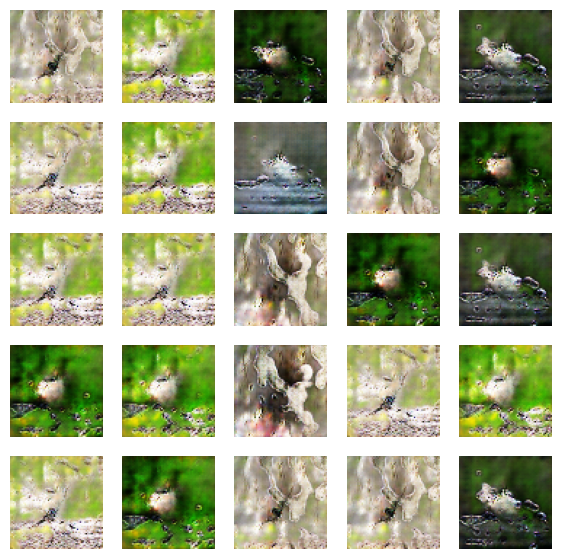

Saving checkpoint for epoch 141 at checkpoint/bert_encode/ckpt-16


Time for epoch 141 is 390.66171884536743 sec
Time for epoch 142 is 388.4644339084625 sec
Time for epoch 143 is 382.3150157928467 sec
Time for epoch 144 is 366.5438029766083 sec
Time for epoch 145 is 368.885466337204 sec
Time for epoch 146 is 371.60249376296997 sec
Time for epoch 147 is 373.70584201812744 sec
Time for epoch 148 is 377.3053300380707 sec
Time for epoch 149 is 365.81838607788086 sec
Time for epoch 150 is 382.95083355903625 sec
D_loss [2.40503168]
G_loss [5.88344336]
D_loss [2.28147268]
G_loss [4.58183622]
D_loss [2.43548822]
G_loss [5.40797901]
D_loss [2.25307512]
G_loss [5.32027817]
D_loss [2.17227793]
G_loss [5.15454149]
D_loss [2.24006891]
G_loss [6.52302456]
D_loss [2.19051552]
G_loss [4.81071472]
D_loss [2.41834521]
G_loss [5.50238276]
D_loss [2.58124256]
G_loss [5.98355913]
D_loss [2.32181263]
G_loss [4.85742331]
D_loss [2.23923039]
G_loss [4.92317247]
D_loss [2.30152321]
G_loss [6.25268078]
D_loss [2.5185039]
G_loss [4.59962463]
D_loss [2.54485846]
G_loss [4.2662768

G_loss [4.50888062]
D_loss [2.42991471]
G_loss [5.17039061]
D_loss [2.49616575]
G_loss [4.9622488]
D_loss [2.34993219]
G_loss [5.84388638]
D_loss [2.41714811]
G_loss [4.09927464]
D_loss [2.64469767]
G_loss [4.3795619]
D_loss [2.32072449]
G_loss [3.89999628]
D_loss [2.41594553]
G_loss [5.51111698]
D_loss [2.44351149]
G_loss [5.12101078]
D_loss [2.38404393]
G_loss [5.30127716]
D_loss [2.24976516]
G_loss [4.44627762]
D_loss [2.59360552]
G_loss [3.46955037]
D_loss [2.56373096]
G_loss [4.83930206]
D_loss [2.58507824]
G_loss [3.35550356]
D_loss [2.43321443]
G_loss [3.80363226]
D_loss [2.33565378]
G_loss [5.42395687]
D_loss [2.35581207]
G_loss [7.14865971]
D_loss [2.38662934]
G_loss [5.28244638]
D_loss [2.30207729]
G_loss [4.70912886]
D_loss [2.61026096]
G_loss [4.54179764]
D_loss [2.46208048]
G_loss [4.13647318]
D_loss [2.3574872]
G_loss [4.50808048]
D_loss [2.38974285]
G_loss [5.65077305]
D_loss [2.67339182]
G_loss [6.2395668]
D_loss [2.32726812]
G_loss [3.55865526]
D_loss [2.55007029]
G_lo

G_loss [5.52048492]
D_loss [2.68700576]
G_loss [4.64876938]
D_loss [2.37706566]
G_loss [5.0784874]
D_loss [2.43138456]
G_loss [4.9626646]
D_loss [2.56781363]
G_loss [4.04792213]
D_loss [2.59674382]
G_loss [4.24181938]
D_loss [2.32400036]
G_loss [3.89072275]
D_loss [2.75593328]
G_loss [3.51595259]
D_loss [2.564044]
G_loss [4.54777431]
D_loss [2.48490953]
G_loss [6.36668587]
D_loss [2.52184463]
G_loss [5.3812933]
D_loss [2.37504601]
G_loss [5.36766672]
D_loss [2.49136591]
G_loss [4.02505732]
D_loss [2.39858341]
G_loss [5.67556524]
D_loss [2.32001042]
G_loss [4.61593151]
D_loss [2.23051119]
G_loss [4.3223]
D_loss [2.41369247]
G_loss [5.12451935]
D_loss [2.2488625]
G_loss [3.87264633]
D_loss [2.42430592]
G_loss [4.14860487]
D_loss [2.1043787]
G_loss [5.03281879]
D_loss [2.32475615]
G_loss [5.25421667]
D_loss [2.52040815]
G_loss [5.10014]
D_loss [2.42215466]
G_loss [5.4352603]
D_loss [3.16147375]
G_loss [4.66580153]
D_loss [2.36742878]
G_loss [4.10080814]
D_loss [2.40322852]
G_loss [4.21123

G_loss [5.74281406]
D_loss [2.4167943]
G_loss [4.90581608]
D_loss [2.6986208]
G_loss [5.89830208]
D_loss [2.39700222]
G_loss [7.03804779]
D_loss [2.53707957]
G_loss [6.46819782]
D_loss [2.72908092]
G_loss [5.7316637]
D_loss [2.41339612]
G_loss [4.73405123]
D_loss [2.52267599]
G_loss [4.01142836]
D_loss [2.52464199]
G_loss [4.14960384]
D_loss [2.30147767]
G_loss [4.0247612]
D_loss [2.56638861]
G_loss [3.67399025]
D_loss [2.43663502]
G_loss [4.43118858]
D_loss [2.38604522]
G_loss [6.12293577]
D_loss [2.52489567]
G_loss [4.32580185]
D_loss [2.41536617]
G_loss [4.77021885]
D_loss [2.37560749]
G_loss [5.12582827]
D_loss [2.3601625]
G_loss [4.59190941]
D_loss [2.4610219]
G_loss [6.24612141]
D_loss [2.35446429]
G_loss [5.26373339]
D_loss [2.45891118]
G_loss [4.83053637]
D_loss [2.64070654]
G_loss [4.32637]
D_loss [2.39444256]
G_loss [3.40246582]
D_loss [2.59095621]
G_loss [6.06368208]
D_loss [2.34571671]
G_loss [4.37884617]
D_loss [2.31906509]
G_loss [6.0172739]
D_loss [2.51377392]
G_loss [4.

G_loss [3.35248]
D_loss [2.56782389]
G_loss [5.00977039]
D_loss [2.35841203]
G_loss [6.25674391]
D_loss [2.50937986]
G_loss [5.55587101]
D_loss [2.3335886]
G_loss [5.01183605]
D_loss [2.46358347]
G_loss [4.28292799]
D_loss [2.3290925]
G_loss [4.16252327]
D_loss [2.42552757]
G_loss [4.94752455]
D_loss [2.48830175]
G_loss [5.4729023]
D_loss [2.2838707]
G_loss [4.91805649]
D_loss [2.33743548]
G_loss [4.95404196]
D_loss [2.5752449]
G_loss [5.0512228]
D_loss [2.29526]
G_loss [4.53991032]
D_loss [2.60850358]
G_loss [6.16989374]
D_loss [2.59616232]
G_loss [4.03889751]
D_loss [2.64203024]
G_loss [3.51238751]
D_loss [2.4030714]
G_loss [3.72086859]
D_loss [2.40309906]
G_loss [5.0689826]
D_loss [2.4326055]
G_loss [5.09616089]
D_loss [2.2533381]
G_loss [5.05380201]
D_loss [2.37996626]
G_loss [4.41721916]
D_loss [2.35646963]
G_loss [8.18065357]
D_loss [2.32080221]
G_loss [6.12797]
D_loss [2.41446137]
G_loss [5.41484451]
D_loss [2.50705624]
G_loss [5.07928371]
D_loss [2.4004631]
G_loss [4.83084869]


G_loss [5.76993561]
D_loss [2.26109481]
G_loss [4.63442326]
D_loss [2.31833506]
G_loss [4.61918163]
D_loss [2.43130589]
G_loss [5.39993668]
D_loss [2.27389956]
G_loss [5.4103322]
D_loss [2.39126539]
G_loss [6.33476734]
D_loss [2.36644959]
G_loss [6.85581]
D_loss [2.49703503]
G_loss [6.39494753]
D_loss [2.33494043]
G_loss [5.49726915]
D_loss [2.60547543]
G_loss [5.52424812]
D_loss [2.3200841]
G_loss [4.48879814]
D_loss [2.57915354]
G_loss [5.5550065]
D_loss [2.50190592]
G_loss [5.77703476]
D_loss [2.42747545]
G_loss [5.65512896]
D_loss [2.69046283]
G_loss [6.43234921]
D_loss [2.42815351]
G_loss [5.08467197]
D_loss [2.41624403]
G_loss [4.14536858]
D_loss [2.38063097]
G_loss [4.19962454]
D_loss [2.51838112]
G_loss [5.12027168]
D_loss [2.49003696]
G_loss [5.04977655]
D_loss [2.44141483]
G_loss [5.59286261]
D_loss [2.30225205]
G_loss [6.26768446]
D_loss [2.32754278]
G_loss [5.37798071]
D_loss [2.13097858]
G_loss [4.94704819]
D_loss [2.3775332]
G_loss [4.45716858]
D_loss [2.54320383]
G_loss 

D_loss [2.31844139]
G_loss [4.44058466]
D_loss [2.41807175]
G_loss [4.42084312]
D_loss [2.51729465]
G_loss [4.34693909]
D_loss [2.53677845]
G_loss [4.93759727]
D_loss [2.3812952]
G_loss [4.81895447]
D_loss [2.42093706]
G_loss [5.77357054]
D_loss [2.20253]
G_loss [4.59177113]
D_loss [2.46332645]
G_loss [4.79563284]
D_loss [2.35019159]
G_loss [4.56225729]
D_loss [2.44182134]
G_loss [3.7794013]
D_loss [2.46259832]
G_loss [4.67473078]
D_loss [2.42033839]
G_loss [8.45181942]
D_loss [2.59129763]
G_loss [3.88929224]
D_loss [2.27857876]
G_loss [4.30805779]
D_loss [2.26020384]
G_loss [4.70054102]
D_loss [2.48858786]
G_loss [4.85270119]
D_loss [2.44299126]
G_loss [5.50711823]
D_loss [2.31754827]
G_loss [7.32023907]
D_loss [2.32177162]
G_loss [4.92642355]
D_loss [2.46890116]
G_loss [4.81444788]
D_loss [2.59864759]
G_loss [4.23176432]
D_loss [2.4191556]
G_loss [4.20136642]
D_loss [2.42063689]
G_loss [3.70986319]
D_loss [2.67270803]
G_loss [4.44191551]
D_loss [2.6121645]
G_loss [4.44719601]
D_loss 

G_loss [4.87717152]
D_loss [2.36402369]
G_loss [4.84817696]
D_loss [2.29758382]
G_loss [4.72144413]
D_loss [2.26139688]
G_loss [4.90337229]
D_loss [2.5193634]
G_loss [5.46403217]
D_loss [2.26297235]
G_loss [5.75138187]
D_loss [2.53822517]
G_loss [6.36884975]
D_loss [2.3178153]
G_loss [5.33538342]
D_loss [2.44461036]
G_loss [5.77679682]
D_loss [2.78577805]
G_loss [5.49150944]
D_loss [2.45363855]
G_loss [4.62967491]
D_loss [2.45421839]
G_loss [4.88155937]
D_loss [2.46047449]
G_loss [5.77765]
D_loss [2.24031687]
G_loss [4.59999704]
D_loss [2.61095047]
G_loss [5.17687]
D_loss [2.37119293]
G_loss [4.79730892]
D_loss [2.33205891]
G_loss [5.87613249]
D_loss [2.33576751]
G_loss [5.0441246]
D_loss [2.62317705]
G_loss [4.94195938]
D_loss [2.37126112]
G_loss [4.80370808]
D_loss [2.52144885]
G_loss [4.2110672]
D_loss [2.47653198]
G_loss [5.7818284]
D_loss [2.34348726]
G_loss [6.21501923]
D_loss [2.46207952]
G_loss [5.1032877]
D_loss [2.61539]
G_loss [5.52353573]
D_loss [2.55727196]
G_loss [4.55242

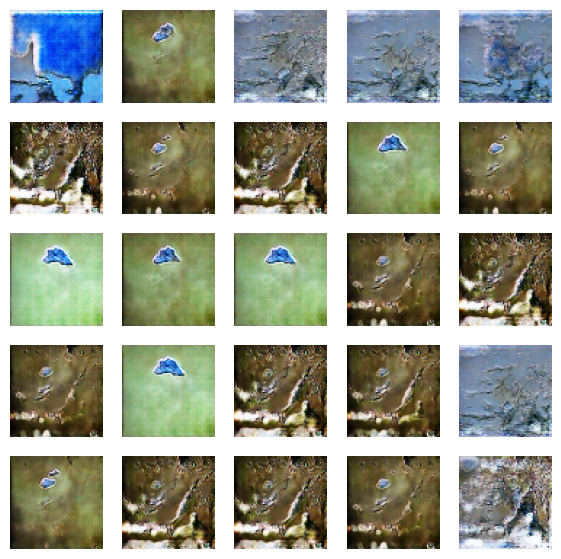

Saving checkpoint for epoch 151 at checkpoint/bert_encode/ckpt-17


Time for epoch 151 is 382.7420256137848 sec
Time for epoch 152 is 388.7389986515045 sec
Time for epoch 153 is 348.57324838638306 sec
Time for epoch 154 is 381.5064146518707 sec
Time for epoch 155 is 357.26293683052063 sec
Time for epoch 156 is 358.7892236709595 sec
Time for epoch 157 is 371.076500415802 sec
Time for epoch 158 is 360.07537388801575 sec
Time for epoch 159 is 351.91554379463196 sec
Time for epoch 160 is 387.85223388671875 sec
D_loss [2.75364661]
G_loss [4.7475071]
D_loss [2.44197583]
G_loss [4.27230835]
D_loss [2.48153114]
G_loss [4.74948931]
D_loss [2.38146591]
G_loss [5.64531326]
D_loss [2.3286767]
G_loss [5.18290234]
D_loss [2.6318593]
G_loss [4.33024502]
D_loss [2.36931872]
G_loss [5.77895927]
D_loss [2.48486471]
G_loss [6.31175804]
D_loss [2.2911005]
G_loss [7.30245781]
D_loss [2.42273903]
G_loss [5.65262222]
D_loss [2.49817419]
G_loss [5.14698315]
D_loss [2.4149282]
G_loss [5.31196785]
D_loss [2.48940325]
G_loss [5.85033464]
D_loss [2.44003439]
G_loss [5.57060814]
D

G_loss [4.60000801]
D_loss [2.5355649]
G_loss [5.46504641]
D_loss [2.50608444]
G_loss [5.24336433]
D_loss [2.33895159]
G_loss [5.39709854]
D_loss [2.60043144]
G_loss [5.18429327]
D_loss [2.58755517]
G_loss [4.30452633]
D_loss [2.27430344]
G_loss [5.25233841]
D_loss [2.83109951]
G_loss [4.92717648]
D_loss [2.38235116]
G_loss [3.81711721]
D_loss [2.51623154]
G_loss [6.64152622]
D_loss [2.46385503]
G_loss [4.77257061]
D_loss [2.96583867]
G_loss [6.42447948]
D_loss [2.55955791]
G_loss [4.58422947]
D_loss [2.4568212]
G_loss [4.05812407]
D_loss [2.42833853]
G_loss [5.09378529]
D_loss [2.42187738]
G_loss [8.13318539]
D_loss [2.25041676]
G_loss [4.4980278]
D_loss [2.46491194]
G_loss [4.33414459]
D_loss [2.14036274]
G_loss [4.48706913]
D_loss [2.40111637]
G_loss [4.12081718]
D_loss [2.25156784]
G_loss [5.05253029]
D_loss [2.2906971]
G_loss [4.43393755]
D_loss [2.45313215]
G_loss [4.95773888]
D_loss [2.40082073]
G_loss [4.64166546]
D_loss [2.47299671]
G_loss [4.49360752]
D_loss [2.483922]
G_loss

D_loss [2.34294558]
G_loss [4.45557308]
D_loss [2.37795401]
G_loss [4.65391064]
D_loss [2.52282929]
G_loss [4.40444183]
D_loss [2.41381073]
G_loss [4.86964798]
D_loss [2.4650898]
G_loss [4.39725542]
D_loss [2.32824]
G_loss [4.76414585]
D_loss [2.20961952]
G_loss [4.88690758]
D_loss [2.44865131]
G_loss [6.0585022]
D_loss [2.30970192]
G_loss [5.36087465]
D_loss [2.51690197]
G_loss [5.60065]
D_loss [2.27418089]
G_loss [6.72151]
D_loss [2.16867733]
G_loss [4.78779793]
D_loss [2.49091244]
G_loss [5.71292782]
D_loss [2.45950818]
G_loss [5.92718601]
D_loss [2.11545706]
G_loss [5.48012447]
D_loss [2.42142844]
G_loss [5.99340105]
D_loss [2.1850605]
G_loss [5.70135307]
D_loss [2.49756336]
G_loss [5.80630922]
D_loss [2.17075014]
G_loss [5.55941677]
D_loss [2.43621016]
G_loss [5.80498028]
D_loss [2.47896338]
G_loss [5.38468933]
D_loss [2.28821468]
G_loss [4.93786335]
D_loss [2.4634285]
G_loss [5.64832449]
D_loss [2.56827259]
G_loss [5.60905552]
D_loss [2.40752459]
G_loss [4.81331778]
D_loss [2.442

D_loss [2.39617515]
G_loss [5.67375469]
D_loss [2.47578955]
G_loss [5.75120783]
D_loss [2.54807758]
G_loss [4.80626297]
D_loss [2.31901217]
G_loss [5.14789391]
D_loss [2.3256712]
G_loss [4.72351837]
D_loss [2.15648603]
G_loss [4.69555]
D_loss [2.34999466]
G_loss [4.76875877]
D_loss [2.37506914]
G_loss [4.76568651]
D_loss [2.44035745]
G_loss [5.3566227]
D_loss [2.34562731]
G_loss [4.9963789]
D_loss [2.24044871]
G_loss [5.34989738]
D_loss [2.35233545]
G_loss [5.43507433]
D_loss [2.48474979]
G_loss [6.31454086]
D_loss [2.5408]
G_loss [5.49343491]
D_loss [2.34395385]
G_loss [4.84726143]
D_loss [2.34067965]
G_loss [5.7279377]
D_loss [2.69419289]
G_loss [6.41859531]
D_loss [2.66562986]
G_loss [5.15472126]
D_loss [2.46201038]
G_loss [5.54224825]
D_loss [2.26607084]
G_loss [4.86555767]
D_loss [2.67660141]
G_loss [4.61569834]
D_loss [2.58477902]
G_loss [5.18705893]
D_loss [2.38049841]
G_loss [4.64474869]
D_loss [2.3655045]
G_loss [4.88192749]
D_loss [2.29944706]
G_loss [4.88411903]
D_loss [2.51

G_loss [4.50399399]
D_loss [2.60405874]
G_loss [5.15702629]
D_loss [2.44469213]
G_loss [5.61327219]
D_loss [2.52782202]
G_loss [3.7351923]
D_loss [2.5342083]
G_loss [4.70777416]
D_loss [2.24357629]
G_loss [4.64179707]
D_loss [2.3634367]
G_loss [4.40337]
D_loss [2.61868811]
G_loss [4.73122883]
D_loss [2.33292341]
G_loss [5.75798321]
D_loss [2.43347383]
G_loss [4.41268921]
D_loss [2.65962982]
G_loss [4.51238823]
D_loss [2.22577548]
G_loss [5.00670767]
D_loss [2.51848269]
G_loss [4.61234093]
D_loss [2.38250089]
G_loss [4.36182117]
D_loss [2.41888094]
G_loss [5.58775]
D_loss [2.43673658]
G_loss [4.83644295]
D_loss [2.38651]
G_loss [6.42153]
D_loss [2.1343329]
G_loss [6.32745218]
D_loss [2.41878033]
G_loss [3.86850786]
D_loss [2.37145138]
G_loss [4.20923519]
D_loss [2.62188101]
G_loss [3.32759762]
D_loss [2.47620869]
G_loss [4.49503422]
D_loss [2.39620256]
G_loss [4.63573551]
D_loss [2.36913729]
G_loss [5.05818176]
D_loss [2.74389887]
G_loss [6.40184355]
D_loss [2.34389544]
G_loss [4.452012

D_loss [2.52761054]
G_loss [5.09584332]
D_loss [2.54401875]
G_loss [5.74912214]
D_loss [2.42361784]
G_loss [5.39622784]
D_loss [2.49882364]
G_loss [4.61659288]
D_loss [2.51046085]
G_loss [3.71215677]
D_loss [2.53820014]
G_loss [3.7470324]
D_loss [2.32873821]
G_loss [5.43579245]
D_loss [2.26460218]
G_loss [5.7449789]
D_loss [2.35129023]
G_loss [4.36423492]
D_loss [2.48894691]
G_loss [5.65599632]
D_loss [2.43469]
G_loss [5.39502335]
D_loss [2.4286375]
G_loss [4.00353146]
D_loss [2.54282379]
G_loss [4.37630177]
D_loss [2.51247787]
G_loss [3.96177721]
D_loss [2.20642638]
G_loss [5.70455217]
D_loss [2.34293461]
G_loss [5.48510456]
D_loss [2.48699713]
G_loss [5.48462725]
D_loss [2.50311661]
G_loss [4.83939362]
D_loss [2.58626699]
G_loss [4.88787651]
D_loss [2.47327566]
G_loss [4.58810902]
D_loss [2.37755632]
G_loss [4.81201172]
D_loss [2.52390242]
G_loss [5.2549367]
D_loss [2.55081344]
G_loss [5.62031937]
D_loss [2.35896206]
G_loss [4.505476]
D_loss [2.35528493]
G_loss [4.95127487]
D_loss [2

G_loss [5.81867886]
D_loss [2.48827815]
G_loss [6.29932308]
D_loss [2.32725143]
G_loss [5.67175722]
D_loss [2.28344774]
G_loss [5.46626806]
D_loss [2.27013588]
G_loss [4.70990562]
D_loss [2.54091358]
G_loss [4.32092857]
D_loss [2.40123129]
G_loss [4.67593288]
D_loss [2.37654161]
G_loss [3.95562506]
D_loss [2.62418747]
G_loss [4.7074132]
D_loss [2.42897844]
G_loss [4.41070557]
D_loss [2.38643122]
G_loss [3.84512949]
D_loss [2.45219278]
G_loss [3.6165936]
D_loss [2.36104226]
G_loss [4.92175245]
D_loss [2.3754065]
G_loss [4.4439497]
D_loss [2.4542284]
G_loss [5.35792828]
D_loss [2.29867029]
G_loss [5.19487047]
D_loss [2.26592231]
G_loss [5.60545635]
D_loss [2.22345281]
G_loss [5.69445896]
D_loss [2.39130068]
G_loss [6.17934036]
D_loss [2.54108715]
G_loss [4.58608294]
D_loss [2.56252098]
G_loss [4.09137344]
D_loss [2.42901611]
G_loss [4.47275925]
D_loss [2.33175564]
G_loss [4.39540148]
D_loss [2.27733898]
G_loss [5.02500439]
D_loss [2.4210186]
G_loss [5.26135063]
D_loss [2.66714811]
G_loss

D_loss [2.32058096]
G_loss [5.59664631]
D_loss [2.40647793]
G_loss [6.49651909]
D_loss [2.40848422]
G_loss [5.21989346]
D_loss [2.42616463]
G_loss [5.04843426]
D_loss [2.26382875]
G_loss [5.7995224]
D_loss [2.55194807]
G_loss [6.00270462]
D_loss [2.37428665]
G_loss [5.05169535]
D_loss [2.34439659]
G_loss [5.79701614]
D_loss [2.34136105]
G_loss [5.67663383]
D_loss [2.47947121]
G_loss [4.78033781]
D_loss [2.42584515]
G_loss [5.57269]
D_loss [2.22899389]
G_loss [7.82227087]
D_loss [2.45013285]
G_loss [5.50848484]
D_loss [2.18256879]
G_loss [5.46926975]
D_loss [2.58591056]
G_loss [6.08104324]
D_loss [2.52270246]
G_loss [4.70514774]
D_loss [2.40902615]
G_loss [4.85909367]
D_loss [2.28686166]
G_loss [4.10635042]
D_loss [2.32537603]
G_loss [3.90671635]
D_loss [2.31701]
G_loss [4.18693447]
D_loss [2.46610141]
G_loss [5.95639801]
D_loss [2.32015848]
G_loss [5.23857403]
D_loss [2.24489594]
G_loss [5.20629168]
D_loss [2.2996397]
G_loss [5.56356525]
D_loss [2.40388]
G_loss [4.42329741]
D_loss [2.2

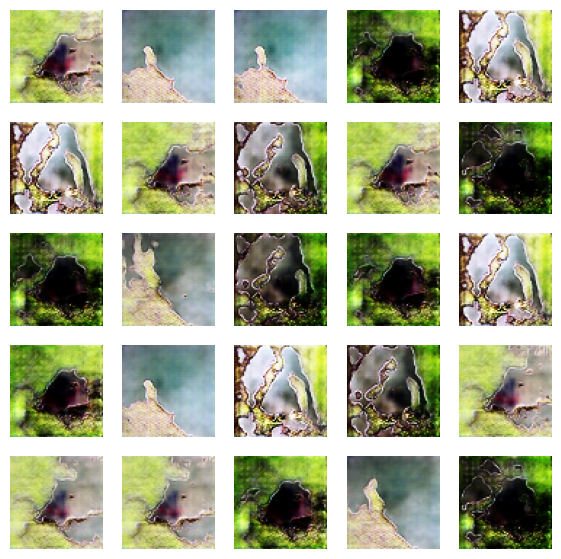

Saving checkpoint for epoch 161 at checkpoint/bert_encode/ckpt-18


Time for epoch 161 is 370.2766225337982 sec
Time for epoch 162 is 379.2084164619446 sec
Time for epoch 163 is 387.8049192428589 sec
Time for epoch 164 is 384.74752473831177 sec
Time for epoch 165 is 380.9354839324951 sec
Time for epoch 166 is 362.3226387500763 sec
Time for epoch 167 is 381.74224281311035 sec
Time for epoch 168 is 370.22276878356934 sec
Time for epoch 169 is 372.35198760032654 sec
Time for epoch 170 is 352.64294600486755 sec
D_loss [2.55554557]
G_loss [5.87183619]
D_loss [2.26364708]
G_loss [5.50576496]
D_loss [2.24523735]
G_loss [4.25702286]
D_loss [2.49399757]
G_loss [5.52418613]
D_loss [2.50306654]
G_loss [4.13377953]
D_loss [2.38395929]
G_loss [5.10701466]
D_loss [2.42122364]
G_loss [4.40414619]
D_loss [2.62015295]
G_loss [4.83944178]
D_loss [2.43108511]
G_loss [7.67922926]
D_loss [2.24208164]
G_loss [6.67660427]
D_loss [2.23810506]
G_loss [5.43228579]
D_loss [2.46265507]
G_loss [4.05545616]
D_loss [2.48151493]
G_loss [5.75709772]
D_loss [2.38715649]
G_loss [5.02135

D_loss [2.52013159]
G_loss [3.79910898]
D_loss [2.24276]
G_loss [4.71059656]
D_loss [2.25178623]
G_loss [6.19178677]
D_loss [2.19578838]
G_loss [4.84915209]
D_loss [2.5164361]
G_loss [5.74508238]
D_loss [2.39709973]
G_loss [7.4481411]
D_loss [2.29951739]
G_loss [6.42860842]
D_loss [2.33943319]
G_loss [4.73470211]
D_loss [2.45158243]
G_loss [4.42334557]
D_loss [2.57971478]
G_loss [5.2735672]
D_loss [2.58030844]
G_loss [4.35403728]
D_loss [2.31850934]
G_loss [4.74410439]
D_loss [2.60869312]
G_loss [4.32547188]
D_loss [2.06209087]
G_loss [5.08765268]
D_loss [2.41688824]
G_loss [4.86478806]
D_loss [2.36337519]
G_loss [5.16908836]
D_loss [2.40248561]
G_loss [4.49618912]
D_loss [2.37681532]
G_loss [4.3806386]
D_loss [2.33405375]
G_loss [6.08713818]
D_loss [2.40573406]
G_loss [5.28454781]
D_loss [2.50753546]
G_loss [7.4793663]
D_loss [2.5747261]
G_loss [3.99852037]
D_loss [2.26912737]
G_loss [5.39223957]
D_loss [2.3218503]
G_loss [5.85625839]
D_loss [2.37724]
G_loss [6.48407936]
D_loss [2.368

G_loss [5.17555809]
D_loss [2.0491693]
G_loss [6.2442584]
D_loss [2.31987357]
G_loss [5.24745035]
D_loss [2.43014407]
G_loss [5.9487505]
D_loss [2.30779862]
G_loss [5.45647097]
D_loss [2.33019495]
G_loss [3.71728516]
D_loss [2.3363986]
G_loss [4.75512695]
D_loss [2.31005192]
G_loss [10.6534538]
D_loss [2.38605976]
G_loss [4.47429562]
D_loss [2.27647829]
G_loss [4.98387384]
D_loss [2.25459123]
G_loss [3.88926744]
D_loss [2.38193893]
G_loss [3.7694943]
D_loss [2.54476213]
G_loss [5.41688919]
D_loss [2.38277292]
G_loss [4.41112852]
D_loss [2.36964726]
G_loss [4.66632843]
D_loss [2.58392763]
G_loss [4.45697689]
D_loss [2.36008549]
G_loss [4.49021339]
D_loss [2.33885527]
G_loss [4.14717865]
D_loss [2.40437222]
G_loss [6.16636467]
D_loss [2.38750792]
G_loss [4.90691185]
D_loss [2.35425019]
G_loss [4.51191521]
D_loss [2.36569595]
G_loss [4.86166191]
D_loss [2.22437763]
G_loss [6.06879139]
D_loss [2.64622831]
G_loss [4.11467838]
D_loss [2.23277617]
G_loss [5.37436771]
D_loss [2.33400249]
G_los

D_loss [2.44166493]
G_loss [4.73868656]
D_loss [2.55378461]
G_loss [4.12162304]
D_loss [2.36696053]
G_loss [4.41489315]
D_loss [2.31926584]
G_loss [7.47548962]
D_loss [2.57846403]
G_loss [5.1229744]
D_loss [2.41788721]
G_loss [5.09638309]
D_loss [2.36248684]
G_loss [6.58929682]
D_loss [2.36046052]
G_loss [3.96971035]
D_loss [2.46907687]
G_loss [4.24853373]
D_loss [2.24913716]
G_loss [5.04878187]
D_loss [2.36679935]
G_loss [5.35138702]
D_loss [3.08540893]
G_loss [5.75979424]
D_loss [2.77343798]
G_loss [3.51701498]
D_loss [2.46105433]
G_loss [3.9402318]
D_loss [2.50492692]
G_loss [4.56579113]
D_loss [2.42762518]
G_loss [5.44389105]
D_loss [2.4325645]
G_loss [4.65340137]
D_loss [2.56357098]
G_loss [4.59274292]
D_loss [2.31094217]
G_loss [4.46604347]
D_loss [2.28745914]
G_loss [5.82456636]
D_loss [2.33938789]
G_loss [6.94046974]
D_loss [2.67284846]
G_loss [5.12507725]
D_loss [2.34177065]
G_loss [4.25865173]
D_loss [2.6242156]
G_loss [4.04558039]
D_loss [2.32049751]
G_loss [4.33628464]
D_lo

G_loss [4.79429626]
D_loss [2.49372]
G_loss [3.9830513]
D_loss [2.59322858]
G_loss [5.35077286]
D_loss [2.26893544]
G_loss [6.43635654]
D_loss [2.57380295]
G_loss [7.67949486]
D_loss [2.52168274]
G_loss [5.62089252]
D_loss [2.45735359]
G_loss [4.5666604]
D_loss [2.31570911]
G_loss [4.61334944]
D_loss [2.63795781]
G_loss [4.78943443]
D_loss [2.72657108]
G_loss [4.55244064]
D_loss [2.37112856]
G_loss [5.08860397]
D_loss [2.30757451]
G_loss [4.94060469]
D_loss [2.39488888]
G_loss [5.12465763]
D_loss [2.34147477]
G_loss [4.43549252]
D_loss [2.37832236]
G_loss [5.27925491]
D_loss [2.28855228]
G_loss [6.94999266]
D_loss [2.39064455]
G_loss [5.79833412]
D_loss [2.25845051]
G_loss [6.2130022]
D_loss [2.30685496]
G_loss [4.83932114]
D_loss [2.43346643]
G_loss [5.20229435]
D_loss [2.47208905]
G_loss [4.19921827]
D_loss [2.4923532]
G_loss [4.62057114]
D_loss [2.36708856]
G_loss [5.5079937]
D_loss [2.3251133]
G_loss [7.25585079]
D_loss [2.20856619]
G_loss [7.83501673]
D_loss [2.54421377]
G_loss [6

D_loss [2.41239595]
G_loss [4.86978817]
D_loss [2.48950911]
G_loss [4.44283485]
D_loss [2.40158176]
G_loss [3.86112332]
D_loss [2.56680393]
G_loss [4.99761438]
D_loss [2.51796579]
G_loss [4.19329739]
D_loss [2.4478581]
G_loss [4.59282303]
D_loss [2.41281629]
G_loss [5.92630053]
D_loss [2.36135101]
G_loss [4.97065687]
D_loss [2.42631412]
G_loss [5.01572418]
D_loss [2.5423882]
G_loss [5.06717682]
D_loss [2.33113813]
G_loss [4.47307587]
D_loss [2.03715611]
G_loss [4.94767761]
D_loss [2.43994522]
G_loss [4.94058752]
D_loss [2.37268376]
G_loss [4.76676846]
D_loss [2.25486851]
G_loss [4.86371136]
D_loss [2.46315265]
G_loss [5.84775162]
D_loss [2.09634733]
G_loss [5.61461067]
D_loss [2.18656421]
G_loss [5.09507942]
D_loss [2.49755383]
G_loss [5.8866787]
D_loss [2.48853111]
G_loss [5.91551542]
D_loss [2.303298]
G_loss [5.00370312]
D_loss [2.41828966]
G_loss [4.84316]
D_loss [2.31983972]
G_loss [4.90805626]
D_loss [2.67517757]
G_loss [4.23471737]
D_loss [2.41928911]
G_loss [3.84496164]
D_loss [

D_loss [2.31032777]
G_loss [5.468575]
D_loss [2.42417622]
G_loss [4.59669304]
D_loss [2.37643385]
G_loss [5.25708485]
D_loss [2.37701583]
G_loss [4.77898502]
D_loss [2.42581916]
G_loss [4.45069885]
D_loss [2.22311354]
G_loss [5.10353184]
D_loss [2.25596905]
G_loss [5.17046833]
D_loss [2.43727446]
G_loss [4.24579144]
D_loss [2.25955629]
G_loss [5.15758705]
D_loss [2.32443595]
G_loss [5.99752808]
D_loss [2.21311736]
G_loss [5.34931469]
D_loss [2.61749601]
G_loss [5.43690109]
D_loss [2.49856329]
G_loss [5.27702475]
D_loss [2.50888205]
G_loss [3.92960548]
D_loss [2.51422882]
G_loss [5.229527]
D_loss [2.37570786]
G_loss [4.23824263]
D_loss [2.69853497]
G_loss [4.54320908]
D_loss [2.43470478]
G_loss [4.41599512]
D_loss [2.43647218]
G_loss [3.57934332]
D_loss [2.37366486]
G_loss [4.15935135]
D_loss [2.41547775]
G_loss [4.37216473]
D_loss [2.21933]
G_loss [4.78606367]
D_loss [2.39426661]
G_loss [7.48055553]
D_loss [2.29643202]
G_loss [4.87000465]
D_loss [2.44258213]
G_loss [5.50097132]
D_loss 

D_loss [2.36166501]
G_loss [5.05178928]
D_loss [2.35120034]
G_loss [4.56651306]
D_loss [2.48577356]
G_loss [6.20560884]
D_loss [2.43514848]
G_loss [6.75433636]
D_loss [2.61974049]
G_loss [5.10276365]
D_loss [2.38550377]
G_loss [4.49090481]
D_loss [2.62566]
G_loss [4.59238625]
D_loss [2.37276602]
G_loss [5.26944542]
D_loss [2.39515734]
G_loss [5.48489571]
D_loss [2.34135389]
G_loss [6.6524477]
D_loss [2.25678205]
G_loss [6.63740492]
D_loss [2.58353591]
G_loss [6.25108194]
D_loss [2.34000587]
G_loss [4.20691776]
D_loss [2.45291662]
G_loss [3.74126172]
D_loss [2.35615921]
G_loss [4.14410353]
D_loss [2.28393269]
G_loss [6.78318834]
D_loss [2.45854402]
G_loss [5.24776649]
D_loss [2.36682367]
G_loss [7.69646788]
D_loss [2.39057207]
G_loss [5.3760128]
D_loss [2.44287491]
G_loss [5.32850695]
D_loss [2.51092577]
G_loss [4.90837383]
D_loss [2.56706572]
G_loss [5.25841808]
D_loss [2.73286629]
G_loss [5.9679842]
D_loss [2.46987104]
G_loss [4.90502834]
D_loss [2.74689269]
G_loss [4.39707088]
D_loss

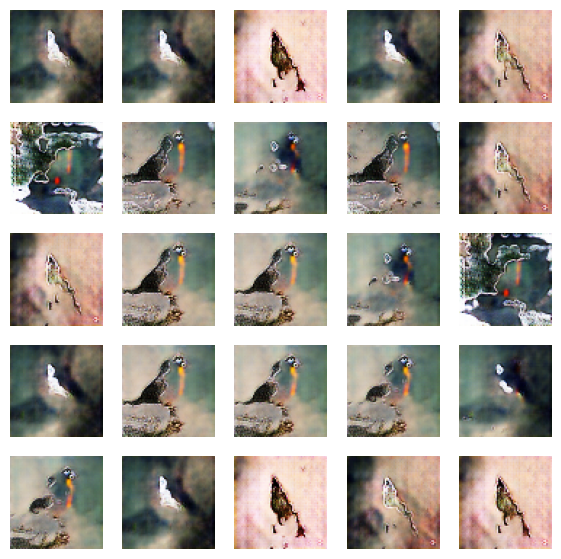

Saving checkpoint for epoch 171 at checkpoint/bert_encode/ckpt-19


Time for epoch 171 is 359.8721001148224 sec
Time for epoch 172 is 369.2642767429352 sec
Time for epoch 173 is 348.90637397766113 sec
Time for epoch 174 is 379.62408208847046 sec
Time for epoch 175 is 359.3963849544525 sec
Time for epoch 176 is 391.71312189102173 sec
Time for epoch 177 is 385.5001060962677 sec
Time for epoch 178 is 377.27948331832886 sec


KeyboardInterrupt: 

In [36]:
ms_loss_weight = 1.0
import tensorflow as tf
binary_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.000035, beta_1 = 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.000035, beta_1 = 0.5)

discriminator = define_discriminator()
generator = define_generator()

images, lbs = load_data()
BUFFER_SIZE = images.shape[0]
n_batch = 8

train_dataset = tf.data.Dataset.from_tensor_slices((images,lbs)).shuffle(BUFFER_SIZE).batch(n_batch)

train(train_dataset,n_batch,start=178)

In [ ]:
#
from keras.preprocessing.image import array_to_img

from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy import vstack
from numpy import asarray
import numpy as np

import os
from keras.callbacks import ModelCheckpoint
from keras.initializers import RandomNormal
from numpy.random import random
from tensorflow.keras import layers
from tensorflow.keras import Model
from numpy.random import randn
from numpy.random import randint
import time
import matplotlib.pyplot as pyplot
from keras.preprocessing.image import array_to_img
from numpy import linspace
import nltk
#nltk.download('punkt')
from nltk.tokenize import word_tokenize

from numpy.random import randint
import numpy as np

def create_sent_vector(sent):
    sent = [sent]
    text_preprocessed = bert_preprocess_model(sent)
    final = bert_model(text_preprocessed)
    return final['pooled_output'].numpy()
    #result_array = np.empty((0, 300))

  #for word in word_tokenize(sent):
    #result_array = np.append(result_array, [model[word]], axis=0)
  #final = np.mean(result_array, axis=0).astype('float32')
  #return final

def generate_random_word_vectors_from_dataset(n_samples, create_new_captions = False):

  if create_new_captions:
      e = create_sent_vector('This bird has  white breast with brown feathers')
      f = create_sent_vector('This bird has  white breast with blue feathers')
      v = []
      flag = False
      for i in range(n_samples):
        
        if not flag:
          v.append(f)
          flag = True
        elif flag:
          v.append(e)
          flag = False
      return np.asarray(v), np.asarray([])
  else:
    ix = randint(0,len(captions), n_samples)
    print(ix)
    return  np.asarray(captions)[ix], np.asarray(labels)[ix]

def generate_images(model, test_input):

  predictions = model(test_input, training=False)

  print(predictions.shape)
  pyplot.figure(figsize=[15, 15])
  for i in range(predictions.shape[0]):
      pyplot.subplot(1, 9, i+1)
      pyplot.imshow(array_to_img(predictions.numpy()[i]))
      pyplot.axis('off')

  pyplot.show()

# Credit to: https://machinelearningmastery.com/how-to-interpolate-and-perform-vector-arithmetic-with-faces-using-a-generative-adversarial-network/
def interpolate_points(p1, p2, n_steps=9):
	ratios = linspace(0, 1, num=n_steps)
	vectors = list()
	for ratio in ratios:
		v = (1.0 - ratio) * p1 + ratio * p2
		vectors.append(v)
	return np.asarray(vectors)
 
def generate_latent_points(latent_dim, n_samples, interpolate = False):
    x_input  = tf.random.normal([n_samples, latent_dim])
    text_captions, labels = generate_random_word_vectors_from_dataset(n_samples, create_new_captions=False)
    if interpolate:
      text_captions = interpolate_points(text_captions[0], text_captions[1])
      x_input = interpolate_points(x_input[0], x_input[1])
    for index, s in enumerate(labels.flat):
      print(index, s)

    return [x_input, text_captions]

#gen_model = tf.keras.models.load_model('/content/drive/My Drive/146stage_new_gan_animal_model_120.h5')

for i in range(40):
  generate_images(gen_model, generate_latent_points(100, 9))


In [ ]:
train(train_dataset,epochs=1135)

In [ ]:
def get_index_by_label(label):
  for idx, l in enumerate(labels):
    if l in label:
      return idx


print(get_index_by_label('Western_Wood_Pewee_0061_795060.jpg'))

In [ ]:
# Show image in image embeddings

pyplot.figure(figsize=[8, 8])

pyplot.subplot(1, 2, 0+1)
pyplot.imshow(array_to_img(image_embeddings[5432]))
pyplot.axis('off')

In [ ]:
import tensorflow as tf
gen_model = tf.keras.models.load_model('models/46stage_new_gan_animal_model_781.h5')

In [ ]:
import numpy as np
def get_random_word_vectors_from_dataset(n_samples,captions):
    ix = np.random.randint(0, len(captions), n_samples)
    return np.asarray(captions)[ix]

In [ ]:
def de7ko(cap):
    f = create_sent_vector(cap)
    v = []
    flag = False
    for i in range(1):    
        v.append(f)
        flag = True
    return np.asarray(v), np.asarray([])

In [ ]:
noise = tf.random.normal((1,100))

In [ ]:
caption, _ = de7ko('This bird is medium sized has white feather')

In [ ]:
print(noise.shape)

In [ ]:
predictions = gen_model([noise,caption], training=False)

In [ ]:
predictions.shape

In [ ]:
pyplot.figure(figsize=[5, 5])

pyplot.imshow(array_to_img(predictions.numpy()[0]))
pyplot.axis('off')

In [ ]:
from gensim.parsing.preprocessing import remove_stopwords

In [ ]:
import string

In [ ]:
from gensim.parsing.preprocessing import STOPWORDS

all_stopwords_gensim = STOPWORDS.union(set(['a']))

In [ ]:
def make_prediction(cap):
    text = cap
    cap = remove_stopwords(text)
    cap = cap.translate(str.maketrans('','', string.punctuation))
    noise = tf.random.normal((1,100))
    
    caption, _ = de7ko(cap)
    predictions = generator([noise,caption], training=False)
    pyplot.figure(figsize=[5, 5])
    pyplot.imshow(array_to_img(predictions.numpy()[0]))
    pyplot.axis('off')

In [ ]:
def make_prediction_grid(cap):
    pyplot.figure(figsize=[10, 10])

    for i in range(20):
        text = cap
        cap = remove_stopwords(text)
        cap = cap.translate(str.maketrans('','', string.punctuation))
        noise = tf.random.normal((1,100))
    
        caption, _ = de7ko(cap)
        predictions = gen_model([noise,caption], training=False)
    
        pyplot.subplot(5, 5, i+1)
        pyplot.imshow(array_to_img(predictions.numpy()[0]))
        pyplot.axis('off')
    

In [ ]:
make_prediction_grid('This bird is blue')

In [ ]:
testo = create_sent_vector('hi')

In [ ]:
len(testo)

In [ ]:
testo

In [ ]:
testo1 = create_sent_vector('fasdfgea ghtea')

In [ ]:
testo1.shape